In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# %cd /content/drive/MyDrive/Term 8/Term 8 Artificial Intelligence/folder
# %cd /content/drive/MyDrive/CellCount

/content/drive/MyDrive/CellCount


In [1]:
!git clone https://github.com/Bjarten/early-stopping-pytorch.git ./earlystopping

fatal: destination path './earlystopping' already exists and is not an empty directory.


In [1]:
!pip install efficientnet_pytorch

In [1]:
import os
import torch
import datetime
from efficientnet_pytorch import EfficientNet
from model import *
from utils import *
import numpy as np
from tqdm import tqdm
from PIL import Image
from skimage import io
from torch.optim import Adam
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision import transforms
from scipy.io import loadmat, savemat
from torch.utils.data import Dataset, DataLoader
from earlystopping.pytorchtools import EarlyStopping
from torch.utils.data.sampler import SubsetRandomSampler

# ignore

Populating the interactive namespace from numpy and matplotlib


/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


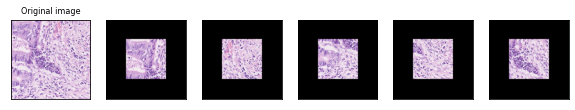

<Figure size 7200x7200 with 0 Axes>

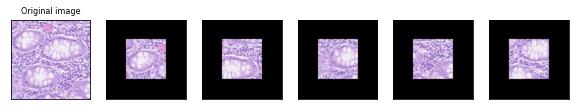

<Figure size 7200x7200 with 0 Axes>

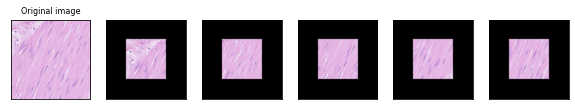

<Figure size 7200x7200 with 0 Axes>

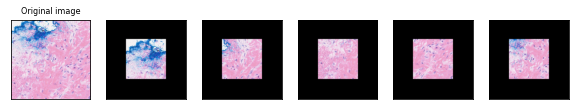

<Figure size 7200x7200 with 0 Axes>

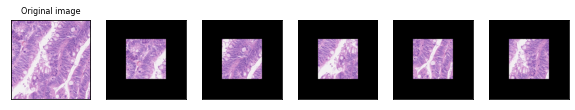

<Figure size 7200x7200 with 0 Axes>

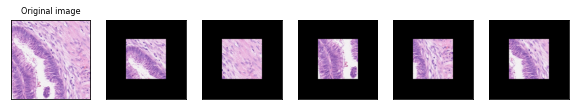

<Figure size 7200x7200 with 0 Axes>

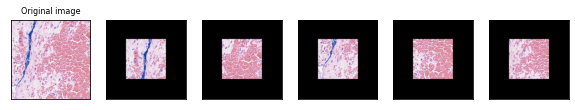

<Figure size 7200x7200 with 0 Axes>

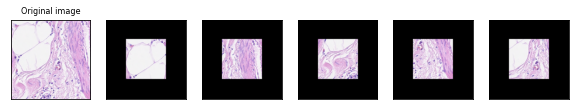

<Figure size 7200x7200 with 0 Axes>

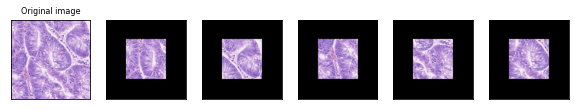

<Figure size 7200x7200 with 0 Axes>

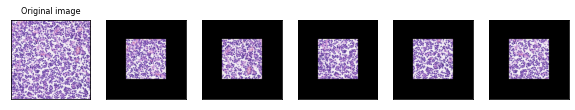

<Figure size 7200x7200 with 0 Axes>

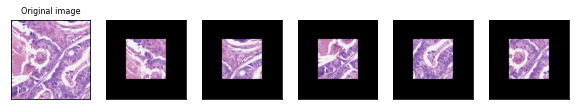

<Figure size 7200x7200 with 0 Axes>

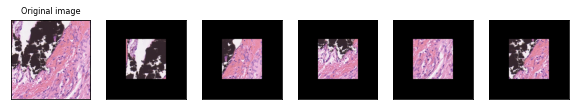

<Figure size 7200x7200 with 0 Axes>

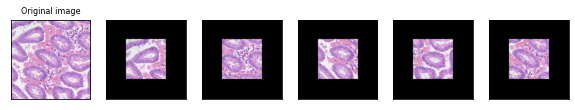

<Figure size 7200x7200 with 0 Axes>

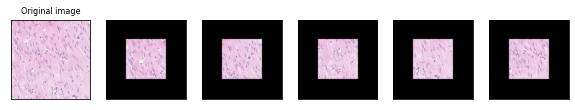

<Figure size 7200x7200 with 0 Axes>

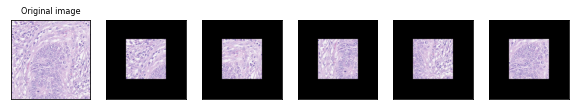

<Figure size 7200x7200 with 0 Axes>

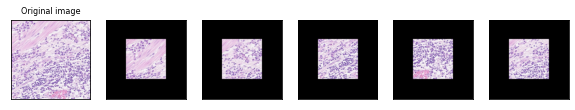

<Figure size 7200x7200 with 0 Axes>

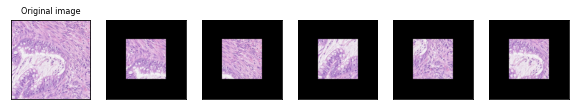

<Figure size 7200x7200 with 0 Axes>

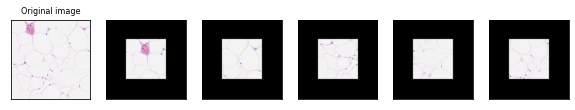

<Figure size 7200x7200 with 0 Axes>

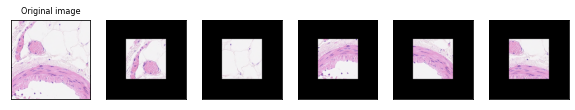

<Figure size 7200x7200 with 0 Axes>

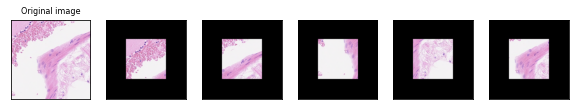

<Figure size 7200x7200 with 0 Axes>

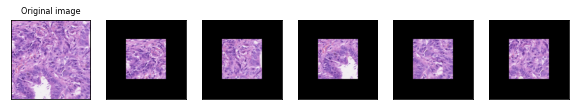

<Figure size 7200x7200 with 0 Axes>

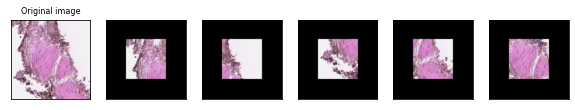

<Figure size 7200x7200 with 0 Axes>

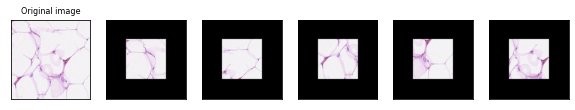

<Figure size 7200x7200 with 0 Axes>

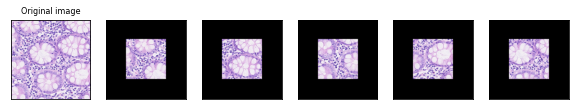

<Figure size 7200x7200 with 0 Axes>

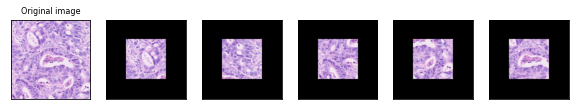

<Figure size 7200x7200 with 0 Axes>

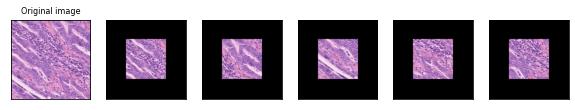

<Figure size 7200x7200 with 0 Axes>

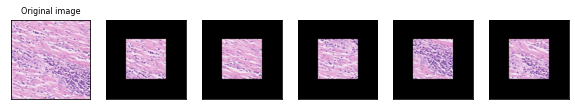

<Figure size 7200x7200 with 0 Axes>

In [ ]:
%pylab inline
import torchvision.transforms as T
from torch.nn import ConstantPad2d
import numpy as np

def plot(imgs, orig_img, with_orig=True, row_title=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False, figsize=(10, 10))
    fig = plt.figure(figsize=(100, 100))
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()
    
def pad_with(vector, pad_width, iaxis, kwargs):
    pad_value = kwargs.get('padder', 10)
    vector[:pad_width[0]] = pad_value
    vector[-pad_width[1]:] = pad_value

def five_crop():
    root_dir = "./Train"
    fileNames = [i[:-4] for i in sorted(os.listdir(root_dir+"/Labels/"))]
    img_path = "./cropped_train/Images/"
    label_path = "./cropped_train/Labels/"
    for idx in range(len(fileNames)):
        size = 500
        img_name = os.path.join(root_dir,"Images", fileNames[idx])+".png"
        mask_name = os.path.join(root_dir,"Labels", fileNames[idx])+".mat"
        dictmat = loadmat(mask_name)
        orig_img = Image.open(img_name)
        (top_left, top_right, bottom_left, bottom_right, center) = T.FiveCrop(size=(size, size))(orig_img)
        cropped = [top_left, top_right, bottom_left, bottom_right, center]
        
        orig_img.save(img_path + fileNames[idx] + "_original.png")
        savemat(label_path + fileNames[idx] + "_original.mat", {"inst_map": dictmat["inst_map"]})    
        for img_idx in range(len(cropped)):
            name = ""
            labels = {}
            if img_idx == 0:
                name = "top_left"
                labels["inst_map"] = dictmat["inst_map"][0:size, 0:size]
            elif img_idx == 1:
                name = "top_right"
                labels["inst_map"] = dictmat["inst_map"][0:size, 1000-size:1000]
            elif img_idx == 2:
                name = "bottom_left"
                labels["inst_map"] = dictmat["inst_map"][1000-size:1000, 0:size]
            elif img_idx == 3:
                name = "bottom_right"
                labels["inst_map"] = dictmat["inst_map"][1000-size:1000, 1000-size:1000]
            elif img_idx == 4:
                name = "center"
                mid_height = 1000/2
                mid_weight = 1000/2
                labels["inst_map"] = dictmat["inst_map"][round(mid_height-size/2):round(mid_height+size/2), round(mid_weight-size/2):round(mid_weight+size/2)]
            
            ## pad images and labels
            cropped[img_idx] = T.Pad(padding=250, fill=(0,0,0), padding_mode='constant')(cropped[img_idx])
            labels["inst_map"] = np.pad(labels["inst_map"], 1, pad_with, padder=0)
            ## save 
            cropped[img_idx].save(img_path + fileNames[idx] + "_" +name+".png")            
            savemat(label_path + fileNames[idx] + "_" +name+".mat", labels)           
        plot(cropped, orig_img)
#         if idx == 0:        
#             break
    
five_crop()

In [ ]:
before = "./Train/Labels/train_1.mat"
after = "./cropped_train/Labels/train_1_original.mat"

dictmat_before = loadmat(before)
dictmat_after = loadmat(after)
print(dictmat_before["inst_map"] == dictmat_after["inst_map"])

a = np.arange(6)
a = a.reshape((2, 3))
print(a)
pad = np.pad(a, 2, pad_with, padder=100)
print(pad)

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


# Start here

In [2]:
class CellDataset(Dataset):

    def __init__(self, root_dir, transform=None):
        self.fileNames = [i[:-4] for i in sorted(os.listdir(root_dir+"/Labels/"))]
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.fileNames)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir,"Images",self.fileNames[idx])+".png"
        image = img = Image.open(img_name).convert('RGB')
        mask_name = os.path.join(self.root_dir,"Labels",self.fileNames[idx])+".mat"
        mask = np.pad((loadmat(mask_name)['inst_map']>=1).astype(int),3)
        if self.transform:
            image = self.transform(image)

        return image, mask

In [3]:
transform = transforms.Compose([
    transforms.Pad(3),
    transforms.ToTensor()    
])

valid_size = 0.2
batch_size =1

# DataLoader
train_data = CellDataset(root_dir="./Train/train_250", transform = transform)
test_data = CellDataset(root_dir="./Test/test_250", transform = transform)

# obtain training indices that will be used for validation
num_train = len(train_data)
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_idx, valid_idx = indices[split:], indices[:split]

# define samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

# load training data in batches
train_loader = DataLoader(train_data,
                          batch_size=batch_size,
                          sampler=train_sampler,
                          num_workers=0)

# load validation data in batches
valid_loader = DataLoader(train_data,
                          batch_size=batch_size,
                          sampler=valid_sampler,
                          num_workers=0)

# load test data in batches
test_loader = DataLoader(test_data,
                        batch_size=batch_size,
                        num_workers=0)

## Training

In [4]:
def weighted_loss(pred,targ,bce_weight=0.5, smooth=1.):
    
    bce = F.binary_cross_entropy_with_logits(pred.squeeze(dim=1), targ)
    
    pred = torch.sigmoid(pred)
    
    pred = pred.contiguous().squeeze(dim=1)  
    targ = targ.contiguous()  

    intersection = (pred * targ).sum(dim=1).sum(dim=1)
    dice = (1 - ((2. * intersection + smooth) / (pred.sum(dim=1).sum(dim=1) + targ.sum(dim=1).sum(dim=1) + smooth)))
    
    loss = bce * bce_weight + dice.mean() * (1 - bce_weight)
    
    return loss


def dice_metric(pred,targ,bce_weight=0.5, smooth=1.):
    
    bce = F.binary_cross_entropy_with_logits(pred.squeeze(dim=1), targ)
    
    pred = torch.sigmoid(pred)
    
    pred = pred.contiguous().squeeze(dim=1)  
    targ = targ.contiguous()  

    intersection = (pred * targ).sum(dim=1).sum(dim=1)
    union = targ.sum() + pred.sum()
    

    dice = (1 - ((2. * intersection + smooth) / (pred.sum(dim=1).sum(dim=1) + targ.sum(dim=1).sum(dim=1) + smooth)))
    # print(intersection / union, dice)
    
    return dice


def train(model, device, train_loader, valid_loader, optimizer, epochs, patience):
    train_losses = []
    valid_losses = []
    avg_train_losses = [] # average training loss per epoch
    avg_valid_losses = [] # average validation loss per epoch
    
    os.makedirs("model_checkpoints", exist_ok=True)
    save_path = f"model_checkpoints/{model.__class__.__name__}.pt"
    early_stopping = EarlyStopping(patience=patience, path=save_path, verbose=True)
    for epoch in tqdm(range(1, epochs + 1)):
        train_loss = 0
        valid_loss = 0
        """
        Trains the model on training data
        """
        for batch_idx, (data, target) in enumerate(train_loader):
            model.train()
            data, target = data.to(device), target.to(device).float()

            optimizer.zero_grad()
            output = model(data)
            loss = weighted_loss(output,target,bce_weight=0.3)
            loss.backward()
            optimizer.step()

            train_loss+=(loss/len(data)).item()
            train_losses.append(loss.item())
            # Find accuracy
        
        """
        Validate the model on validation data
        """
        model.eval() 
        for batch_idx, (data, target) in enumerate(valid_loader):
            data, target = data.to(device), target.to(device).float()
            output = model(data)
            loss = weighted_loss(output,target,bce_weight=0.3)
            valid_loss+=(loss/len(data)).item()
            valid_losses.append(loss.item())
            

        train_loss /= len(train_loader)
        valid_loss /= len(valid_loader)

        # average loss over an epoch
        train_loss = np.average(train_losses)
        valid_loss = np.average(valid_losses)
        avg_train_losses.append(train_loss)
        avg_valid_losses.append(valid_loss)

        # clear lists to track next epoch
        train_losses = []
        valid_losses = []

        # early_stopping needs the validation loss to check if it has decresed, 
        # and if it has, it will make a checkpoint of the current model
        early_stopping(valid_loss, model)

        if early_stopping.early_stop:
            print("Early stopping")
            break

        print('Train Epoch: {} @ {} - Train Loss: {:.4f} - Valid Loss: {:.4f}'.format(epoch, datetime.datetime.now().time(), train_loss, valid_loss))

    # load the last checkpoint with the best model
    model.load_state_dict(torch.load(save_path)) 

    return  model, avg_train_losses, avg_valid_losses

In [5]:
# Set cpu / gpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize model and optimizer
model = build_model(device, "efficientnet", EfficientNet)
model.to(device)

lr = 0.001
optimizer = Adam(model.parameters(), lr=lr)

Loaded pretrained weights for efficientnet-b0


In [6]:
print("Training")
# Training the model
epochs = 60
lr = 0.001
patience = 10  # how long to wait after last time validation loss improved
optimizer = Adam(model.parameters(), lr=lr)

model, train_loss, valid_loss = train(model, device, train_loader, valid_loader, optimizer, epochs, patience)

  0%|          | 0/60 [00:00<?, ?it/s]

Training
Validation loss decreased (inf --> 0.353235).  Saving model ...


  2%|▏         | 1/60 [01:08<1:07:25, 68.56s/it]

Train Epoch: 1 @ 09:09:05.895816 - Train Loss: 0.3806 - Valid Loss: 0.3532
Validation loss decreased (0.353235 --> 0.335109).  Saving model ...


  3%|▎         | 2/60 [02:16<1:06:08, 68.42s/it]

Train Epoch: 2 @ 09:10:13.975429 - Train Loss: 0.3032 - Valid Loss: 0.3351
Validation loss decreased (0.299011 --> 0.274693).  Saving model ...


  8%|▊         | 5/60 [05:38<1:02:07, 67.77s/it]

Train Epoch: 5 @ 09:13:36.318607 - Train Loss: 0.2470 - Valid Loss: 0.2747


 10%|█         | 6/60 [06:46<1:00:51, 67.62s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 09:14:43.583388 - Train Loss: 0.2406 - Valid Loss: 0.3364


 12%|█▏        | 7/60 [07:53<59:42, 67.59s/it]  

EarlyStopping counter: 2 out of 10
Train Epoch: 7 @ 09:15:51.106411 - Train Loss: 0.2394 - Valid Loss: 0.3218


 13%|█▎        | 8/60 [09:01<58:36, 67.62s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 8 @ 09:16:58.787235 - Train Loss: 0.2488 - Valid Loss: 0.2925


 15%|█▌        | 9/60 [10:08<57:26, 67.58s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 9 @ 09:18:06.273286 - Train Loss: 0.2244 - Valid Loss: 0.2796


 17%|█▋        | 10/60 [11:16<56:18, 67.56s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 10 @ 09:19:13.795977 - Train Loss: 0.2183 - Valid Loss: 0.3211


 18%|█▊        | 11/60 [12:23<55:08, 67.51s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 11 @ 09:20:21.201216 - Train Loss: 0.2142 - Valid Loss: 0.2821


 20%|██        | 12/60 [13:31<54:04, 67.60s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 12 @ 09:21:29.007132 - Train Loss: 0.2156 - Valid Loss: 0.2867
Validation loss decreased (0.274693 --> 0.272961).  Saving model ...


 22%|██▏       | 13/60 [14:38<52:46, 67.38s/it]

Train Epoch: 13 @ 09:22:35.866779 - Train Loss: 0.2091 - Valid Loss: 0.2730


 23%|██▎       | 14/60 [15:45<51:34, 67.27s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 14 @ 09:23:42.883496 - Train Loss: 0.2065 - Valid Loss: 0.2868


 25%|██▌       | 15/60 [16:52<50:25, 67.22s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 15 @ 09:24:50.001237 - Train Loss: 0.2144 - Valid Loss: 0.2757
Validation loss decreased (0.272961 --> 0.267713).  Saving model ...


 27%|██▋       | 16/60 [17:59<49:17, 67.21s/it]

Train Epoch: 16 @ 09:25:57.170995 - Train Loss: 0.2166 - Valid Loss: 0.2677


 28%|██▊       | 17/60 [19:06<48:04, 67.08s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 17 @ 09:27:03.940752 - Train Loss: 0.2079 - Valid Loss: 0.3474


 30%|███       | 18/60 [20:13<46:56, 67.06s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 18 @ 09:28:10.971871 - Train Loss: 0.2158 - Valid Loss: 0.3239


 32%|███▏      | 19/60 [21:20<45:46, 66.99s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 19 @ 09:29:17.791415 - Train Loss: 0.2122 - Valid Loss: 0.2808


 33%|███▎      | 20/60 [22:27<44:39, 66.98s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 20 @ 09:30:24.742796 - Train Loss: 0.1987 - Valid Loss: 0.2710


 35%|███▌      | 21/60 [23:34<43:31, 66.97s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 21 @ 09:31:31.706324 - Train Loss: 0.1984 - Valid Loss: 0.2702


 37%|███▋      | 22/60 [24:41<42:21, 66.88s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 22 @ 09:32:38.373558 - Train Loss: 0.2045 - Valid Loss: 0.3119


 38%|███▊      | 23/60 [25:47<41:13, 66.84s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 23 @ 09:33:45.109573 - Train Loss: 0.2052 - Valid Loss: 0.3057
Validation loss decreased (0.267713 --> 0.253288).  Saving model ...


 40%|████      | 24/60 [26:55<40:11, 66.98s/it]

Train Epoch: 24 @ 09:34:52.436848 - Train Loss: 0.1909 - Valid Loss: 0.2533


 42%|████▏     | 25/60 [28:01<39:02, 66.92s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 25 @ 09:35:59.210136 - Train Loss: 0.1928 - Valid Loss: 0.2574


 43%|████▎     | 26/60 [29:08<37:54, 66.90s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 26 @ 09:37:06.046209 - Train Loss: 0.1843 - Valid Loss: 0.3611


 45%|████▌     | 27/60 [30:15<36:47, 66.89s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 27 @ 09:38:12.908065 - Train Loss: 0.1813 - Valid Loss: 0.2536


 47%|████▋     | 28/60 [31:22<35:39, 66.86s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 28 @ 09:39:19.717607 - Train Loss: 0.1860 - Valid Loss: 0.2911


 48%|████▊     | 29/60 [32:29<34:33, 66.90s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 29 @ 09:40:26.714901 - Train Loss: 0.1903 - Valid Loss: 0.2913


 50%|█████     | 30/60 [33:35<33:22, 66.75s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 30 @ 09:41:33.091648 - Train Loss: 0.1754 - Valid Loss: 0.2738


 52%|█████▏    | 31/60 [34:41<32:03, 66.32s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 31 @ 09:42:38.419686 - Train Loss: 0.1772 - Valid Loss: 0.2734


 53%|█████▎    | 32/60 [35:46<30:47, 65.97s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 32 @ 09:43:43.569158 - Train Loss: 0.1707 - Valid Loss: 0.2569


 55%|█████▌    | 33/60 [36:51<29:33, 65.68s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 33 @ 09:44:48.574283 - Train Loss: 0.1718 - Valid Loss: 0.3298


 55%|█████▌    | 33/60 [37:56<31:02, 69.00s/it]

EarlyStopping counter: 10 out of 10
Early stopping


# Graphs

In [5]:
def plot_graph(train_loss, valid_loss):
  fig = plt.figure(figsize=(10,8))
  plt.plot(range(1,len(train_loss)+1),train_loss, label='Training Loss')
  plt.plot(range(1,len(valid_loss)+1),valid_loss,label='Validation Loss')

  # find position of lowest validation loss
  minposs = valid_loss.index(min(valid_loss))+1 
  plt.axvline(minposs, linestyle='--', color='r',label='Early Stopping Checkpoint')

  plt.xlabel('epochs')
  plt.ylabel('loss')
  plt.ylim(0, 0.5) # consistent scale
  plt.xlim(0, len(train_loss)+1) # consistent scale
  plt.grid(True)
  plt.legend()
  plt.tight_layout()
  plt.show()
  fig.savefig('loss_plot.png', bbox_inches='tight')

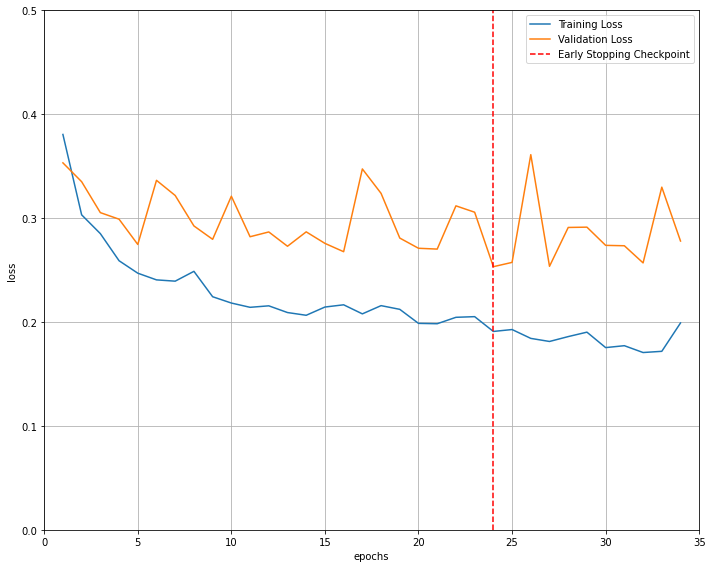

In [8]:
plot_graph(train_loss, valid_loss)

# Load model


In [ ]:
# load saved model
def load_model(model):
  path = f"model_checkpoints/{model.__class__.__name__}.pt"
  model.load_state_dict(torch.load(path)) 
  model.eval()
  return model
model = load_model(model)

# Test

In [6]:
def test(model, device, data, target):
    print("Input Image")
    plt.imshow(data[0].numpy().transpose(1, 2, 0))
    plt.show()
    outputs = model(data.to(device))
    pred = outputs.to('cpu').detach().numpy()[0][0]

    print("Predicted Mask Sigmoid")
    plt.imshow(pred,cmap='gray')
    plt.show()
    threshold=0.95
    pred[pred >= threshold] = 1
    pred[pred < threshold] = 0
    print("Predicted Mask Binary")
    plt.imshow(pred,cmap='gray')
    plt.show()
    print("Actual Mask")
    plt.imshow(target[0],cmap='gray')
    plt.show()

    # iou
    iou_score = iou(target, pred)
    print("iou score:", iou_score)

    # AJI
    aji_score = get_fast_aji(target, pred)
    print("AJI score:", aji_score)

    # AJI+
    aji_plus_score = get_fast_aji_plus(target, pred)
    print("AJI+ score:", aji_plus_score)

    # PQ
    pq_score = get_fast_pq(target, pred)[0]
    print("Detection Quality (DQ):", pq_score[0])
    print("Segmentation Quality (SQ):", pq_score[1])
    print("Panoptic Quality (PQ):", pq_score[2])

    # Dice2
    dice2_score = get_fast_dice_2(target, pred)
    print("Dice2 score:", dice2_score, "\n")

    return iou_score, aji_score, aji_plus_score, pq_score, dice2_score

Input Image


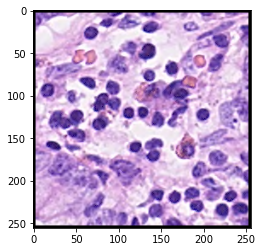

Predicted Mask Sigmoid


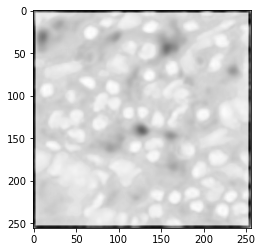

Predicted Mask Binary


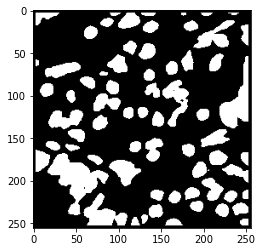

Actual Mask


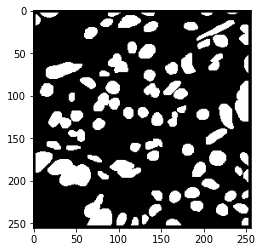

iou score: 0.7587632102124098
AJI score: 0.7587632102124098
AJI+ score: 0.7587632102124098
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7587624514499584
Panoptic Quality (PQ): 0.7587624514499584
Dice2 score: 0.862837254960288 



In [10]:
# Testing the model
for data, target in test_loader:
    iou_score, aji_score, aji_plus_score, pq_score, dice2_score = test(model, device, data, target)
    break

# Hyperparameter Tuning

In [7]:
def hyperparam_tuning(train_dir, test_dir, bs, lr, epochs, patience):
    print("Batch size: {}, Learning rate: {} , Epochs: {}\n".format(bs, lr, epochs))
    
    valid_size = 0.2
    batch_size =1

    # DataLoader
    train_data = CellDataset(root_dir=train_dir, transform = transform)
    test_data = CellDataset(root_dir=test_dir, transform = transform)

    # obtain training indices that will be used for validation
    num_train = len(train_data)
    indices = list(range(num_train))
    np.random.shuffle(indices)
    split = int(np.floor(valid_size * num_train))
    train_idx, valid_idx = indices[split:], indices[:split]

    # define samplers for obtaining training and validation batches
    train_sampler = SubsetRandomSampler(train_idx)
    valid_sampler = SubsetRandomSampler(valid_idx)

    # load training data in batches
    train_loader = DataLoader(train_data,
                              batch_size=batch_size,
                              sampler=train_sampler,
                              num_workers=0)

    # load validation data in batches
    valid_loader = DataLoader(train_data,
                              batch_size=batch_size,
                              sampler=valid_sampler,
                              num_workers=0)

    # load test data in batches
    test_loader = DataLoader(test_data,
                            batch_size=batch_size,
                            num_workers=0)
    
    # Set cpu / gpu
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialize model and optimizer
    model = build_model(device, "efficientnet", EfficientNet)
    model.to(device)
    optimizer = Adam(model.parameters(), lr=lr)
    
    # Train model
    model, train_loss, valid_loss = train(model, device, train_loader, valid_loader, optimizer, epochs, patience)
    plot_graph(train_loss, valid_loss)
    
    # Test model
    for data, target in test_loader:
        iou_score, aji_score, aji_plus_score, pq_score, dice2_score = test(model, device, data, target)
        break

#### Model with 2 layers

250 x 250 images (best: lr 0.001, batch size 4, iou score 0.7417748917748918)

Batch size: 1, Learning rate: 0.001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.336108).  Saving model ...


  2%|▏         | 1/60 [00:45<44:58, 45.74s/it]

Train Epoch: 1 @ 18:42:16.574120 - Train Loss: 0.3940 - Valid Loss: 0.3361
Validation loss decreased (0.336108 --> 0.310396).  Saving model ...


  3%|▎         | 2/60 [01:29<43:30, 45.00s/it]

Train Epoch: 2 @ 18:42:59.856545 - Train Loss: 0.3157 - Valid Loss: 0.3104
Validation loss decreased (0.310396 --> 0.287649).  Saving model ...


  5%|▌         | 3/60 [02:12<42:16, 44.51s/it]

Train Epoch: 3 @ 18:43:43.217484 - Train Loss: 0.3075 - Valid Loss: 0.2876
Validation loss decreased (0.287649 --> 0.284506).  Saving model ...


  7%|▋         | 4/60 [02:56<41:19, 44.27s/it]

Train Epoch: 4 @ 18:44:26.947381 - Train Loss: 0.2844 - Valid Loss: 0.2845


  8%|▊         | 5/60 [03:40<40:29, 44.17s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 18:45:10.856332 - Train Loss: 0.2612 - Valid Loss: 0.3154


 10%|█         | 6/60 [04:24<39:42, 44.13s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 6 @ 18:45:54.901024 - Train Loss: 0.2618 - Valid Loss: 0.3270


 12%|█▏        | 7/60 [05:08<39:02, 44.19s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 7 @ 18:46:39.245498 - Train Loss: 0.2600 - Valid Loss: 0.3619


 13%|█▎        | 8/60 [05:51<38:07, 43.99s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 8 @ 18:47:22.759442 - Train Loss: 0.2770 - Valid Loss: 0.3163


 15%|█▌        | 9/60 [06:36<37:27, 44.06s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 9 @ 18:48:06.983258 - Train Loss: 0.2514 - Valid Loss: 0.2895


 17%|█▋        | 10/60 [07:18<36:23, 43.67s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 10 @ 18:48:49.731591 - Train Loss: 0.2308 - Valid Loss: 0.2917
Validation loss decreased (0.284506 --> 0.282582).  Saving model ...


 18%|█▊        | 11/60 [08:02<35:31, 43.50s/it]

Train Epoch: 11 @ 18:49:32.857617 - Train Loss: 0.2418 - Valid Loss: 0.2826


 20%|██        | 12/60 [08:44<34:37, 43.29s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 18:50:15.633898 - Train Loss: 0.2270 - Valid Loss: 0.2883
Validation loss decreased (0.282582 --> 0.276648).  Saving model ...


 22%|██▏       | 13/60 [09:28<33:53, 43.27s/it]

Train Epoch: 13 @ 18:50:58.883328 - Train Loss: 0.2187 - Valid Loss: 0.2766


 23%|██▎       | 14/60 [10:10<33:03, 43.13s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 14 @ 18:51:41.672827 - Train Loss: 0.2430 - Valid Loss: 0.3017


 25%|██▌       | 15/60 [10:55<32:36, 43.47s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 15 @ 18:52:25.942661 - Train Loss: 0.2417 - Valid Loss: 0.2854
Validation loss decreased (0.276648 --> 0.268297).  Saving model ...


 27%|██▋       | 16/60 [11:40<32:13, 43.93s/it]

Train Epoch: 16 @ 18:53:10.952102 - Train Loss: 0.2135 - Valid Loss: 0.2683
Validation loss decreased (0.268297 --> 0.266011).  Saving model ...


 28%|██▊       | 17/60 [12:23<31:19, 43.71s/it]

Train Epoch: 17 @ 18:53:54.148412 - Train Loss: 0.2102 - Valid Loss: 0.2660
Validation loss decreased (0.266011 --> 0.259513).  Saving model ...


 30%|███       | 18/60 [13:07<30:44, 43.92s/it]

Train Epoch: 18 @ 18:54:38.543457 - Train Loss: 0.2110 - Valid Loss: 0.2595


 32%|███▏      | 19/60 [13:50<29:44, 43.52s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 19 @ 18:55:21.126370 - Train Loss: 0.2029 - Valid Loss: 0.4604


 33%|███▎      | 20/60 [14:33<29:02, 43.56s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 20 @ 18:56:04.786863 - Train Loss: 0.1915 - Valid Loss: 0.2651
Validation loss decreased (0.259513 --> 0.249387).  Saving model ...


 35%|███▌      | 21/60 [15:16<28:11, 43.37s/it]

Train Epoch: 21 @ 18:56:47.714118 - Train Loss: 0.1878 - Valid Loss: 0.2494


 37%|███▋      | 22/60 [16:00<27:35, 43.55s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 22 @ 18:57:31.697791 - Train Loss: 0.1894 - Valid Loss: 0.2999


 38%|███▊      | 23/60 [16:43<26:45, 43.39s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 23 @ 18:58:14.718824 - Train Loss: 0.2192 - Valid Loss: 0.3050


 40%|████      | 24/60 [17:26<25:58, 43.30s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 24 @ 18:58:57.814334 - Train Loss: 0.2411 - Valid Loss: 0.2815


 42%|████▏     | 25/60 [18:11<25:26, 43.62s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 25 @ 18:59:42.156850 - Train Loss: 0.2082 - Valid Loss: 0.3036


 43%|████▎     | 26/60 [18:55<24:44, 43.65s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 26 @ 19:00:25.888503 - Train Loss: 0.1948 - Valid Loss: 0.2609


 45%|████▌     | 27/60 [19:38<23:58, 43.58s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 27 @ 19:01:09.304560 - Train Loss: 0.1942 - Valid Loss: 0.2656


 47%|████▋     | 28/60 [20:21<23:12, 43.52s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 28 @ 19:01:52.696742 - Train Loss: 0.2027 - Valid Loss: 0.3135


 48%|████▊     | 29/60 [21:05<22:34, 43.69s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 29 @ 19:02:36.784447 - Train Loss: 0.1787 - Valid Loss: 0.2615


 50%|█████     | 30/60 [21:49<21:49, 43.65s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 30 @ 19:03:20.336727 - Train Loss: 0.1736 - Valid Loss: 0.4076


 50%|█████     | 30/60 [22:31<22:31, 45.06s/it]

EarlyStopping counter: 10 out of 10
Early stopping


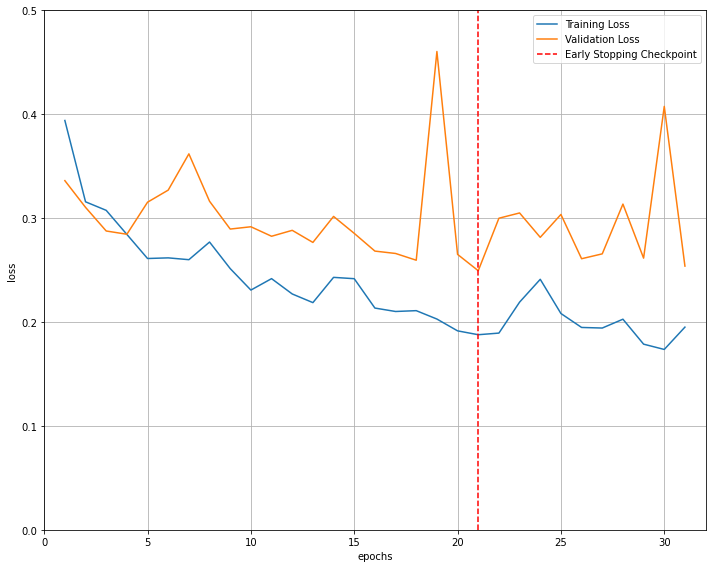

Input Image


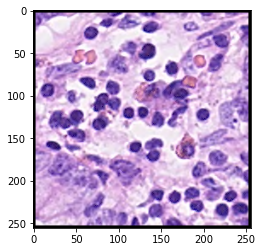

Predicted Mask Sigmoid


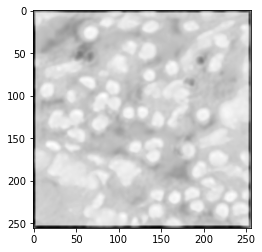

Predicted Mask Binary


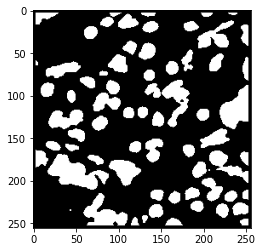

Actual Mask


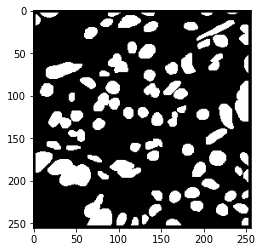

iou score: 0.749083178315174
AJI score: 0.749083178315174
AJI+ score: 0.749083178315174
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7490824292327448
Panoptic Quality (PQ): 0.7490824292327448
Dice2 score: 0.8565438026071895 

Batch size: 1, Learning rate: 0.0001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.322916).  Saving model ...


  2%|▏         | 1/60 [00:43<42:57, 43.68s/it]

Train Epoch: 1 @ 19:04:47.828906 - Train Loss: 0.4240 - Valid Loss: 0.3229
Validation loss decreased (0.322916 --> 0.308836).  Saving model ...


  3%|▎         | 2/60 [01:26<41:57, 43.40s/it]

Train Epoch: 2 @ 19:05:30.580276 - Train Loss: 0.3141 - Valid Loss: 0.3088
Validation loss decreased (0.308836 --> 0.284798).  Saving model ...


  5%|▌         | 3/60 [02:11<41:36, 43.79s/it]

Train Epoch: 3 @ 19:06:15.273074 - Train Loss: 0.2707 - Valid Loss: 0.2848


  7%|▋         | 4/60 [02:54<40:45, 43.68s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 4 @ 19:06:58.691505 - Train Loss: 0.2488 - Valid Loss: 0.3137


  8%|▊         | 5/60 [03:36<39:36, 43.21s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 5 @ 19:07:40.822072 - Train Loss: 0.2305 - Valid Loss: 0.3856
Validation loss decreased (0.284798 --> 0.259953).  Saving model ...


 10%|█         | 6/60 [04:20<38:56, 43.26s/it]

Train Epoch: 6 @ 19:08:24.198271 - Train Loss: 0.2108 - Valid Loss: 0.2600


 12%|█▏        | 7/60 [05:03<38:18, 43.37s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 19:09:07.806851 - Train Loss: 0.2020 - Valid Loss: 0.2801


 13%|█▎        | 8/60 [05:45<37:16, 43.01s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 8 @ 19:09:49.999170 - Train Loss: 0.1850 - Valid Loss: 0.2622


 15%|█▌        | 9/60 [06:28<36:32, 42.98s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 9 @ 19:10:32.902547 - Train Loss: 0.1769 - Valid Loss: 0.2658


 17%|█▋        | 10/60 [07:11<35:48, 42.98s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 10 @ 19:11:15.879242 - Train Loss: 0.1680 - Valid Loss: 0.3277


 18%|█▊        | 11/60 [07:54<35:00, 42.86s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 11 @ 19:11:58.474012 - Train Loss: 0.2192 - Valid Loss: 0.2989


 20%|██        | 12/60 [08:36<34:10, 42.72s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 12 @ 19:12:40.859674 - Train Loss: 0.1942 - Valid Loss: 0.2808


 22%|██▏       | 13/60 [09:20<33:35, 42.89s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 13 @ 19:13:24.156578 - Train Loss: 0.1609 - Valid Loss: 0.2608


 23%|██▎       | 14/60 [10:04<33:11, 43.30s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 14 @ 19:14:08.400824 - Train Loss: 0.1730 - Valid Loss: 0.2819


 25%|██▌       | 15/60 [10:47<32:26, 43.25s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 15 @ 19:14:51.543399 - Train Loss: 0.1485 - Valid Loss: 0.3037


 25%|██▌       | 15/60 [11:32<34:37, 46.17s/it]

EarlyStopping counter: 10 out of 10
Early stopping


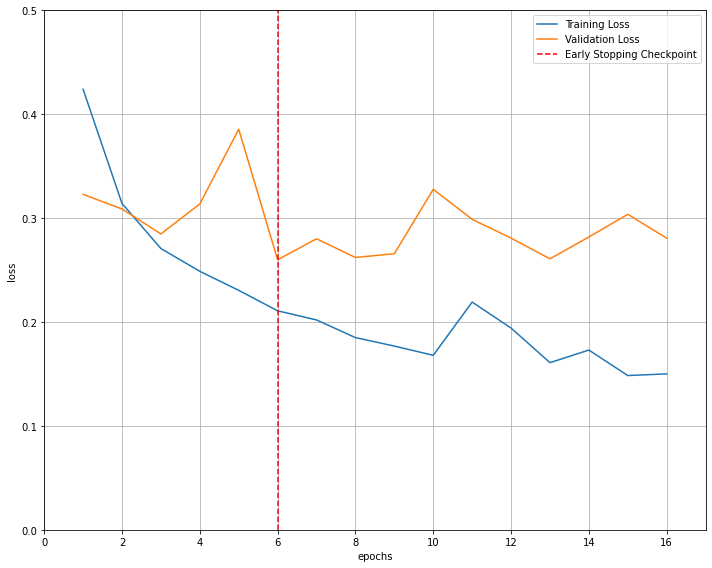

Input Image


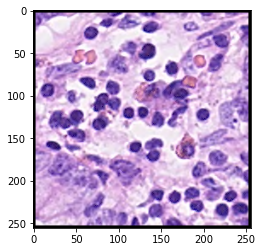

Predicted Mask Sigmoid


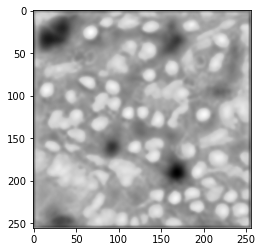

Predicted Mask Binary


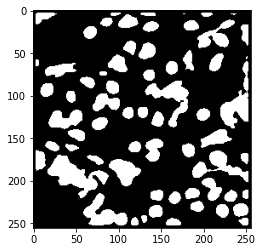

Actual Mask


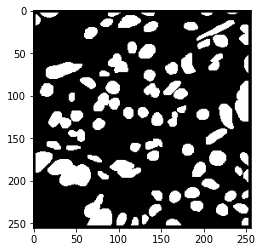

iou score: 0.7272147187067957
AJI score: 0.7272147187067957
AJI+ score: 0.7272147187067957
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7272139914928042
Panoptic Quality (PQ): 0.7272139914928042
Dice2 score: 0.8420663752232005 

Batch size: 1, Learning rate: 1e-05 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.401441).  Saving model ...


  2%|▏         | 1/60 [00:43<43:01, 43.75s/it]

Train Epoch: 1 @ 19:16:22.110962 - Train Loss: 0.6058 - Valid Loss: 0.4014
Validation loss decreased (0.401441 --> 0.347852).  Saving model ...


  3%|▎         | 2/60 [01:27<42:24, 43.87s/it]

Train Epoch: 2 @ 19:17:06.275080 - Train Loss: 0.4038 - Valid Loss: 0.3479
Validation loss decreased (0.347852 --> 0.344127).  Saving model ...


  5%|▌         | 3/60 [02:12<41:55, 44.13s/it]

Train Epoch: 3 @ 19:17:50.999070 - Train Loss: 0.3528 - Valid Loss: 0.3441


  7%|▋         | 4/60 [02:55<40:57, 43.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 4 @ 19:18:34.340230 - Train Loss: 0.3127 - Valid Loss: 0.3506


  8%|▊         | 5/60 [03:40<40:21, 44.03s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 5 @ 19:19:18.690203 - Train Loss: 0.2900 - Valid Loss: 0.3574
Validation loss decreased (0.344127 --> 0.334945).  Saving model ...


 10%|█         | 6/60 [04:24<39:36, 44.00s/it]

Train Epoch: 6 @ 19:20:02.635316 - Train Loss: 0.2722 - Valid Loss: 0.3349
Validation loss decreased (0.334945 --> 0.330623).  Saving model ...


 12%|█▏        | 7/60 [05:07<38:35, 43.68s/it]

Train Epoch: 7 @ 19:20:45.575254 - Train Loss: 0.2631 - Valid Loss: 0.3306
Validation loss decreased (0.330623 --> 0.325241).  Saving model ...


 13%|█▎        | 8/60 [05:50<37:44, 43.55s/it]

Train Epoch: 8 @ 19:21:28.798181 - Train Loss: 0.2539 - Valid Loss: 0.3252


 15%|█▌        | 9/60 [06:33<36:47, 43.29s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 9 @ 19:22:11.484984 - Train Loss: 0.2268 - Valid Loss: 0.4774


 17%|█▋        | 10/60 [07:16<36:12, 43.44s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 10 @ 19:22:55.280634 - Train Loss: 0.2183 - Valid Loss: 0.3466


 18%|█▊        | 11/60 [07:59<35:20, 43.27s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 11 @ 19:23:38.159974 - Train Loss: 0.2074 - Valid Loss: 0.3350


 20%|██        | 12/60 [08:44<34:51, 43.58s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 12 @ 19:24:22.441796 - Train Loss: 0.2037 - Valid Loss: 0.3483


 22%|██▏       | 13/60 [09:26<33:54, 43.28s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 13 @ 19:25:05.039572 - Train Loss: 0.2108 - Valid Loss: 0.4024


 23%|██▎       | 14/60 [10:11<33:28, 43.67s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 14 @ 19:25:49.612221 - Train Loss: 0.1959 - Valid Loss: 0.3452


 25%|██▌       | 15/60 [10:54<32:40, 43.56s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 15 @ 19:26:32.928794 - Train Loss: 0.1858 - Valid Loss: 0.3424


 27%|██▋       | 16/60 [11:38<32:03, 43.71s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 16 @ 19:27:16.986957 - Train Loss: 0.1842 - Valid Loss: 0.3473


 28%|██▊       | 17/60 [12:21<31:13, 43.58s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 17 @ 19:28:00.261671 - Train Loss: 0.1804 - Valid Loss: 0.3896


 28%|██▊       | 17/60 [13:05<33:07, 46.21s/it]

EarlyStopping counter: 10 out of 10
Early stopping


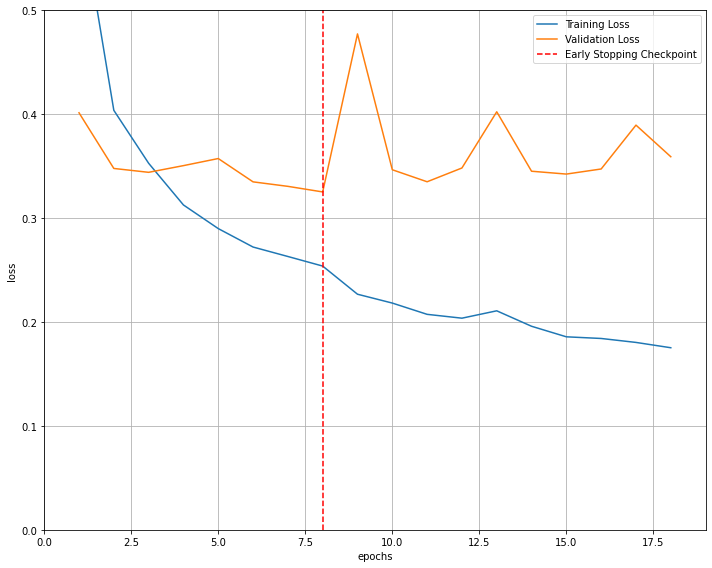

Input Image


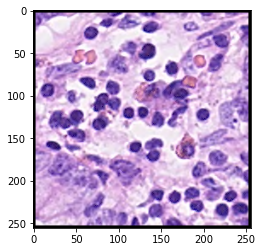

Predicted Mask Sigmoid


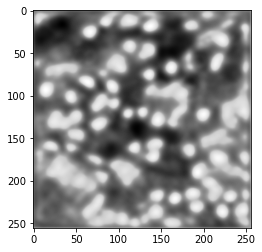

Predicted Mask Binary


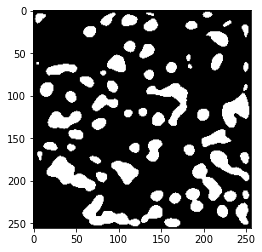

Actual Mask


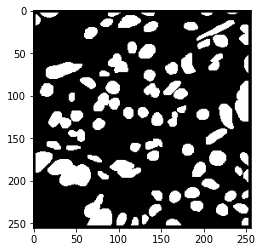

iou score: 0.6249794486764948
AJI score: 0.6249794486764948
AJI+ score: 0.6249794486764948
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6249788236976711
Panoptic Quality (PQ): 0.6249788236976711
Dice2 score: 0.7692152035344508 

Batch size: 4, Learning rate: 0.001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.634766).  Saving model ...


  2%|▏         | 1/60 [00:43<42:57, 43.69s/it]

Train Epoch: 1 @ 19:29:29.204715 - Train Loss: 0.3739 - Valid Loss: 0.6348
Validation loss decreased (0.634766 --> 0.326591).  Saving model ...


  3%|▎         | 2/60 [01:27<42:16, 43.73s/it]

Train Epoch: 2 @ 19:30:13.038920 - Train Loss: 0.2937 - Valid Loss: 0.3266
Validation loss decreased (0.326591 --> 0.314509).  Saving model ...


  5%|▌         | 3/60 [02:11<41:38, 43.84s/it]

Train Epoch: 3 @ 19:30:57.122246 - Train Loss: 0.2847 - Valid Loss: 0.3145
Validation loss decreased (0.314509 --> 0.311206).  Saving model ...


  7%|▋         | 4/60 [02:55<40:55, 43.85s/it]

Train Epoch: 4 @ 19:31:40.993642 - Train Loss: 0.2889 - Valid Loss: 0.3112


  8%|▊         | 5/60 [03:39<40:11, 43.85s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 19:32:24.846948 - Train Loss: 0.2956 - Valid Loss: 0.3482


 10%|█         | 6/60 [04:23<39:31, 43.92s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 6 @ 19:33:08.919231 - Train Loss: 0.2648 - Valid Loss: 0.3382
Validation loss decreased (0.311206 --> 0.291334).  Saving model ...


 12%|█▏        | 7/60 [05:08<38:58, 44.13s/it]

Train Epoch: 7 @ 19:33:53.531158 - Train Loss: 0.2540 - Valid Loss: 0.2913


 13%|█▎        | 8/60 [05:53<38:35, 44.54s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 19:34:39.034090 - Train Loss: 0.2307 - Valid Loss: 0.3040


 15%|█▌        | 9/60 [06:37<37:41, 44.34s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 9 @ 19:35:22.900733 - Train Loss: 0.2300 - Valid Loss: 0.3107
Validation loss decreased (0.291334 --> 0.249729).  Saving model ...


 17%|█▋        | 10/60 [07:23<37:26, 44.94s/it]

Train Epoch: 10 @ 19:36:09.234260 - Train Loss: 0.2279 - Valid Loss: 0.2497


 18%|█▊        | 11/60 [08:07<36:18, 44.45s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 11 @ 19:36:52.559009 - Train Loss: 0.2181 - Valid Loss: 0.2921


 20%|██        | 12/60 [08:51<35:36, 44.51s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 12 @ 19:37:37.195182 - Train Loss: 0.2143 - Valid Loss: 0.2718


 22%|██▏       | 13/60 [09:35<34:41, 44.29s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 13 @ 19:38:20.989578 - Train Loss: 0.2127 - Valid Loss: 0.2880


 23%|██▎       | 14/60 [10:19<33:52, 44.18s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 14 @ 19:39:04.901190 - Train Loss: 0.2150 - Valid Loss: 0.2731


 25%|██▌       | 15/60 [11:04<33:19, 44.42s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 15 @ 19:39:49.893833 - Train Loss: 0.2320 - Valid Loss: 0.4346


 27%|██▋       | 16/60 [11:49<32:38, 44.51s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 16 @ 19:40:34.617991 - Train Loss: 0.2307 - Valid Loss: 0.2939


 28%|██▊       | 17/60 [12:34<32:02, 44.72s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 17 @ 19:41:19.808274 - Train Loss: 0.2205 - Valid Loss: 0.2991


 30%|███       | 18/60 [13:17<30:54, 44.16s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 18 @ 19:42:02.658665 - Train Loss: 0.2117 - Valid Loss: 0.2722


 32%|███▏      | 19/60 [14:00<29:59, 43.90s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 19 @ 19:42:45.953023 - Train Loss: 0.1881 - Valid Loss: 0.2780


 32%|███▏      | 19/60 [14:46<31:53, 46.67s/it]

EarlyStopping counter: 10 out of 10
Early stopping


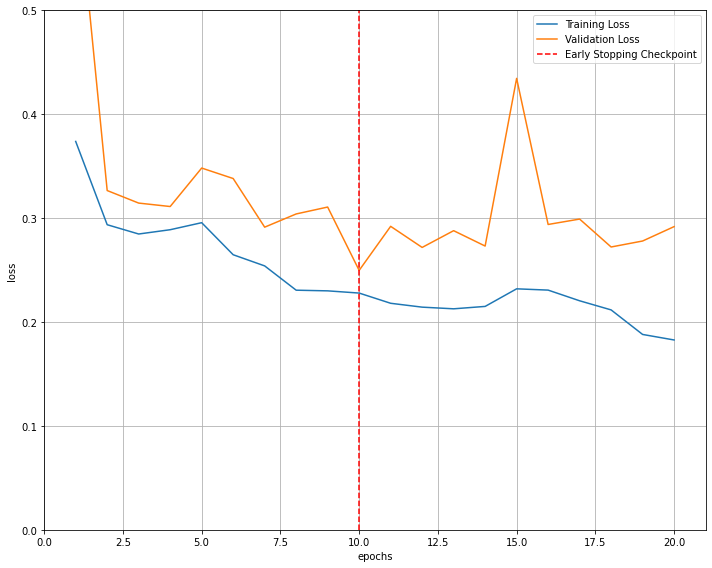

Input Image


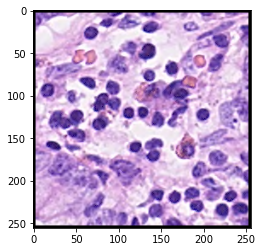

Predicted Mask Sigmoid


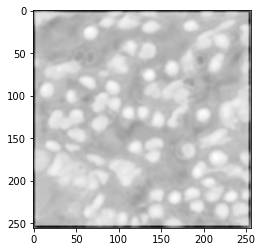

Predicted Mask Binary


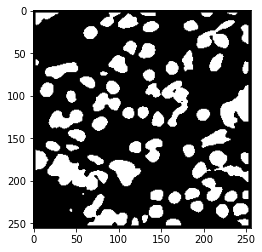

Actual Mask


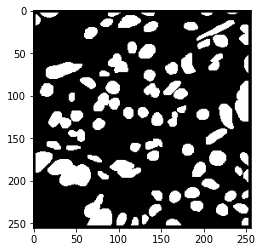

iou score: 0.741816431322208
AJI score: 0.741816431322208
AJI+ score: 0.741816431322208
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7418156895065185
Panoptic Quality (PQ): 0.7418156895065185
Dice2 score: 0.8517733763242745 

Batch size: 4, Learning rate: 0.0001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.301439).  Saving model ...


  2%|▏         | 1/60 [00:46<46:07, 46.91s/it]

Train Epoch: 1 @ 19:44:20.895339 - Train Loss: 0.4290 - Valid Loss: 0.3014
Validation loss decreased (0.301439 --> 0.297730).  Saving model ...


  3%|▎         | 2/60 [01:31<44:37, 46.16s/it]

Train Epoch: 2 @ 19:45:05.309813 - Train Loss: 0.2988 - Valid Loss: 0.2977
Validation loss decreased (0.297730 --> 0.297334).  Saving model ...


  5%|▌         | 3/60 [02:16<43:33, 45.84s/it]

Train Epoch: 3 @ 19:45:50.416771 - Train Loss: 0.2630 - Valid Loss: 0.2973
Validation loss decreased (0.297334 --> 0.271656).  Saving model ...


  7%|▋         | 4/60 [03:00<42:17, 45.31s/it]

Train Epoch: 4 @ 19:46:34.496612 - Train Loss: 0.2427 - Valid Loss: 0.2717


  8%|▊         | 5/60 [03:44<41:09, 44.90s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 19:47:18.434492 - Train Loss: 0.2162 - Valid Loss: 0.2742


 10%|█         | 6/60 [04:28<40:15, 44.73s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 6 @ 19:48:02.771472 - Train Loss: 0.2291 - Valid Loss: 0.3337


 12%|█▏        | 7/60 [05:12<39:06, 44.28s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 7 @ 19:48:46.006860 - Train Loss: 0.2050 - Valid Loss: 0.3256
Validation loss decreased (0.271656 --> 0.260733).  Saving model ...


 13%|█▎        | 8/60 [05:55<38:15, 44.14s/it]

Train Epoch: 8 @ 19:49:29.823100 - Train Loss: 0.2206 - Valid Loss: 0.2607


 15%|█▌        | 9/60 [06:39<37:17, 43.88s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 9 @ 19:50:13.085790 - Train Loss: 0.1876 - Valid Loss: 0.2878


 17%|█▋        | 10/60 [07:23<36:48, 44.18s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 10 @ 19:50:57.957366 - Train Loss: 0.1764 - Valid Loss: 0.2915


 18%|█▊        | 11/60 [08:07<36:02, 44.13s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 11 @ 19:51:41.967023 - Train Loss: 0.1664 - Valid Loss: 0.4001


 20%|██        | 12/60 [08:51<35:05, 43.87s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 12 @ 19:52:25.241508 - Train Loss: 0.1595 - Valid Loss: 0.4551


 22%|██▏       | 13/60 [09:35<34:24, 43.93s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 13 @ 19:53:09.293557 - Train Loss: 0.1721 - Valid Loss: 0.2845


 23%|██▎       | 14/60 [10:19<33:49, 44.12s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 14 @ 19:53:53.856373 - Train Loss: 0.1491 - Valid Loss: 0.2828


 25%|██▌       | 15/60 [11:04<33:10, 44.23s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 15 @ 19:54:38.344473 - Train Loss: 0.1400 - Valid Loss: 0.3244


 27%|██▋       | 16/60 [11:48<32:25, 44.21s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 16 @ 19:55:22.516215 - Train Loss: 0.1396 - Valid Loss: 0.3469


 28%|██▊       | 17/60 [12:31<31:21, 43.74s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 17 @ 19:56:05.173584 - Train Loss: 0.1664 - Valid Loss: 0.3347


 28%|██▊       | 17/60 [13:16<33:34, 46.84s/it]

EarlyStopping counter: 10 out of 10
Early stopping


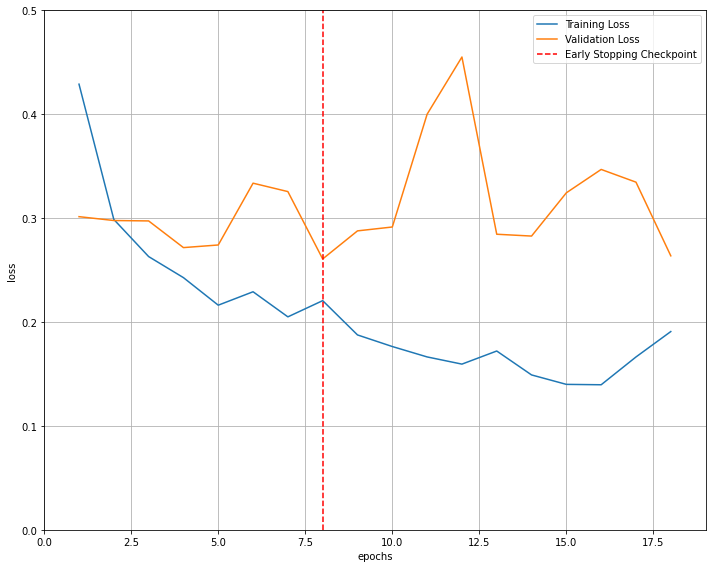

Input Image


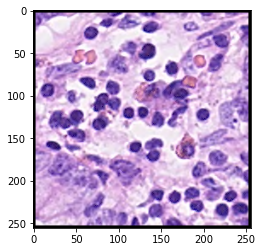

Predicted Mask Sigmoid


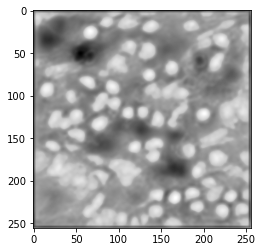

Predicted Mask Binary


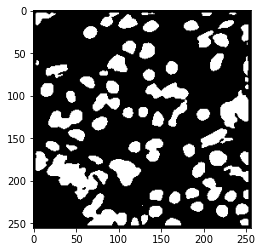

Actual Mask


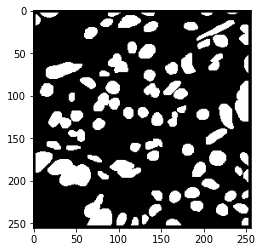

iou score: 0.7099282296650717
AJI score: 0.7099282296650717
AJI+ score: 0.7099282296650717
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7099275197375521
Panoptic Quality (PQ): 0.7099275197375521
Dice2 score: 0.8303602658272123 

Batch size: 4, Learning rate: 1e-05 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.450879).  Saving model ...


  2%|▏         | 1/60 [00:43<42:29, 43.21s/it]

Train Epoch: 1 @ 19:57:35.054552 - Train Loss: 0.6198 - Valid Loss: 0.4509
Validation loss decreased (0.450879 --> 0.382348).  Saving model ...


  3%|▎         | 2/60 [01:27<42:07, 43.57s/it]

Train Epoch: 2 @ 19:58:19.473252 - Train Loss: 0.4301 - Valid Loss: 0.3823
Validation loss decreased (0.382348 --> 0.372510).  Saving model ...


  5%|▌         | 3/60 [02:12<41:40, 43.86s/it]

Train Epoch: 3 @ 19:59:04.007705 - Train Loss: 0.3667 - Valid Loss: 0.3725
Validation loss decreased (0.372510 --> 0.360430).  Saving model ...


  7%|▋         | 4/60 [02:58<41:33, 44.53s/it]

Train Epoch: 4 @ 19:59:50.096556 - Train Loss: 0.3193 - Valid Loss: 0.3604
Validation loss decreased (0.360430 --> 0.342787).  Saving model ...


  8%|▊         | 5/60 [03:40<40:15, 43.91s/it]

Train Epoch: 5 @ 20:00:32.558932 - Train Loss: 0.2921 - Valid Loss: 0.3428
Validation loss decreased (0.342787 --> 0.336731).  Saving model ...


 10%|█         | 6/60 [04:23<39:16, 43.65s/it]

Train Epoch: 6 @ 20:01:15.590943 - Train Loss: 0.2738 - Valid Loss: 0.3367


 12%|█▏        | 7/60 [05:07<38:31, 43.61s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 20:01:59.102838 - Train Loss: 0.2569 - Valid Loss: 0.3704


 13%|█▎        | 8/60 [05:49<37:29, 43.27s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 8 @ 20:02:41.576171 - Train Loss: 0.2369 - Valid Loss: 0.3690


 15%|█▌        | 9/60 [06:32<36:40, 43.14s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 9 @ 20:03:24.421768 - Train Loss: 0.2258 - Valid Loss: 0.3976


 17%|█▋        | 10/60 [07:15<35:58, 43.16s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 10 @ 20:04:07.639621 - Train Loss: 0.2175 - Valid Loss: 0.3865


 18%|█▊        | 11/60 [07:57<34:54, 42.74s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 11 @ 20:04:49.377736 - Train Loss: 0.2095 - Valid Loss: 0.3807


 20%|██        | 12/60 [08:39<34:03, 42.57s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 12 @ 20:05:31.572748 - Train Loss: 0.1992 - Valid Loss: 0.3792


 22%|██▏       | 13/60 [09:23<33:40, 42.98s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 13 @ 20:06:15.513947 - Train Loss: 0.1914 - Valid Loss: 0.3835


 23%|██▎       | 14/60 [10:08<33:27, 43.64s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 14 @ 20:07:00.697504 - Train Loss: 0.1856 - Valid Loss: 0.3839


 25%|██▌       | 15/60 [10:51<32:28, 43.31s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 15 @ 20:07:43.221245 - Train Loss: 0.1807 - Valid Loss: 0.3652


 25%|██▌       | 15/60 [11:33<34:40, 46.24s/it]

EarlyStopping counter: 10 out of 10
Early stopping


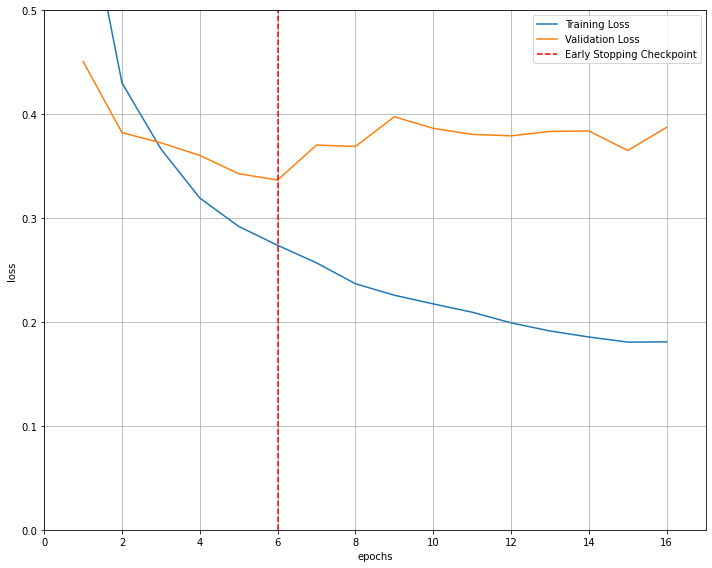

Input Image


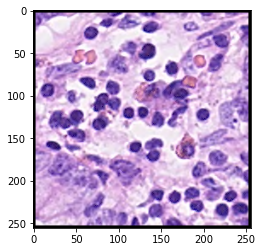

Predicted Mask Sigmoid


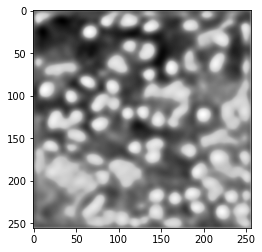

Predicted Mask Binary


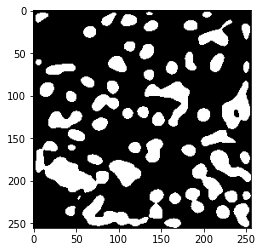

Actual Mask


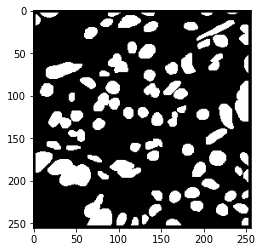

iou score: 0.634550338241146
AJI score: 0.634550338241146
AJI+ score: 0.634550338241146
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6345497036914424
Panoptic Quality (PQ): 0.6345497036914424
Dice2 score: 0.7764218982988953 

Batch size: 8, Learning rate: 0.001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.404037).  Saving model ...


  2%|▏         | 1/60 [00:42<42:12, 42.93s/it]

Train Epoch: 1 @ 20:09:10.044426 - Train Loss: 0.3811 - Valid Loss: 0.4040
Validation loss decreased (0.404037 --> 0.364580).  Saving model ...


  3%|▎         | 2/60 [01:25<41:24, 42.83s/it]

Train Epoch: 2 @ 20:09:52.652503 - Train Loss: 0.3228 - Valid Loss: 0.3646
Validation loss decreased (0.364580 --> 0.314946).  Saving model ...


  5%|▌         | 3/60 [02:10<41:13, 43.39s/it]

Train Epoch: 3 @ 20:10:37.339194 - Train Loss: 0.2971 - Valid Loss: 0.3149
Validation loss decreased (0.314946 --> 0.308104).  Saving model ...


  7%|▋         | 4/60 [02:52<40:08, 43.01s/it]

Train Epoch: 4 @ 20:11:19.478918 - Train Loss: 0.2632 - Valid Loss: 0.3081


  8%|▊         | 5/60 [03:35<39:30, 43.11s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 20:12:02.796924 - Train Loss: 0.2720 - Valid Loss: 0.4363


 10%|█         | 6/60 [04:17<38:25, 42.69s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 6 @ 20:12:44.511300 - Train Loss: 0.2399 - Valid Loss: 0.3440
Validation loss decreased (0.308104 --> 0.299273).  Saving model ...


 12%|█▏        | 7/60 [05:01<38:02, 43.06s/it]

Train Epoch: 7 @ 20:13:28.430859 - Train Loss: 0.2588 - Valid Loss: 0.2993


 13%|█▎        | 8/60 [05:44<37:17, 43.03s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 20:14:11.395294 - Train Loss: 0.2491 - Valid Loss: 0.3297


 15%|█▌        | 9/60 [06:26<36:15, 42.66s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 9 @ 20:14:53.193770 - Train Loss: 0.2482 - Valid Loss: 0.3003


 17%|█▋        | 10/60 [07:08<35:29, 42.60s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 10 @ 20:15:35.641874 - Train Loss: 0.2374 - Valid Loss: 0.3189


 18%|█▊        | 11/60 [07:50<34:34, 42.34s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 11 @ 20:16:17.398053 - Train Loss: 0.2388 - Valid Loss: 0.3308


 20%|██        | 12/60 [08:32<33:50, 42.31s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 12 @ 20:16:59.625081 - Train Loss: 0.2350 - Valid Loss: 0.3077


 22%|██▏       | 13/60 [09:14<33:02, 42.18s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 13 @ 20:17:41.509994 - Train Loss: 0.2683 - Valid Loss: 0.3009


 23%|██▎       | 14/60 [09:55<32:00, 41.76s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 14 @ 20:18:22.272380 - Train Loss: 0.2323 - Valid Loss: 0.3170
Validation loss decreased (0.299273 --> 0.283887).  Saving model ...


 25%|██▌       | 15/60 [10:39<31:55, 42.57s/it]

Train Epoch: 15 @ 20:19:06.734057 - Train Loss: 0.2310 - Valid Loss: 0.2839


 27%|██▋       | 16/60 [11:24<31:42, 43.24s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 16 @ 20:19:51.528418 - Train Loss: 0.2214 - Valid Loss: 0.3018


 28%|██▊       | 17/60 [12:07<30:58, 43.21s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 17 @ 20:20:34.690814 - Train Loss: 0.2153 - Valid Loss: 0.3004


 30%|███       | 18/60 [12:50<30:14, 43.20s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 18 @ 20:21:17.857504 - Train Loss: 0.2181 - Valid Loss: 0.2962


 32%|███▏      | 19/60 [13:32<29:16, 42.83s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 19 @ 20:21:59.839741 - Train Loss: 0.2042 - Valid Loss: 0.3125


 33%|███▎      | 20/60 [14:15<28:37, 42.94s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 20 @ 20:22:43.028854 - Train Loss: 0.2104 - Valid Loss: 0.2857


 35%|███▌      | 21/60 [15:00<28:08, 43.30s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 21 @ 20:23:27.159581 - Train Loss: 0.2031 - Valid Loss: 0.3601
Validation loss decreased (0.283887 --> 0.266815).  Saving model ...


 37%|███▋      | 22/60 [15:42<27:19, 43.16s/it]

Train Epoch: 22 @ 20:24:09.990426 - Train Loss: 0.2077 - Valid Loss: 0.2668


 38%|███▊      | 23/60 [16:24<26:20, 42.71s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 23 @ 20:24:51.661873 - Train Loss: 0.1981 - Valid Loss: 0.2792


 40%|████      | 24/60 [17:06<25:32, 42.57s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 24 @ 20:25:33.899018 - Train Loss: 0.2015 - Valid Loss: 0.2858


 42%|████▏     | 25/60 [17:49<24:54, 42.69s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 25 @ 20:26:16.867510 - Train Loss: 0.1795 - Valid Loss: 0.2852


 43%|████▎     | 26/60 [18:34<24:28, 43.19s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 26 @ 20:27:01.222434 - Train Loss: 0.1742 - Valid Loss: 0.2793


 45%|████▌     | 27/60 [19:17<23:50, 43.35s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 27 @ 20:27:44.943837 - Train Loss: 0.1684 - Valid Loss: 0.3862


 47%|████▋     | 28/60 [20:00<23:02, 43.22s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 28 @ 20:28:27.856823 - Train Loss: 0.1981 - Valid Loss: 0.2788


 48%|████▊     | 29/60 [20:42<22:08, 42.84s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 29 @ 20:29:09.829521 - Train Loss: 0.1712 - Valid Loss: 0.2860


 50%|█████     | 30/60 [21:25<21:27, 42.92s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 30 @ 20:29:52.921129 - Train Loss: 0.1691 - Valid Loss: 0.2746


 52%|█████▏    | 31/60 [22:07<20:37, 42.68s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 31 @ 20:30:35.037823 - Train Loss: 0.1734 - Valid Loss: 0.2874


 52%|█████▏    | 31/60 [22:51<21:22, 44.24s/it]

EarlyStopping counter: 10 out of 10
Early stopping


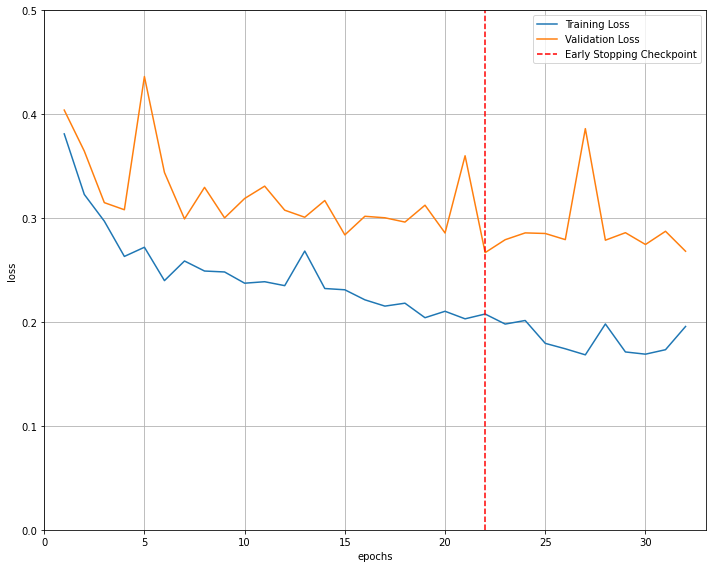

Input Image


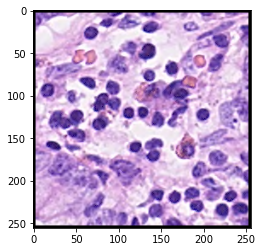

Predicted Mask Sigmoid


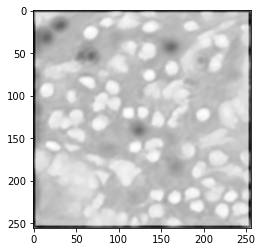

Predicted Mask Binary


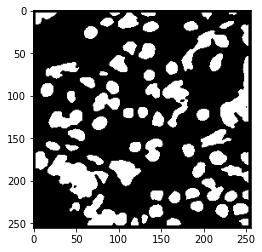

Actual Mask


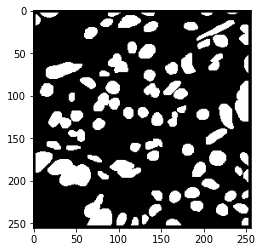

iou score: 0.7383643082855765
AJI score: 0.7383643082855765
AJI+ score: 0.7383643082855765
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7383635699220067
Panoptic Quality (PQ): 0.7383635699220067
Dice2 score: 0.8494931755861601 

Batch size: 8, Learning rate: 0.0001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.328137).  Saving model ...


  2%|▏         | 1/60 [00:41<41:16, 41.98s/it]

Train Epoch: 1 @ 20:32:01.975003 - Train Loss: 0.4174 - Valid Loss: 0.3281
Validation loss decreased (0.328137 --> 0.327449).  Saving model ...


  3%|▎         | 2/60 [01:24<40:37, 42.03s/it]

Train Epoch: 2 @ 20:32:44.123807 - Train Loss: 0.3105 - Valid Loss: 0.3274
Validation loss decreased (0.327449 --> 0.279623).  Saving model ...


  5%|▌         | 3/60 [02:07<40:23, 42.52s/it]

Train Epoch: 3 @ 20:33:27.801921 - Train Loss: 0.2852 - Valid Loss: 0.2796


  7%|▋         | 4/60 [02:51<39:54, 42.76s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 4 @ 20:34:11.124787 - Train Loss: 0.2493 - Valid Loss: 0.2855
Validation loss decreased (0.279623 --> 0.276236).  Saving model ...


  8%|▊         | 5/60 [03:33<39:09, 42.73s/it]

Train Epoch: 5 @ 20:34:53.764630 - Train Loss: 0.2283 - Valid Loss: 0.2762
Validation loss decreased (0.276236 --> 0.270682).  Saving model ...


 10%|█         | 6/60 [04:18<39:06, 43.46s/it]

Train Epoch: 6 @ 20:35:38.944962 - Train Loss: 0.2176 - Valid Loss: 0.2707
Validation loss decreased (0.270682 --> 0.266300).  Saving model ...


 12%|█▏        | 7/60 [05:02<38:21, 43.42s/it]

Train Epoch: 7 @ 20:36:22.262343 - Train Loss: 0.2301 - Valid Loss: 0.2663


 13%|█▎        | 8/60 [05:43<37:06, 42.81s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 20:37:03.649454 - Train Loss: 0.2142 - Valid Loss: 0.4115


 15%|█▌        | 9/60 [06:25<36:04, 42.45s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 9 @ 20:37:45.253108 - Train Loss: 0.2237 - Valid Loss: 0.2956
Validation loss decreased (0.266300 --> 0.263168).  Saving model ...


 17%|█▋        | 10/60 [07:07<35:17, 42.35s/it]

Train Epoch: 10 @ 20:38:27.389271 - Train Loss: 0.2072 - Valid Loss: 0.2632


 18%|█▊        | 11/60 [07:49<34:33, 42.32s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 11 @ 20:39:09.636334 - Train Loss: 0.1846 - Valid Loss: 0.3456
Validation loss decreased (0.263168 --> 0.243897).  Saving model ...


 20%|██        | 12/60 [08:30<33:32, 41.94s/it]

Train Epoch: 12 @ 20:39:50.670032 - Train Loss: 0.2004 - Valid Loss: 0.2439


 22%|██▏       | 13/60 [09:13<33:04, 42.22s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 13 @ 20:40:33.559922 - Train Loss: 0.1783 - Valid Loss: 0.2590


 23%|██▎       | 14/60 [09:54<32:01, 41.78s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 14 @ 20:41:14.299219 - Train Loss: 0.1565 - Valid Loss: 0.2925


 25%|██▌       | 15/60 [10:37<31:34, 42.10s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 15 @ 20:41:57.151645 - Train Loss: 0.1482 - Valid Loss: 0.2776


 27%|██▋       | 16/60 [11:17<30:32, 41.66s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 16 @ 20:42:37.769524 - Train Loss: 0.1414 - Valid Loss: 0.2873


 28%|██▊       | 17/60 [11:59<29:58, 41.83s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 17 @ 20:43:19.992441 - Train Loss: 0.1759 - Valid Loss: 0.2457


 30%|███       | 18/60 [12:41<29:13, 41.76s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 18 @ 20:44:01.585824 - Train Loss: 0.1514 - Valid Loss: 0.2547


 32%|███▏      | 19/60 [13:22<28:25, 41.60s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 19 @ 20:44:42.815134 - Train Loss: 0.1407 - Valid Loss: 0.2774


 33%|███▎      | 20/60 [14:04<27:42, 41.55s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 20 @ 20:45:24.267231 - Train Loss: 0.1340 - Valid Loss: 0.2815


 35%|███▌      | 21/60 [14:45<26:52, 41.34s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 21 @ 20:46:05.100103 - Train Loss: 0.1261 - Valid Loss: 0.2781


 35%|███▌      | 21/60 [15:25<28:39, 44.09s/it]

EarlyStopping counter: 10 out of 10
Early stopping


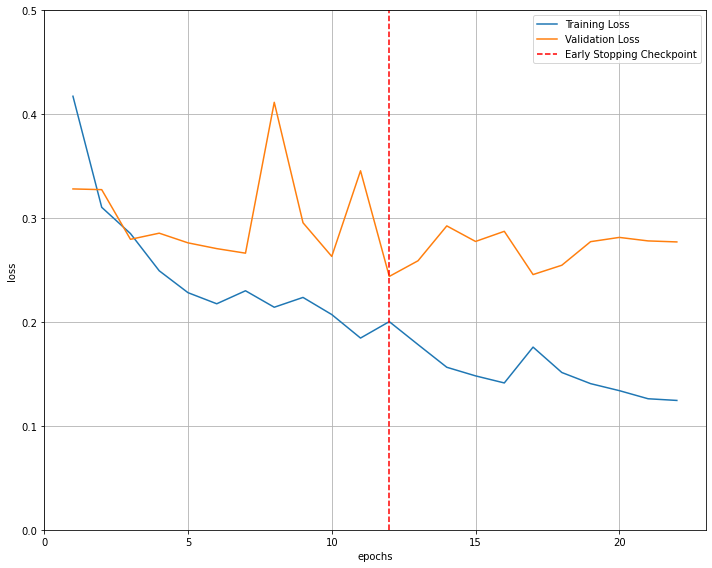

Input Image


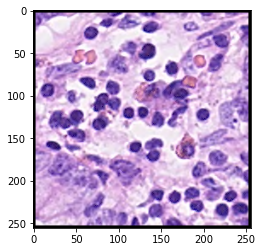

Predicted Mask Sigmoid


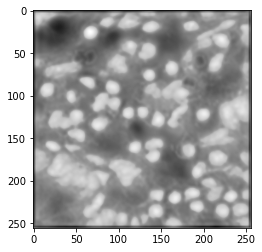

Predicted Mask Binary


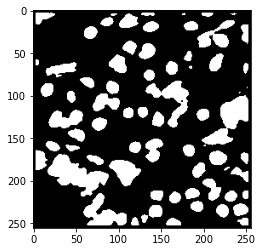

Actual Mask


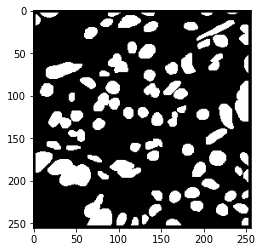

iou score: 0.7240614519095532
AJI score: 0.7240614519095532
AJI+ score: 0.7240614519095532
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7240607278488254
Panoptic Quality (PQ): 0.7240607278488254
Dice2 score: 0.8399485425622039 

Batch size: 8, Learning rate: 1e-05 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.432644).  Saving model ...


  2%|▏         | 1/60 [00:41<40:28, 41.15s/it]

Train Epoch: 1 @ 20:47:28.647122 - Train Loss: 0.6148 - Valid Loss: 0.4326
Validation loss decreased (0.432644 --> 0.388381).  Saving model ...


  3%|▎         | 2/60 [01:22<39:54, 41.28s/it]

Train Epoch: 2 @ 20:48:10.216818 - Train Loss: 0.4180 - Valid Loss: 0.3884
Validation loss decreased (0.388381 --> 0.365740).  Saving model ...


  5%|▌         | 3/60 [02:04<39:23, 41.46s/it]

Train Epoch: 3 @ 20:48:52.101320 - Train Loss: 0.3606 - Valid Loss: 0.3657


  7%|▋         | 4/60 [02:45<38:39, 41.42s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 4 @ 20:49:33.426019 - Train Loss: 0.3181 - Valid Loss: 0.3820


  8%|▊         | 5/60 [03:26<37:37, 41.05s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 5 @ 20:50:13.618297 - Train Loss: 0.2894 - Valid Loss: 0.4026
Validation loss decreased (0.365740 --> 0.359578).  Saving model ...


 10%|█         | 6/60 [04:07<37:01, 41.13s/it]

Train Epoch: 6 @ 20:50:54.934035 - Train Loss: 0.2723 - Valid Loss: 0.3596


 12%|█▏        | 7/60 [04:48<36:14, 41.03s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 20:51:35.719348 - Train Loss: 0.2484 - Valid Loss: 0.4506


 13%|█▎        | 8/60 [05:30<35:54, 41.43s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 8 @ 20:52:18.100031 - Train Loss: 0.2307 - Valid Loss: 0.4625


 15%|█▌        | 9/60 [06:11<35:08, 41.34s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 9 @ 20:52:59.237539 - Train Loss: 0.2156 - Valid Loss: 0.3597


 17%|█▋        | 10/60 [06:53<34:37, 41.55s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 10 @ 20:53:41.269612 - Train Loss: 0.2058 - Valid Loss: 0.3970


 18%|█▊        | 11/60 [07:37<34:24, 42.14s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 11 @ 20:54:24.790377 - Train Loss: 0.1988 - Valid Loss: 0.3685


 20%|██        | 12/60 [08:19<33:45, 42.21s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 12 @ 20:55:07.143869 - Train Loss: 0.1908 - Valid Loss: 0.4094


 22%|██▏       | 13/60 [09:01<32:57, 42.07s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 13 @ 20:55:48.882905 - Train Loss: 0.1840 - Valid Loss: 0.4371


 23%|██▎       | 14/60 [09:42<32:08, 41.92s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 14 @ 20:56:30.475922 - Train Loss: 0.1781 - Valid Loss: 0.3768


 25%|██▌       | 15/60 [10:24<31:18, 41.75s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 15 @ 20:57:11.821026 - Train Loss: 0.1762 - Valid Loss: 0.3753


 25%|██▌       | 15/60 [11:05<33:16, 44.36s/it]

EarlyStopping counter: 10 out of 10
Early stopping


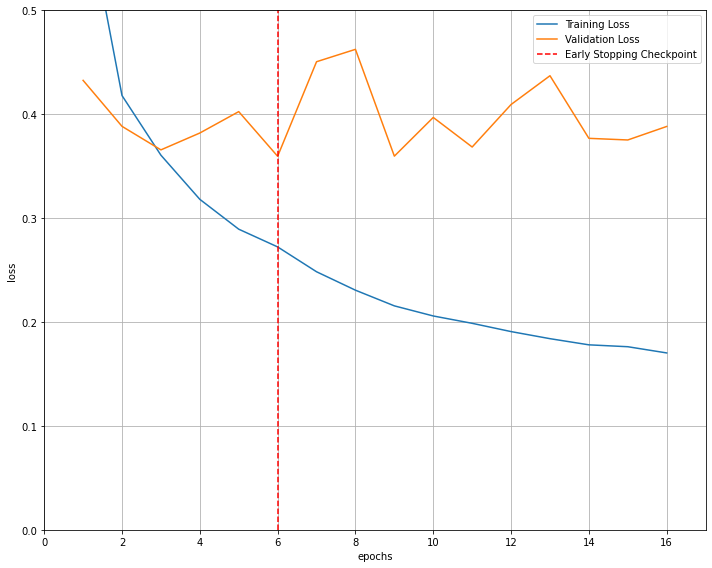

Input Image


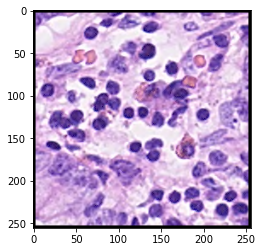

Predicted Mask Sigmoid


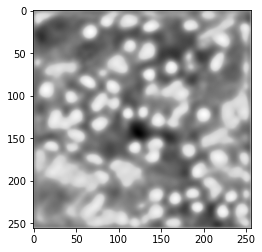

Predicted Mask Binary


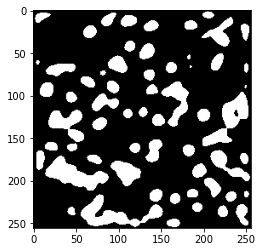

Actual Mask


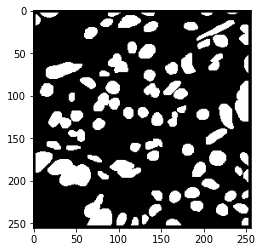

iou score: 0.6412729026036644
AJI score: 0.6412729026036644
AJI+ score: 0.6412729026036644
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6412722613314031
Panoptic Quality (PQ): 0.6412722613314031
Dice2 score: 0.781433607520564 

Batch size: 16, Learning rate: 0.001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.332661).  Saving model ...


  2%|▏         | 1/60 [00:40<40:07, 40.80s/it]

Train Epoch: 1 @ 20:58:35.326789 - Train Loss: 0.4021 - Valid Loss: 0.3327
Validation loss decreased (0.332661 --> 0.301487).  Saving model ...


  3%|▎         | 2/60 [01:21<39:26, 40.80s/it]

Train Epoch: 2 @ 20:59:16.128861 - Train Loss: 0.3521 - Valid Loss: 0.3015


  5%|▌         | 3/60 [02:03<39:01, 41.09s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 3 @ 20:59:57.880529 - Train Loss: 0.3017 - Valid Loss: 0.3349


  7%|▋         | 4/60 [02:44<38:22, 41.11s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 4 @ 21:00:39.058519 - Train Loss: 0.2961 - Valid Loss: 0.3178


  8%|▊         | 5/60 [03:25<37:38, 41.06s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 5 @ 21:01:19.985353 - Train Loss: 0.2602 - Valid Loss: 0.4092


 10%|█         | 6/60 [04:06<36:57, 41.06s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 6 @ 21:02:01.052350 - Train Loss: 0.2855 - Valid Loss: 0.3284


 12%|█▏        | 7/60 [04:47<36:13, 41.01s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 7 @ 21:02:41.934180 - Train Loss: 0.2645 - Valid Loss: 0.3242


 13%|█▎        | 8/60 [05:27<35:22, 40.82s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 8 @ 21:03:22.304801 - Train Loss: 0.2594 - Valid Loss: 0.3235


 15%|█▌        | 9/60 [06:08<34:36, 40.71s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 9 @ 21:04:02.758473 - Train Loss: 0.2529 - Valid Loss: 0.4069


 17%|█▋        | 10/60 [06:49<34:04, 40.88s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 10 @ 21:04:44.043742 - Train Loss: 0.2425 - Valid Loss: 0.4162


 18%|█▊        | 11/60 [07:30<33:28, 40.99s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 11 @ 21:05:25.300174 - Train Loss: 0.2283 - Valid Loss: 0.3283


 18%|█▊        | 11/60 [08:12<36:34, 44.80s/it]

EarlyStopping counter: 10 out of 10
Early stopping


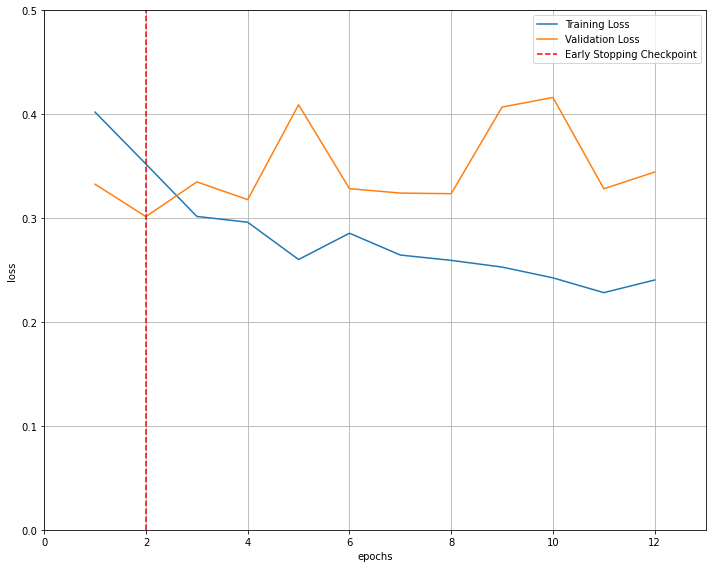

Input Image


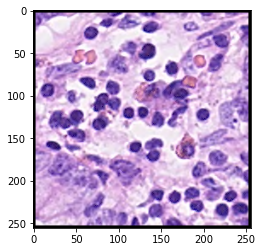

Predicted Mask Sigmoid


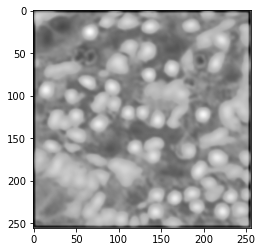

Predicted Mask Binary


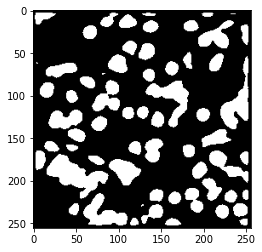

Actual Mask


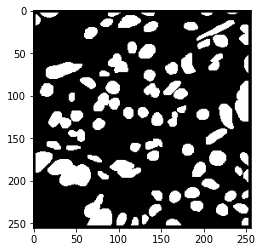

iou score: 0.69700641122722
AJI score: 0.69700641122722
AJI+ score: 0.69700641122722
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6970057142215058
Panoptic Quality (PQ): 0.6970057142215058
Dice2 score: 0.8214540694907188 

Batch size: 16, Learning rate: 0.0001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.305441).  Saving model ...


  2%|▏         | 1/60 [00:41<40:29, 41.18s/it]

Train Epoch: 1 @ 21:06:49.940118 - Train Loss: 0.4273 - Valid Loss: 0.3054


  3%|▎         | 2/60 [01:23<40:05, 41.48s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 2 @ 21:07:32.123609 - Train Loss: 0.3108 - Valid Loss: 0.3616
Validation loss decreased (0.305441 --> 0.286421).  Saving model ...


  5%|▌         | 3/60 [02:06<39:51, 41.96s/it]

Train Epoch: 3 @ 21:08:15.211480 - Train Loss: 0.2686 - Valid Loss: 0.2864
Validation loss decreased (0.286421 --> 0.274367).  Saving model ...


  7%|▋         | 4/60 [02:47<39:02, 41.84s/it]

Train Epoch: 4 @ 21:08:56.749460 - Train Loss: 0.2633 - Valid Loss: 0.2744
Validation loss decreased (0.274367 --> 0.262773).  Saving model ...


  8%|▊         | 5/60 [03:28<38:06, 41.57s/it]

Train Epoch: 5 @ 21:09:37.700120 - Train Loss: 0.2335 - Valid Loss: 0.2628


 10%|█         | 6/60 [04:12<37:59, 42.22s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 21:10:21.432619 - Train Loss: 0.2090 - Valid Loss: 0.2632
Validation loss decreased (0.262773 --> 0.249178).  Saving model ...


 12%|█▏        | 7/60 [04:54<37:03, 41.96s/it]

Train Epoch: 7 @ 21:11:02.783638 - Train Loss: 0.1928 - Valid Loss: 0.2492


 13%|█▎        | 8/60 [05:36<36:33, 42.18s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 21:11:45.465584 - Train Loss: 0.1918 - Valid Loss: 0.2846


 15%|█▌        | 9/60 [06:19<35:54, 42.24s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 9 @ 21:12:27.871586 - Train Loss: 0.1892 - Valid Loss: 0.2703


 17%|█▋        | 10/60 [07:00<34:52, 41.86s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 10 @ 21:13:08.827631 - Train Loss: 0.1693 - Valid Loss: 0.2617


 18%|█▊        | 11/60 [07:41<34:03, 41.71s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 11 @ 21:13:50.180334 - Train Loss: 0.1586 - Valid Loss: 0.2668


 20%|██        | 12/60 [08:22<33:16, 41.58s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 12 @ 21:14:31.481201 - Train Loss: 0.1655 - Valid Loss: 0.2726


 22%|██▏       | 13/60 [09:04<32:31, 41.53s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 13 @ 21:15:12.880774 - Train Loss: 0.1667 - Valid Loss: 0.3024


 23%|██▎       | 14/60 [09:46<32:03, 41.81s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 14 @ 21:15:55.329586 - Train Loss: 0.1505 - Valid Loss: 0.3333


 25%|██▌       | 15/60 [10:26<31:02, 41.38s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 15 @ 21:16:35.727007 - Train Loss: 0.1506 - Valid Loss: 0.2762


 27%|██▋       | 16/60 [11:08<30:22, 41.42s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 16 @ 21:17:17.225945 - Train Loss: 0.1349 - Valid Loss: 0.2881


 27%|██▋       | 16/60 [11:48<32:29, 44.31s/it]

EarlyStopping counter: 10 out of 10
Early stopping


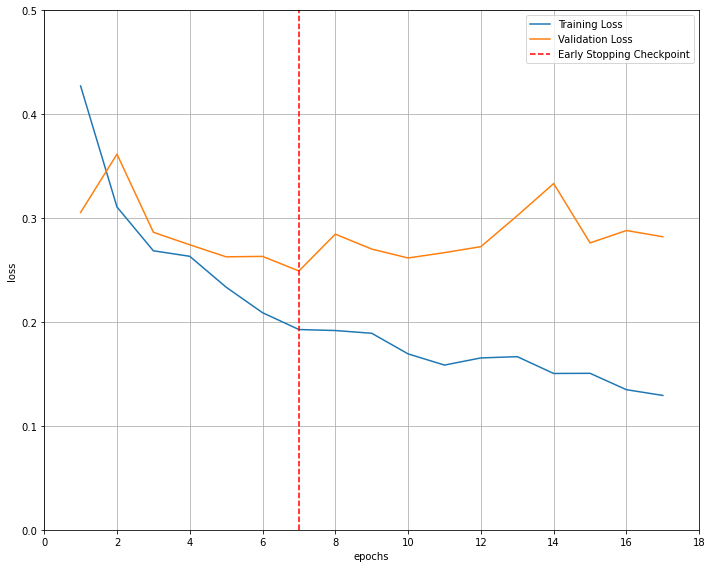

Input Image


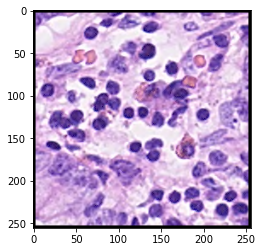

Predicted Mask Sigmoid


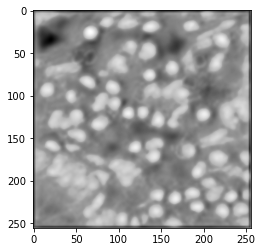

Predicted Mask Binary


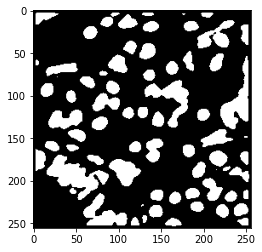

Actual Mask


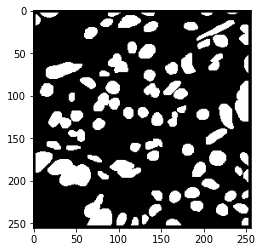

iou score: 0.7200505742282162
AJI score: 0.7200505742282162
AJI+ score: 0.7200505742282162
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7200498541783621
Panoptic Quality (PQ): 0.7200498541783621
Dice2 score: 0.8372434915773354 

Batch size: 16, Learning rate: 1e-05 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.402128).  Saving model ...


  2%|▏         | 1/60 [00:41<40:47, 41.48s/it]

Train Epoch: 1 @ 21:18:40.671275 - Train Loss: 0.6033 - Valid Loss: 0.4021
Validation loss decreased (0.402128 --> 0.381516).  Saving model ...


  3%|▎         | 2/60 [01:22<39:52, 41.25s/it]

Train Epoch: 2 @ 21:19:21.401996 - Train Loss: 0.4135 - Valid Loss: 0.3815
Validation loss decreased (0.381516 --> 0.358058).  Saving model ...


  5%|▌         | 3/60 [02:03<39:13, 41.29s/it]

Train Epoch: 3 @ 21:20:02.789851 - Train Loss: 0.3566 - Valid Loss: 0.3581


  7%|▋         | 4/60 [02:44<38:27, 41.20s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 4 @ 21:20:43.761595 - Train Loss: 0.3169 - Valid Loss: 0.3637


  8%|▊         | 5/60 [03:25<37:40, 41.10s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 5 @ 21:21:24.625527 - Train Loss: 0.2897 - Valid Loss: 0.3806
Validation loss decreased (0.358058 --> 0.349976).  Saving model ...


 10%|█         | 6/60 [04:06<37:04, 41.20s/it]

Train Epoch: 6 @ 21:22:06.065393 - Train Loss: 0.2685 - Valid Loss: 0.3500


 12%|█▏        | 7/60 [04:49<36:43, 41.57s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 21:22:48.513639 - Train Loss: 0.2502 - Valid Loss: 0.4079


 13%|█▎        | 8/60 [05:29<35:45, 41.25s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 8 @ 21:23:29.022166 - Train Loss: 0.2337 - Valid Loss: 0.4185


 15%|█▌        | 9/60 [06:11<35:14, 41.46s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 9 @ 21:24:10.962745 - Train Loss: 0.2159 - Valid Loss: 0.4684


 17%|█▋        | 10/60 [06:52<34:29, 41.38s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 10 @ 21:24:52.165590 - Train Loss: 0.2100 - Valid Loss: 0.4382


 18%|█▊        | 11/60 [07:34<33:50, 41.43s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 11 @ 21:25:33.711298 - Train Loss: 0.1997 - Valid Loss: 0.3577


 20%|██        | 12/60 [08:17<33:23, 41.75s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 12 @ 21:26:16.200531 - Train Loss: 0.1916 - Valid Loss: 0.4289
Validation loss decreased (0.349976 --> 0.349166).  Saving model ...


 22%|██▏       | 13/60 [08:58<32:44, 41.80s/it]

Train Epoch: 13 @ 21:26:58.132820 - Train Loss: 0.1849 - Valid Loss: 0.3492


 23%|██▎       | 14/60 [09:39<31:46, 41.45s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 14 @ 21:27:38.756969 - Train Loss: 0.1800 - Valid Loss: 0.3939


 25%|██▌       | 15/60 [10:21<31:17, 41.72s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 15 @ 21:28:21.101972 - Train Loss: 0.1752 - Valid Loss: 0.3611


 27%|██▋       | 16/60 [11:03<30:29, 41.58s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 16 @ 21:29:02.357150 - Train Loss: 0.1723 - Valid Loss: 0.4033


 28%|██▊       | 17/60 [11:44<29:39, 41.39s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 17 @ 21:29:43.314374 - Train Loss: 0.1703 - Valid Loss: 0.3834


 30%|███       | 18/60 [12:26<29:06, 41.59s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 18 @ 21:30:25.381076 - Train Loss: 0.1670 - Valid Loss: 0.3949


 32%|███▏      | 19/60 [13:07<28:21, 41.49s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 19 @ 21:31:06.638874 - Train Loss: 0.1619 - Valid Loss: 0.4231


 33%|███▎      | 20/60 [13:50<27:54, 41.86s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 20 @ 21:31:49.343857 - Train Loss: 0.1561 - Valid Loss: 0.3958


 35%|███▌      | 21/60 [14:31<27:04, 41.65s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 21 @ 21:32:30.523740 - Train Loss: 0.1543 - Valid Loss: 0.3680
Validation loss decreased (0.349166 --> 0.333994).  Saving model ...


 37%|███▋      | 22/60 [15:12<26:16, 41.49s/it]

Train Epoch: 22 @ 21:33:11.646885 - Train Loss: 0.1497 - Valid Loss: 0.3340


 38%|███▊      | 23/60 [15:53<25:32, 41.41s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 23 @ 21:33:52.864942 - Train Loss: 0.1456 - Valid Loss: 0.3954


 40%|████      | 24/60 [16:36<25:08, 41.89s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 24 @ 21:34:35.871049 - Train Loss: 0.1489 - Valid Loss: 0.3434


 42%|████▏     | 25/60 [17:18<24:27, 41.93s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 25 @ 21:35:17.884374 - Train Loss: 0.1472 - Valid Loss: 0.3968


 43%|████▎     | 26/60 [17:59<23:34, 41.60s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 26 @ 21:35:58.730917 - Train Loss: 0.1390 - Valid Loss: 0.3792


 45%|████▌     | 27/60 [18:41<22:53, 41.62s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 27 @ 21:36:40.407500 - Train Loss: 0.1359 - Valid Loss: 0.4060


 47%|████▋     | 28/60 [19:22<22:12, 41.63s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 28 @ 21:37:22.036428 - Train Loss: 0.1319 - Valid Loss: 0.3940


 48%|████▊     | 29/60 [20:04<21:26, 41.51s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 29 @ 21:38:03.291361 - Train Loss: 0.1290 - Valid Loss: 0.4590


 50%|█████     | 30/60 [20:48<21:07, 42.25s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 30 @ 21:38:47.264995 - Train Loss: 0.1274 - Valid Loss: 0.3772


 52%|█████▏    | 31/60 [21:30<20:23, 42.18s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 31 @ 21:39:29.276650 - Train Loss: 0.1255 - Valid Loss: 0.4242


 52%|█████▏    | 31/60 [22:11<20:45, 42.96s/it]

EarlyStopping counter: 10 out of 10
Early stopping


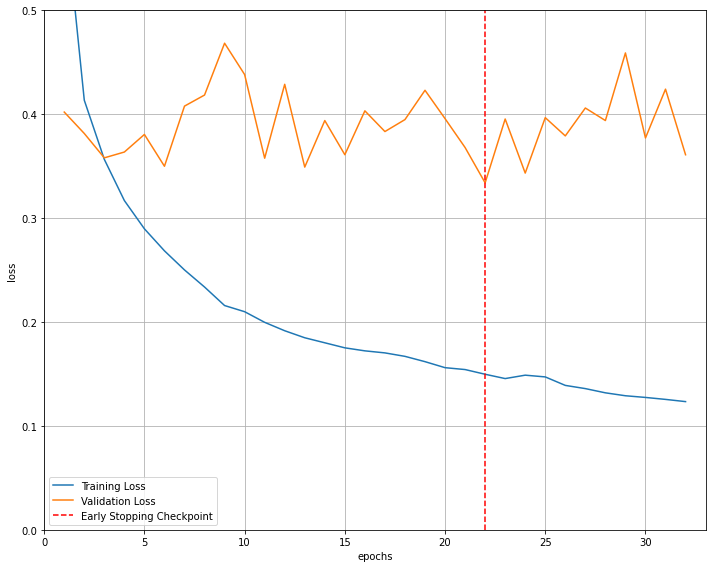

Input Image


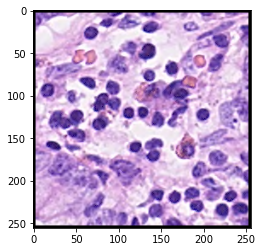

Predicted Mask Sigmoid


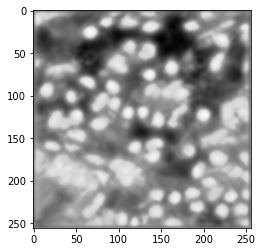

Predicted Mask Binary


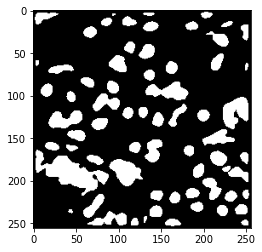

Actual Mask


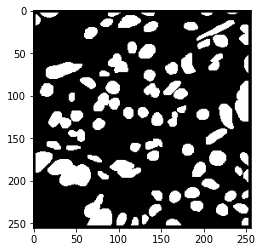

iou score: 0.6548285223558092
AJI score: 0.6548285223558092
AJI+ score: 0.6548285223558092
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6548278675279418
Panoptic Quality (PQ): 0.6548278675279418
Dice2 score: 0.7914155618052765 



In [ ]:
n_bs = [1, 4, 8, 16]
n_lr = [0.001, 0.0001, 0.00001]
epochs = 60
patience = 10

train_dir = "./Train/train_250"
test_dir = "./Test/test_250"

for bs in n_bs:
    for lr in n_lr:
        hyperparam_tuning(train_dir, test_dir, bs, lr, epochs, patience)

500 x 500 images (best: lr 0.001, batch size 8, iou score 0.715856567262731)

Batch size: 1, Learning rate: 0.001 , Epochs: 60



Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0/60 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Validation loss decreased (inf --> 0.299306).  Saving model ...


  2%|▏         | 1/60 [02:53<2:50:25, 173.32s/it]

Train Epoch: 1 @ 05:05:14.703251 - Train Loss: 0.3978 - Valid Loss: 0.2993


  3%|▎         | 2/60 [03:12<2:02:48, 127.04s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 2 @ 05:05:33.743398 - Train Loss: 0.3230 - Valid Loss: 0.3904
Validation loss decreased (0.299306 --> 0.277410).  Saving model ...


  5%|▌         | 3/60 [03:31<1:30:02, 94.78s/it] 

Train Epoch: 3 @ 05:05:53.272243 - Train Loss: 0.2720 - Valid Loss: 0.2774
Validation loss decreased (0.277410 --> 0.267494).  Saving model ...


  7%|▋         | 4/60 [03:51<1:07:28, 72.30s/it]

Train Epoch: 4 @ 05:06:13.120482 - Train Loss: 0.2691 - Valid Loss: 0.2675
Validation loss decreased (0.267494 --> 0.244255).  Saving model ...


  8%|▊         | 5/60 [04:11<51:49, 56.53s/it]  

Train Epoch: 5 @ 05:06:32.862285 - Train Loss: 0.2563 - Valid Loss: 0.2443


 10%|█         | 6/60 [04:30<40:51, 45.41s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 05:06:52.303259 - Train Loss: 0.2384 - Valid Loss: 0.2629


 12%|█▏        | 7/60 [04:50<33:18, 37.70s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 7 @ 05:07:12.026657 - Train Loss: 0.2400 - Valid Loss: 0.3021
Validation loss decreased (0.244255 --> 0.240561).  Saving model ...


 13%|█▎        | 8/60 [05:10<28:03, 32.38s/it]

Train Epoch: 8 @ 05:07:31.979850 - Train Loss: 0.2292 - Valid Loss: 0.2406


 15%|█▌        | 9/60 [05:30<24:16, 28.56s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 9 @ 05:07:51.641884 - Train Loss: 0.2080 - Valid Loss: 0.3367


 17%|█▋        | 10/60 [05:50<21:38, 25.97s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 10 @ 05:08:11.576665 - Train Loss: 0.2026 - Valid Loss: 0.3086
Validation loss decreased (0.240561 --> 0.235016).  Saving model ...


 18%|█▊        | 11/60 [06:10<19:47, 24.24s/it]

Train Epoch: 11 @ 05:08:31.785060 - Train Loss: 0.1904 - Valid Loss: 0.2350
Validation loss decreased (0.235016 --> 0.227625).  Saving model ...


 20%|██        | 12/60 [06:30<18:25, 23.03s/it]

Train Epoch: 12 @ 05:08:51.985166 - Train Loss: 0.1793 - Valid Loss: 0.2276


 22%|██▏       | 13/60 [06:50<17:20, 22.14s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 13 @ 05:09:12.038026 - Train Loss: 0.1747 - Valid Loss: 0.3427


 23%|██▎       | 14/60 [07:10<16:29, 21.50s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 14 @ 05:09:32.055529 - Train Loss: 0.1769 - Valid Loss: 0.2308


 25%|██▌       | 15/60 [07:30<15:45, 21.00s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 15 @ 05:09:51.887312 - Train Loss: 0.1640 - Valid Loss: 0.2619


 27%|██▋       | 16/60 [07:50<15:09, 20.68s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 16 @ 05:10:11.811147 - Train Loss: 0.1549 - Valid Loss: 0.2343


 28%|██▊       | 17/60 [08:10<14:41, 20.51s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 17 @ 05:10:31.918135 - Train Loss: 0.1451 - Valid Loss: 0.2294


 30%|███       | 18/60 [08:30<14:14, 20.36s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 18 @ 05:10:51.924974 - Train Loss: 0.1382 - Valid Loss: 0.2456


 32%|███▏      | 19/60 [08:50<13:49, 20.24s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 19 @ 05:11:11.892667 - Train Loss: 0.1337 - Valid Loss: 0.3005


 33%|███▎      | 20/60 [09:10<13:23, 20.10s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 20 @ 05:11:31.656300 - Train Loss: 0.1358 - Valid Loss: 0.2590


 35%|███▌      | 21/60 [09:30<13:02, 20.06s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 21 @ 05:11:51.615354 - Train Loss: 0.1308 - Valid Loss: 0.2326
EarlyStopping counter: 10 out of 10
Early stopping


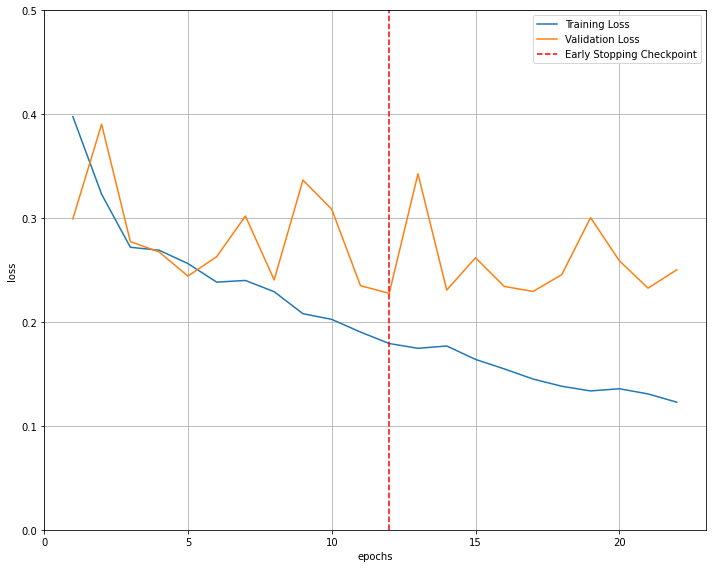

Input Image


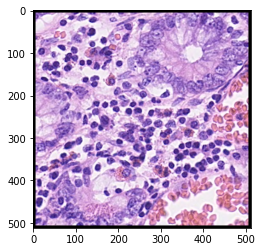

Predicted Mask Sigmoid


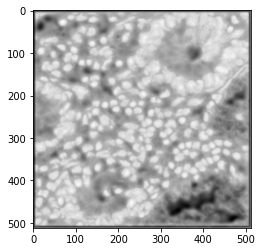

Predicted Mask Binary


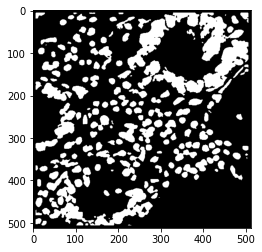

Actual Mask


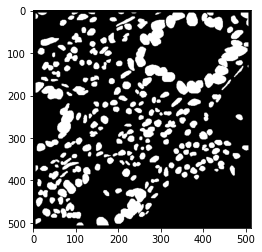

iou score: 0.6925471806895491
AJI score: 0.6925471806895491
AJI+ score: 0.6925471806895491
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6925464881430611
Panoptic Quality (PQ): 0.6925464881430611
Dice2 score: 0.8183490405359374 

Batch size: 1, Learning rate: 0.0001 , Epochs: 60




  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.320386).  Saving model ...



  2%|▏         | 1/60 [00:20<20:16, 20.62s/it]

Train Epoch: 1 @ 05:12:36.156494 - Train Loss: 0.5424 - Valid Loss: 0.3204
Validation loss decreased (0.320386 --> 0.290708).  Saving model ...



  3%|▎         | 2/60 [00:41<19:59, 20.68s/it]

Train Epoch: 2 @ 05:12:56.970254 - Train Loss: 0.3586 - Valid Loss: 0.2907
Validation loss decreased (0.290708 --> 0.274240).  Saving model ...



  5%|▌         | 3/60 [01:02<19:44, 20.78s/it]

Train Epoch: 3 @ 05:13:17.987230 - Train Loss: 0.2992 - Valid Loss: 0.2742
Validation loss decreased (0.274240 --> 0.265631).  Saving model ...



  7%|▋         | 4/60 [01:23<19:23, 20.77s/it]

Train Epoch: 4 @ 05:13:38.734210 - Train Loss: 0.2643 - Valid Loss: 0.2656



  8%|▊         | 5/60 [01:43<18:55, 20.65s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 05:13:59.105073 - Train Loss: 0.2488 - Valid Loss: 0.2666
Validation loss decreased (0.265631 --> 0.249803).  Saving model ...



 10%|█         | 6/60 [02:04<18:39, 20.74s/it]

Train Epoch: 6 @ 05:14:20.044184 - Train Loss: 0.2332 - Valid Loss: 0.2498
Validation loss decreased (0.249803 --> 0.245501).  Saving model ...



 12%|█▏        | 7/60 [02:25<18:19, 20.75s/it]

Train Epoch: 7 @ 05:14:40.828827 - Train Loss: 0.2241 - Valid Loss: 0.2455
Validation loss decreased (0.245501 --> 0.245070).  Saving model ...



 13%|█▎        | 8/60 [02:46<17:59, 20.76s/it]

Train Epoch: 8 @ 05:15:01.622190 - Train Loss: 0.2081 - Valid Loss: 0.2451



 15%|█▌        | 9/60 [03:06<17:36, 20.72s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 9 @ 05:15:22.237469 - Train Loss: 0.2035 - Valid Loss: 0.2623
Validation loss decreased (0.245070 --> 0.241841).  Saving model ...



 17%|█▋        | 10/60 [03:27<17:18, 20.76s/it]

Train Epoch: 10 @ 05:15:43.106050 - Train Loss: 0.1941 - Valid Loss: 0.2418
Validation loss decreased (0.241841 --> 0.238333).  Saving model ...



 18%|█▊        | 11/60 [03:48<17:00, 20.82s/it]

Train Epoch: 11 @ 05:16:04.055778 - Train Loss: 0.1852 - Valid Loss: 0.2383



 20%|██        | 12/60 [04:08<16:32, 20.68s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 05:16:24.426191 - Train Loss: 0.1758 - Valid Loss: 0.2391
Validation loss decreased (0.238333 --> 0.233528).  Saving model ...



 22%|██▏       | 13/60 [04:29<16:12, 20.69s/it]

Train Epoch: 13 @ 05:16:45.120995 - Train Loss: 0.1747 - Valid Loss: 0.2335



 23%|██▎       | 14/60 [04:50<15:51, 20.69s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 14 @ 05:17:05.802846 - Train Loss: 0.1636 - Valid Loss: 0.2481



 25%|██▌       | 15/60 [05:10<15:26, 20.59s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 15 @ 05:17:26.155157 - Train Loss: 0.1592 - Valid Loss: 0.2347



 27%|██▋       | 16/60 [05:30<15:01, 20.48s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 16 @ 05:17:46.403296 - Train Loss: 0.1523 - Valid Loss: 0.2424



 28%|██▊       | 17/60 [05:51<14:41, 20.49s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 17 @ 05:18:06.913165 - Train Loss: 0.1475 - Valid Loss: 0.2402



 30%|███       | 18/60 [06:11<14:18, 20.44s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 18 @ 05:18:27.239917 - Train Loss: 0.1458 - Valid Loss: 0.2566



 32%|███▏      | 19/60 [06:31<13:55, 20.39s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 19 @ 05:18:47.502977 - Train Loss: 0.1406 - Valid Loss: 0.2489



 33%|███▎      | 20/60 [06:52<13:36, 20.40s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 20 @ 05:19:07.940376 - Train Loss: 0.1367 - Valid Loss: 0.2489



 35%|███▌      | 21/60 [07:12<13:15, 20.41s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 21 @ 05:19:28.354270 - Train Loss: 0.1325 - Valid Loss: 0.2378



 37%|███▋      | 22/60 [07:33<12:53, 20.35s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 22 @ 05:19:48.572887 - Train Loss: 0.1335 - Valid Loss: 0.2340
EarlyStopping counter: 10 out of 10
Early stopping


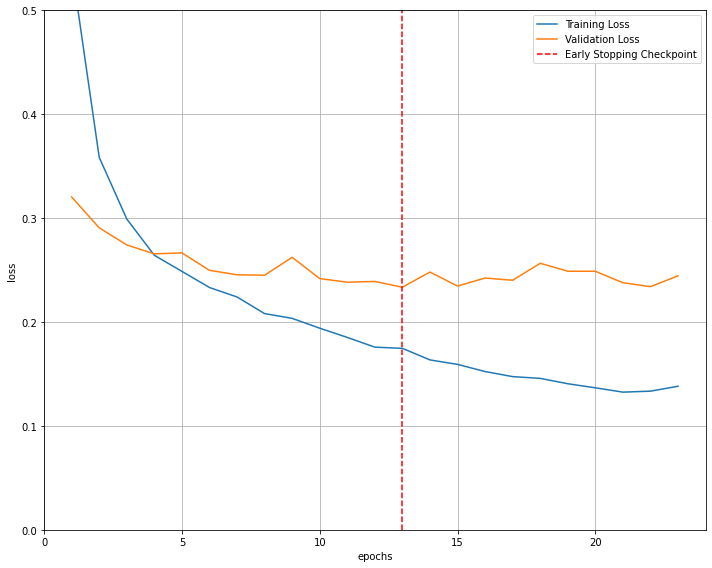

Input Image


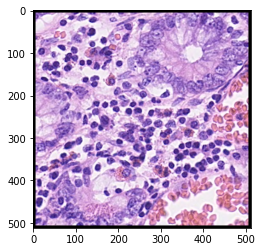

Predicted Mask Sigmoid


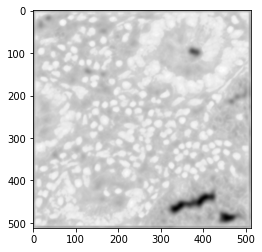

Predicted Mask Binary


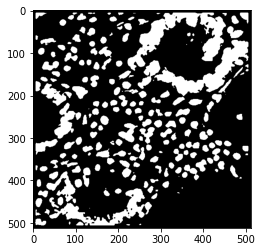

Actual Mask


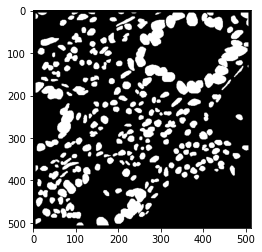

iou score: 0.6875140875883374
AJI score: 0.6875140875883374
AJI+ score: 0.6875140875883374
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6875134000749374
Panoptic Quality (PQ): 0.6875134000749374
Dice2 score: 0.8148247088957682 

Batch size: 1, Learning rate: 1e-05 , Epochs: 60





  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.645733).  Saving model ...




  2%|▏         | 1/60 [00:20<20:33, 20.90s/it]

Train Epoch: 1 @ 05:20:32.055875 - Train Loss: 0.7150 - Valid Loss: 0.6457
Validation loss decreased (0.645733 --> 0.433582).  Saving model ...




  3%|▎         | 2/60 [00:41<20:11, 20.89s/it]

Train Epoch: 2 @ 05:20:52.900579 - Train Loss: 0.5339 - Valid Loss: 0.4336
Validation loss decreased (0.433582 --> 0.427243).  Saving model ...




  5%|▌         | 3/60 [01:02<19:51, 20.90s/it]

Train Epoch: 3 @ 05:21:13.852697 - Train Loss: 0.4266 - Valid Loss: 0.4272
Validation loss decreased (0.427243 --> 0.404788).  Saving model ...




  7%|▋         | 4/60 [01:23<19:34, 20.98s/it]

Train Epoch: 4 @ 05:21:35.002191 - Train Loss: 0.3929 - Valid Loss: 0.4048
Validation loss decreased (0.404788 --> 0.386697).  Saving model ...




  8%|▊         | 5/60 [01:44<19:14, 20.99s/it]

Train Epoch: 5 @ 05:21:56.036155 - Train Loss: 0.3749 - Valid Loss: 0.3867
Validation loss decreased (0.386697 --> 0.385845).  Saving model ...




 10%|█         | 6/60 [02:05<18:54, 21.01s/it]

Train Epoch: 6 @ 05:22:17.076407 - Train Loss: 0.3556 - Valid Loss: 0.3858
Validation loss decreased (0.385845 --> 0.369141).  Saving model ...




 12%|█▏        | 7/60 [02:26<18:31, 20.97s/it]

Train Epoch: 7 @ 05:22:37.955486 - Train Loss: 0.3408 - Valid Loss: 0.3691
Validation loss decreased (0.369141 --> 0.351375).  Saving model ...




 13%|█▎        | 8/60 [02:47<18:11, 20.99s/it]

Train Epoch: 8 @ 05:22:58.997083 - Train Loss: 0.3298 - Valid Loss: 0.3514




 15%|█▌        | 9/60 [03:08<17:45, 20.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 9 @ 05:23:19.654719 - Train Loss: 0.3191 - Valid Loss: 0.3517
Validation loss decreased (0.351375 --> 0.342735).  Saving model ...




 17%|█▋        | 10/60 [03:29<17:22, 20.86s/it]

Train Epoch: 10 @ 05:23:40.428683 - Train Loss: 0.3081 - Valid Loss: 0.3427
Validation loss decreased (0.342735 --> 0.321091).  Saving model ...




 18%|█▊        | 11/60 [03:50<17:04, 20.90s/it]

Train Epoch: 11 @ 05:24:01.434327 - Train Loss: 0.3034 - Valid Loss: 0.3211
Validation loss decreased (0.321091 --> 0.319386).  Saving model ...




 20%|██        | 12/60 [04:11<16:45, 20.95s/it]

Train Epoch: 12 @ 05:24:22.495081 - Train Loss: 0.2966 - Valid Loss: 0.3194
Validation loss decreased (0.319386 --> 0.317468).  Saving model ...




 22%|██▏       | 13/60 [04:32<16:24, 20.94s/it]

Train Epoch: 13 @ 05:24:43.417896 - Train Loss: 0.2942 - Valid Loss: 0.3175
Validation loss decreased (0.317468 --> 0.308201).  Saving model ...




 23%|██▎       | 14/60 [04:53<16:04, 20.96s/it]

Train Epoch: 14 @ 05:25:04.426758 - Train Loss: 0.2860 - Valid Loss: 0.3082




 25%|██▌       | 15/60 [05:13<15:39, 20.88s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 15 @ 05:25:25.127435 - Train Loss: 0.2818 - Valid Loss: 0.3168




 27%|██▋       | 16/60 [05:34<15:12, 20.73s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 16 @ 05:25:45.506828 - Train Loss: 0.2767 - Valid Loss: 0.3126
Validation loss decreased (0.308201 --> 0.303466).  Saving model ...




 28%|██▊       | 17/60 [05:55<14:52, 20.76s/it]

Train Epoch: 17 @ 05:26:06.322236 - Train Loss: 0.2735 - Valid Loss: 0.3035
Validation loss decreased (0.303466 --> 0.296685).  Saving model ...




 30%|███       | 18/60 [06:16<14:36, 20.88s/it]

Train Epoch: 18 @ 05:26:27.489196 - Train Loss: 0.2710 - Valid Loss: 0.2967




 32%|███▏      | 19/60 [06:37<14:13, 20.82s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 19 @ 05:26:48.179462 - Train Loss: 0.2665 - Valid Loss: 0.3004
Validation loss decreased (0.296685 --> 0.286091).  Saving model ...




 33%|███▎      | 20/60 [06:58<13:54, 20.87s/it]

Train Epoch: 20 @ 05:27:09.167134 - Train Loss: 0.2620 - Valid Loss: 0.2861




 35%|███▌      | 21/60 [07:18<13:29, 20.75s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 21 @ 05:27:29.633922 - Train Loss: 0.2609 - Valid Loss: 0.3084




 37%|███▋      | 22/60 [07:38<13:05, 20.67s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 22 @ 05:27:50.122351 - Train Loss: 0.2568 - Valid Loss: 0.2924
Validation loss decreased (0.286091 --> 0.275842).  Saving model ...




 38%|███▊      | 23/60 [07:59<12:48, 20.77s/it]

Train Epoch: 23 @ 05:28:11.134433 - Train Loss: 0.2556 - Valid Loss: 0.2758




 40%|████      | 24/60 [08:20<12:24, 20.68s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 24 @ 05:28:31.580842 - Train Loss: 0.2519 - Valid Loss: 0.2775
Validation loss decreased (0.275842 --> 0.274506).  Saving model ...




 42%|████▏     | 25/60 [08:41<12:05, 20.72s/it]

Train Epoch: 25 @ 05:28:52.409264 - Train Loss: 0.2481 - Valid Loss: 0.2745
Validation loss decreased (0.274506 --> 0.270067).  Saving model ...




 43%|████▎     | 26/60 [09:02<11:49, 20.85s/it]

Train Epoch: 26 @ 05:29:13.575253 - Train Loss: 0.2464 - Valid Loss: 0.2701




 45%|████▌     | 27/60 [09:22<11:24, 20.74s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 27 @ 05:29:34.055053 - Train Loss: 0.2436 - Valid Loss: 0.2764
Validation loss decreased (0.270067 --> 0.265404).  Saving model ...




 47%|████▋     | 28/60 [09:43<11:03, 20.74s/it]

Train Epoch: 28 @ 05:29:54.790835 - Train Loss: 0.2408 - Valid Loss: 0.2654




 48%|████▊     | 29/60 [10:04<10:43, 20.74s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 29 @ 05:30:15.538416 - Train Loss: 0.2385 - Valid Loss: 0.2670




 50%|█████     | 30/60 [10:24<10:19, 20.64s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 30 @ 05:30:35.941717 - Train Loss: 0.2361 - Valid Loss: 0.2705




 52%|█████▏    | 31/60 [10:45<09:56, 20.55s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 31 @ 05:30:56.285529 - Train Loss: 0.2339 - Valid Loss: 0.2893
Validation loss decreased (0.265404 --> 0.259472).  Saving model ...




 53%|█████▎    | 32/60 [11:06<09:39, 20.69s/it]

Train Epoch: 32 @ 05:31:17.286699 - Train Loss: 0.2310 - Valid Loss: 0.2595




 55%|█████▌    | 33/60 [11:26<09:17, 20.65s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 33 @ 05:31:37.858116 - Train Loss: 0.2296 - Valid Loss: 0.2613
Validation loss decreased (0.259472 --> 0.256754).  Saving model ...




 57%|█████▋    | 34/60 [11:47<08:57, 20.68s/it]

Train Epoch: 34 @ 05:31:58.592884 - Train Loss: 0.2278 - Valid Loss: 0.2568




 58%|█████▊    | 35/60 [12:08<08:37, 20.68s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 35 @ 05:32:19.291136 - Train Loss: 0.2265 - Valid Loss: 0.2638




 60%|██████    | 36/60 [12:28<08:16, 20.68s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 36 @ 05:32:39.951462 - Train Loss: 0.2243 - Valid Loss: 0.2638




 62%|██████▏   | 37/60 [12:49<07:55, 20.67s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 37 @ 05:33:00.606642 - Train Loss: 0.2220 - Valid Loss: 0.2593




 63%|██████▎   | 38/60 [13:09<07:33, 20.59s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 38 @ 05:33:21.022342 - Train Loss: 0.2200 - Valid Loss: 0.2621
Validation loss decreased (0.256754 --> 0.251331).  Saving model ...




 65%|██████▌   | 39/60 [13:30<07:14, 20.67s/it]

Train Epoch: 39 @ 05:33:41.860376 - Train Loss: 0.2187 - Valid Loss: 0.2513




 67%|██████▋   | 40/60 [13:51<06:53, 20.66s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 40 @ 05:34:02.489787 - Train Loss: 0.2165 - Valid Loss: 0.2684




 68%|██████▊   | 41/60 [14:11<06:31, 20.59s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 41 @ 05:34:22.939662 - Train Loss: 0.2152 - Valid Loss: 0.2601




 70%|███████   | 42/60 [14:32<06:09, 20.52s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 42 @ 05:34:43.283751 - Train Loss: 0.2157 - Valid Loss: 0.2565




 72%|███████▏  | 43/60 [14:52<05:48, 20.53s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 43 @ 05:35:03.830184 - Train Loss: 0.2133 - Valid Loss: 0.2602




 73%|███████▎  | 44/60 [15:13<05:28, 20.52s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 44 @ 05:35:24.339229 - Train Loss: 0.2112 - Valid Loss: 0.2543




 75%|███████▌  | 45/60 [15:33<05:06, 20.46s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 45 @ 05:35:44.654337 - Train Loss: 0.2094 - Valid Loss: 0.2526
Validation loss decreased (0.251331 --> 0.248081).  Saving model ...




 77%|███████▋  | 46/60 [15:54<04:48, 20.58s/it]

Train Epoch: 46 @ 05:36:05.512295 - Train Loss: 0.2094 - Valid Loss: 0.2481




 78%|███████▊  | 47/60 [16:15<04:27, 20.61s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 47 @ 05:36:26.210317 - Train Loss: 0.2080 - Valid Loss: 0.2557




 80%|████████  | 48/60 [16:35<04:06, 20.53s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 48 @ 05:36:46.539966 - Train Loss: 0.2059 - Valid Loss: 0.2486




 82%|████████▏ | 49/60 [16:55<03:45, 20.49s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 49 @ 05:37:06.947114 - Train Loss: 0.2053 - Valid Loss: 0.2500
Validation loss decreased (0.248081 --> 0.246605).  Saving model ...




 83%|████████▎ | 50/60 [17:16<03:26, 20.67s/it]

Train Epoch: 50 @ 05:37:28.026404 - Train Loss: 0.2045 - Valid Loss: 0.2466
Validation loss decreased (0.246605 --> 0.240592).  Saving model ...




 85%|████████▌ | 51/60 [17:37<03:07, 20.78s/it]

Train Epoch: 51 @ 05:37:49.074446 - Train Loss: 0.2023 - Valid Loss: 0.2406




 87%|████████▋ | 52/60 [17:58<02:45, 20.72s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 52 @ 05:38:09.650945 - Train Loss: 0.2021 - Valid Loss: 0.2441




 88%|████████▊ | 53/60 [18:18<02:24, 20.61s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 53 @ 05:38:29.988167 - Train Loss: 0.2014 - Valid Loss: 0.2461




 90%|█████████ | 54/60 [18:39<02:03, 20.55s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 54 @ 05:38:50.416657 - Train Loss: 0.1998 - Valid Loss: 0.2463




 92%|█████████▏| 55/60 [18:59<01:42, 20.56s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 55 @ 05:39:11.008783 - Train Loss: 0.1976 - Valid Loss: 0.2508




 93%|█████████▎| 56/60 [19:20<01:22, 20.50s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 56 @ 05:39:31.374615 - Train Loss: 0.1972 - Valid Loss: 0.2540




 95%|█████████▌| 57/60 [19:40<01:01, 20.47s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 57 @ 05:39:51.773515 - Train Loss: 0.1966 - Valid Loss: 0.2458




 97%|█████████▋| 58/60 [20:01<00:41, 20.50s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 58 @ 05:40:12.343581 - Train Loss: 0.1948 - Valid Loss: 0.2548




 98%|█████████▊| 59/60 [20:21<00:20, 20.47s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 59 @ 05:40:32.743773 - Train Loss: 0.1944 - Valid Loss: 0.2423




100%|██████████| 60/60 [20:41<00:00, 20.70s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 60 @ 05:40:53.077373 - Train Loss: 0.1938 - Valid Loss: 0.2596


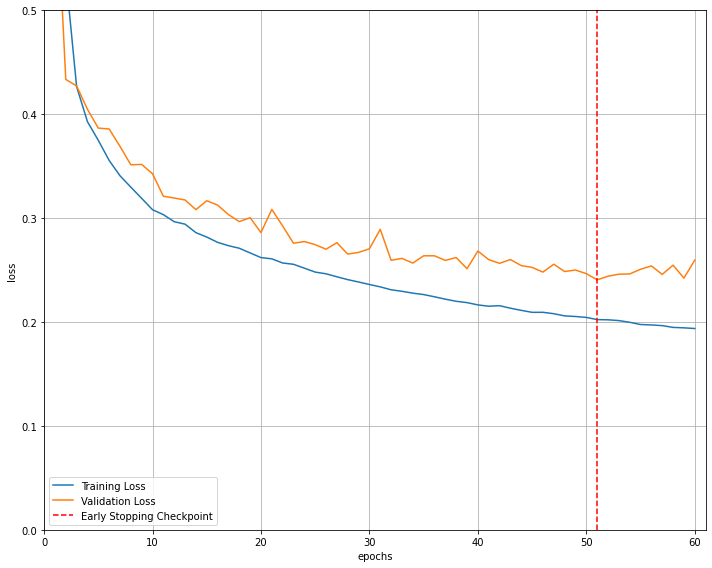

Input Image


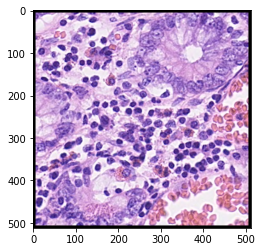

Predicted Mask Sigmoid


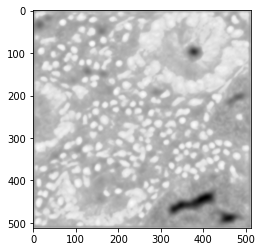

Predicted Mask Binary


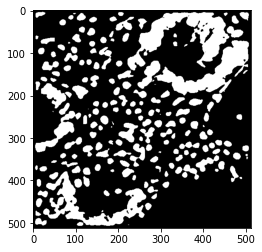

Actual Mask


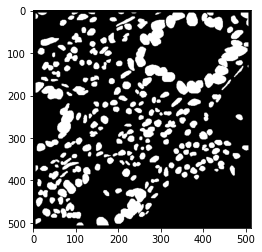

iou score: 0.6438214044648883
AJI score: 0.6438214044648883
AJI+ score: 0.6438214044648883
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6438207606441277
Panoptic Quality (PQ): 0.6438207606441277
Dice2 score: 0.7833228144081393 

Batch size: 4, Learning rate: 0.001 , Epochs: 60





  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.358622).  Saving model ...




  2%|▏         | 1/60 [00:20<20:12, 20.56s/it]

Train Epoch: 1 @ 05:41:15.673209 - Train Loss: 0.4553 - Valid Loss: 0.3586




  3%|▎         | 2/60 [00:40<19:41, 20.37s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 2 @ 05:41:35.617501 - Train Loss: 0.3077 - Valid Loss: 0.3588
Validation loss decreased (0.358622 --> 0.312838).  Saving model ...




  5%|▌         | 3/60 [01:00<19:17, 20.32s/it]

Train Epoch: 3 @ 05:41:55.800048 - Train Loss: 0.2776 - Valid Loss: 0.3128
Validation loss decreased (0.312838 --> 0.285523).  Saving model ...




  7%|▋         | 4/60 [01:21<19:00, 20.37s/it]

Train Epoch: 4 @ 05:42:16.280251 - Train Loss: 0.2632 - Valid Loss: 0.2855
Validation loss decreased (0.285523 --> 0.277334).  Saving model ...




  8%|▊         | 5/60 [01:41<18:40, 20.37s/it]

Train Epoch: 5 @ 05:42:36.658874 - Train Loss: 0.2516 - Valid Loss: 0.2773
Validation loss decreased (0.277334 --> 0.273646).  Saving model ...




 10%|█         | 6/60 [02:01<18:20, 20.37s/it]

Train Epoch: 6 @ 05:42:57.039142 - Train Loss: 0.2281 - Valid Loss: 0.2736




 12%|█▏        | 7/60 [02:21<17:54, 20.28s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 05:43:17.108419 - Train Loss: 0.2148 - Valid Loss: 0.3164




 13%|█▎        | 8/60 [02:41<17:29, 20.19s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 8 @ 05:43:37.072741 - Train Loss: 0.2135 - Valid Loss: 0.2765
Validation loss decreased (0.273646 --> 0.242617).  Saving model ...




 15%|█▌        | 9/60 [03:02<17:11, 20.22s/it]

Train Epoch: 9 @ 05:43:57.386319 - Train Loss: 0.2088 - Valid Loss: 0.2426




 17%|█▋        | 10/60 [03:22<16:46, 20.13s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 10 @ 05:44:17.301852 - Train Loss: 0.1930 - Valid Loss: 0.2498
Validation loss decreased (0.242617 --> 0.234455).  Saving model ...




 18%|█▊        | 11/60 [03:42<16:26, 20.13s/it]

Train Epoch: 11 @ 05:44:37.419128 - Train Loss: 0.1849 - Valid Loss: 0.2345




 20%|██        | 12/60 [04:02<16:03, 20.08s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 05:44:57.392441 - Train Loss: 0.1792 - Valid Loss: 0.2462




 22%|██▏       | 13/60 [04:22<15:41, 20.03s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 13 @ 05:45:17.312420 - Train Loss: 0.1686 - Valid Loss: 0.2392




 23%|██▎       | 14/60 [04:41<15:16, 19.93s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 14 @ 05:45:37.001445 - Train Loss: 0.1585 - Valid Loss: 0.2588




 25%|██▌       | 15/60 [05:01<14:54, 19.87s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 15 @ 05:45:56.746072 - Train Loss: 0.1530 - Valid Loss: 0.2528




 27%|██▋       | 16/60 [05:21<14:35, 19.90s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 16 @ 05:46:16.694592 - Train Loss: 0.1423 - Valid Loss: 0.2566




 28%|██▊       | 17/60 [05:41<14:13, 19.84s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 17 @ 05:46:36.409936 - Train Loss: 0.1428 - Valid Loss: 0.2619




 30%|███       | 18/60 [06:00<13:51, 19.80s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 18 @ 05:46:56.112489 - Train Loss: 0.1394 - Valid Loss: 0.2893




 32%|███▏      | 19/60 [06:20<13:33, 19.84s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 19 @ 05:47:16.028822 - Train Loss: 0.1665 - Valid Loss: 0.2440




 33%|███▎      | 20/60 [06:40<13:12, 19.82s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 20 @ 05:47:35.818918 - Train Loss: 0.1347 - Valid Loss: 0.2469
EarlyStopping counter: 10 out of 10
Early stopping


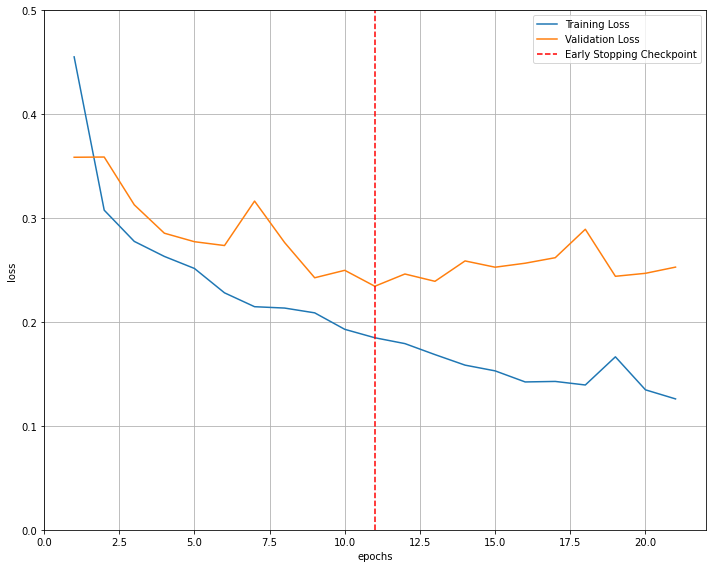

Input Image


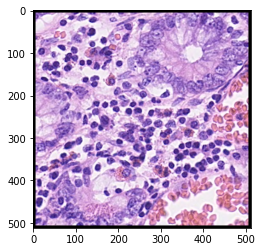

Predicted Mask Sigmoid


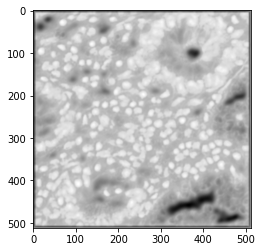

Predicted Mask Binary


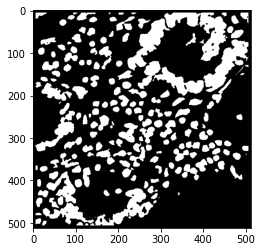

Actual Mask


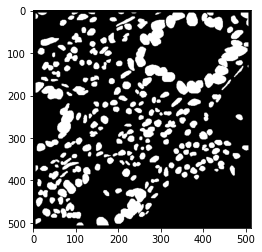

iou score: 0.6980665438666547
AJI score: 0.6980665438666547
AJI+ score: 0.6980665438666547
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6980658458008089
Panoptic Quality (PQ): 0.6980658458008089
Dice2 score: 0.8221898563257628 

Batch size: 4, Learning rate: 0.0001 , Epochs: 60






  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.337648).  Saving model ...





  2%|▏         | 1/60 [00:20<20:32, 20.89s/it]

Train Epoch: 1 @ 05:48:18.446051 - Train Loss: 0.4727 - Valid Loss: 0.3376
Validation loss decreased (0.337648 --> 0.316493).  Saving model ...





  3%|▎         | 2/60 [00:41<20:11, 20.89s/it]

Train Epoch: 2 @ 05:48:39.328502 - Train Loss: 0.3413 - Valid Loss: 0.3165
Validation loss decreased (0.316493 --> 0.295026).  Saving model ...





  5%|▌         | 3/60 [01:02<19:52, 20.92s/it]

Train Epoch: 3 @ 05:49:00.301244 - Train Loss: 0.2950 - Valid Loss: 0.2950
Validation loss decreased (0.295026 --> 0.286664).  Saving model ...





  7%|▋         | 4/60 [01:23<19:29, 20.88s/it]

Train Epoch: 4 @ 05:49:21.086869 - Train Loss: 0.2590 - Valid Loss: 0.2867
Validation loss decreased (0.286664 --> 0.273015).  Saving model ...





  8%|▊         | 5/60 [01:44<19:04, 20.80s/it]

Train Epoch: 5 @ 05:49:41.719188 - Train Loss: 0.2441 - Valid Loss: 0.2730





 10%|█         | 6/60 [02:04<18:39, 20.73s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 05:50:02.274366 - Train Loss: 0.2294 - Valid Loss: 0.2771
Validation loss decreased (0.273015 --> 0.258899).  Saving model ...





 12%|█▏        | 7/60 [02:25<18:18, 20.72s/it]

Train Epoch: 7 @ 05:50:22.977194 - Train Loss: 0.2171 - Valid Loss: 0.2589





 13%|█▎        | 8/60 [02:45<17:49, 20.58s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 05:50:43.214111 - Train Loss: 0.2059 - Valid Loss: 0.2607
Validation loss decreased (0.258899 --> 0.252899).  Saving model ...





 15%|█▌        | 9/60 [03:06<17:33, 20.66s/it]

Train Epoch: 9 @ 05:51:04.073199 - Train Loss: 0.2044 - Valid Loss: 0.2529





 17%|█▋        | 10/60 [03:26<17:09, 20.60s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 10 @ 05:51:24.521033 - Train Loss: 0.1916 - Valid Loss: 0.2569
Validation loss decreased (0.252899 --> 0.245618).  Saving model ...





 18%|█▊        | 11/60 [03:47<16:49, 20.60s/it]

Train Epoch: 11 @ 05:51:45.132884 - Train Loss: 0.1830 - Valid Loss: 0.2456





 20%|██        | 12/60 [04:08<16:26, 20.55s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 05:52:05.560382 - Train Loss: 0.1753 - Valid Loss: 0.2517





 22%|██▏       | 13/60 [04:28<16:03, 20.51s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 13 @ 05:52:25.975041 - Train Loss: 0.1780 - Valid Loss: 0.2541





 23%|██▎       | 14/60 [04:48<15:39, 20.42s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 14 @ 05:52:46.201657 - Train Loss: 0.1635 - Valid Loss: 0.2660





 25%|██▌       | 15/60 [05:08<15:17, 20.39s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 15 @ 05:53:06.514732 - Train Loss: 0.1604 - Valid Loss: 0.2588





 27%|██▋       | 16/60 [05:29<14:58, 20.42s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 16 @ 05:53:27.016270 - Train Loss: 0.1528 - Valid Loss: 0.2514





 28%|██▊       | 17/60 [05:49<14:35, 20.36s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 17 @ 05:53:47.232131 - Train Loss: 0.1576 - Valid Loss: 0.2524
Validation loss decreased (0.245618 --> 0.241814).  Saving model ...





 30%|███       | 18/60 [06:10<14:18, 20.43s/it]

Train Epoch: 18 @ 05:54:07.829840 - Train Loss: 0.1468 - Valid Loss: 0.2418





 32%|███▏      | 19/60 [06:30<13:59, 20.47s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 19 @ 05:54:28.384779 - Train Loss: 0.1439 - Valid Loss: 0.2437





 33%|███▎      | 20/60 [06:51<13:38, 20.45s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 20 @ 05:54:48.796736 - Train Loss: 0.1382 - Valid Loss: 0.2455





 35%|███▌      | 21/60 [07:11<13:17, 20.45s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 21 @ 05:55:09.246319 - Train Loss: 0.1317 - Valid Loss: 0.2463





 37%|███▋      | 22/60 [07:31<12:54, 20.38s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 22 @ 05:55:29.466442 - Train Loss: 0.1279 - Valid Loss: 0.2515





 38%|███▊      | 23/60 [07:52<12:32, 20.35s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 23 @ 05:55:49.734543 - Train Loss: 0.1258 - Valid Loss: 0.2463





 40%|████      | 24/60 [08:12<12:14, 20.39s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 24 @ 05:56:10.233399 - Train Loss: 0.1260 - Valid Loss: 0.2519





 42%|████▏     | 25/60 [08:32<11:52, 20.36s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 25 @ 05:56:30.506763 - Train Loss: 0.1254 - Valid Loss: 0.2583





 43%|████▎     | 26/60 [08:53<11:30, 20.31s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 26 @ 05:56:50.707237 - Train Loss: 0.1202 - Valid Loss: 0.2583





 45%|████▌     | 27/60 [09:13<11:11, 20.35s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 27 @ 05:57:11.163711 - Train Loss: 0.1159 - Valid Loss: 0.2624
EarlyStopping counter: 10 out of 10
Early stopping


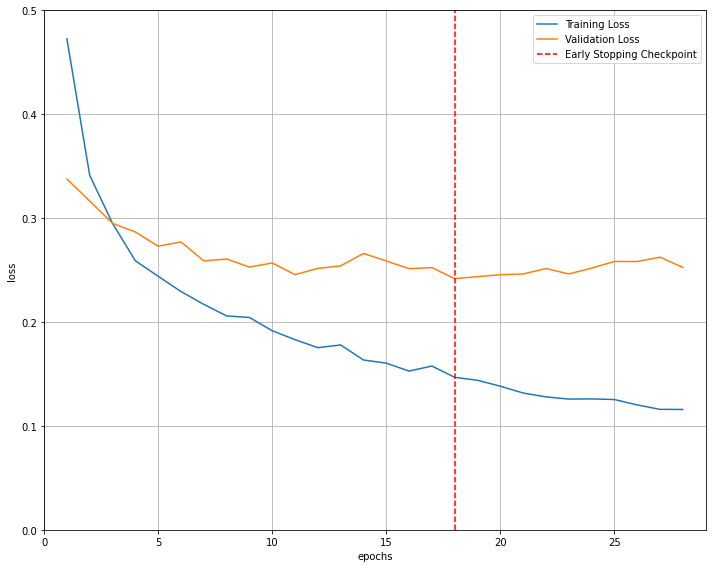

Input Image


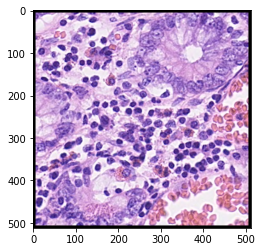

Predicted Mask Sigmoid


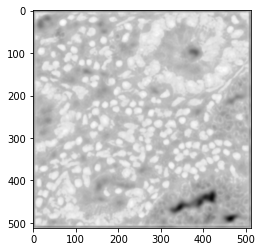

Predicted Mask Binary


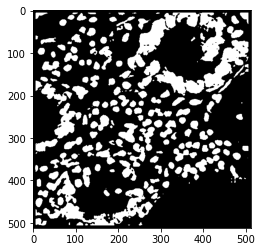

Actual Mask


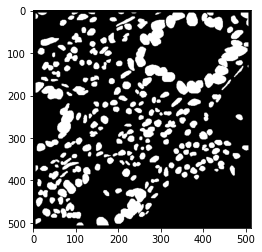

iou score: 0.6856127886323268
AJI score: 0.6856127886323268
AJI+ score: 0.6856127886323268
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6856121030202238
Panoptic Quality (PQ): 0.6856121030202238
Dice2 score: 0.8134878819810326 

Batch size: 4, Learning rate: 1e-05 , Epochs: 60







  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.653131).  Saving model ...






  2%|▏         | 1/60 [00:20<20:22, 20.73s/it]

Train Epoch: 1 @ 05:57:54.297388 - Train Loss: 0.7167 - Valid Loss: 0.6531
Validation loss decreased (0.653131 --> 0.476808).  Saving model ...






  3%|▎         | 2/60 [00:41<20:08, 20.84s/it]

Train Epoch: 2 @ 05:58:15.399030 - Train Loss: 0.5908 - Valid Loss: 0.4768
Validation loss decreased (0.476808 --> 0.375529).  Saving model ...






  5%|▌         | 3/60 [01:02<19:52, 20.92s/it]

Train Epoch: 3 @ 05:58:36.506631 - Train Loss: 0.4448 - Valid Loss: 0.3755
Validation loss decreased (0.375529 --> 0.346270).  Saving model ...






  7%|▋         | 4/60 [01:23<19:30, 20.91s/it]

Train Epoch: 4 @ 05:58:57.396243 - Train Loss: 0.4003 - Valid Loss: 0.3463
Validation loss decreased (0.346270 --> 0.346091).  Saving model ...






  8%|▊         | 5/60 [01:44<19:12, 20.96s/it]

Train Epoch: 5 @ 05:59:18.463315 - Train Loss: 0.3770 - Valid Loss: 0.3461
Validation loss decreased (0.346091 --> 0.325768).  Saving model ...






 10%|█         | 6/60 [02:05<18:53, 21.00s/it]

Train Epoch: 6 @ 05:59:39.545480 - Train Loss: 0.3620 - Valid Loss: 0.3258
Validation loss decreased (0.325768 --> 0.313454).  Saving model ...






 12%|█▏        | 7/60 [02:27<18:35, 21.04s/it]

Train Epoch: 7 @ 06:00:00.693038 - Train Loss: 0.3486 - Valid Loss: 0.3135






 13%|█▎        | 8/60 [02:47<18:05, 20.88s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 06:00:21.193403 - Train Loss: 0.3357 - Valid Loss: 0.3172






 15%|█▌        | 9/60 [03:07<17:37, 20.73s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 9 @ 06:00:41.562271 - Train Loss: 0.3274 - Valid Loss: 0.3150






 17%|█▋        | 10/60 [03:28<17:14, 20.69s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 10 @ 06:01:02.172531 - Train Loss: 0.3191 - Valid Loss: 0.3232
Validation loss decreased (0.313454 --> 0.309720).  Saving model ...






 18%|█▊        | 11/60 [03:49<16:56, 20.75s/it]

Train Epoch: 11 @ 06:01:23.060130 - Train Loss: 0.3126 - Valid Loss: 0.3097
Validation loss decreased (0.309720 --> 0.303999).  Saving model ...






 20%|██        | 12/60 [04:10<16:37, 20.78s/it]

Train Epoch: 12 @ 06:01:43.919866 - Train Loss: 0.3081 - Valid Loss: 0.3040






 22%|██▏       | 13/60 [04:31<16:15, 20.75s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 13 @ 06:02:04.593915 - Train Loss: 0.3045 - Valid Loss: 0.3142
Validation loss decreased (0.303999 --> 0.303699).  Saving model ...






 23%|██▎       | 14/60 [04:51<15:57, 20.81s/it]

Train Epoch: 14 @ 06:02:25.536113 - Train Loss: 0.2986 - Valid Loss: 0.3037
Validation loss decreased (0.303699 --> 0.286798).  Saving model ...






 25%|██▌       | 15/60 [05:12<15:37, 20.82s/it]

Train Epoch: 15 @ 06:02:46.397562 - Train Loss: 0.2959 - Valid Loss: 0.2868
Validation loss decreased (0.286798 --> 0.282539).  Saving model ...






 27%|██▋       | 16/60 [05:33<15:19, 20.90s/it]

Train Epoch: 16 @ 06:03:07.464959 - Train Loss: 0.2902 - Valid Loss: 0.2825






 28%|██▊       | 17/60 [05:54<14:55, 20.83s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 17 @ 06:03:28.153661 - Train Loss: 0.2854 - Valid Loss: 0.2912
Validation loss decreased (0.282539 --> 0.279605).  Saving model ...






 30%|███       | 18/60 [06:15<14:34, 20.83s/it]

Train Epoch: 18 @ 06:03:48.964171 - Train Loss: 0.2824 - Valid Loss: 0.2796






 32%|███▏      | 19/60 [06:35<14:11, 20.76s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 19 @ 06:04:09.566375 - Train Loss: 0.2803 - Valid Loss: 0.2828






 33%|███▎      | 20/60 [06:56<13:48, 20.72s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 20 @ 06:04:30.179798 - Train Loss: 0.2758 - Valid Loss: 0.2823






 35%|███▌      | 21/60 [07:17<13:25, 20.66s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 21 @ 06:04:50.721735 - Train Loss: 0.2731 - Valid Loss: 0.2932
Validation loss decreased (0.279605 --> 0.276277).  Saving model ...






 37%|███▋      | 22/60 [07:38<13:07, 20.73s/it]

Train Epoch: 22 @ 06:05:11.596311 - Train Loss: 0.2688 - Valid Loss: 0.2763
Validation loss decreased (0.276277 --> 0.272508).  Saving model ...






 38%|███▊      | 23/60 [07:58<12:48, 20.76s/it]

Train Epoch: 23 @ 06:05:32.436545 - Train Loss: 0.2654 - Valid Loss: 0.2725






 40%|████      | 24/60 [08:19<12:25, 20.72s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 24 @ 06:05:53.055442 - Train Loss: 0.2623 - Valid Loss: 0.2833






 42%|████▏     | 25/60 [08:40<12:03, 20.67s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 25 @ 06:06:13.601717 - Train Loss: 0.2594 - Valid Loss: 0.3086
Validation loss decreased (0.272508 --> 0.268857).  Saving model ...






 43%|████▎     | 26/60 [09:00<11:43, 20.70s/it]

Train Epoch: 26 @ 06:06:34.371566 - Train Loss: 0.2582 - Valid Loss: 0.2689






 45%|████▌     | 27/60 [09:21<11:21, 20.65s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 27 @ 06:06:54.896770 - Train Loss: 0.2544 - Valid Loss: 0.2709






 47%|████▋     | 28/60 [09:41<10:59, 20.62s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 28 @ 06:07:15.455311 - Train Loss: 0.2510 - Valid Loss: 0.2730
Validation loss decreased (0.268857 --> 0.265269).  Saving model ...






 48%|████▊     | 29/60 [10:02<10:40, 20.67s/it]

Train Epoch: 29 @ 06:07:36.241723 - Train Loss: 0.2506 - Valid Loss: 0.2653






 50%|█████     | 30/60 [10:23<10:18, 20.60s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 30 @ 06:07:56.692551 - Train Loss: 0.2463 - Valid Loss: 0.2657






 52%|█████▏    | 31/60 [10:43<09:57, 20.61s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 31 @ 06:08:17.329229 - Train Loss: 0.2430 - Valid Loss: 0.2667






 53%|█████▎    | 32/60 [11:04<09:35, 20.55s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 32 @ 06:08:37.745882 - Train Loss: 0.2414 - Valid Loss: 0.2718






 55%|█████▌    | 33/60 [11:24<09:13, 20.49s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 33 @ 06:08:58.073319 - Train Loss: 0.2397 - Valid Loss: 0.2745
Validation loss decreased (0.265269 --> 0.260660).  Saving model ...






 57%|█████▋    | 34/60 [11:45<08:56, 20.64s/it]

Train Epoch: 34 @ 06:09:19.087469 - Train Loss: 0.2373 - Valid Loss: 0.2607






 58%|█████▊    | 35/60 [12:05<08:34, 20.59s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 35 @ 06:09:39.557039 - Train Loss: 0.2350 - Valid Loss: 0.2670






 60%|██████    | 36/60 [12:26<08:12, 20.51s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 36 @ 06:09:59.887945 - Train Loss: 0.2336 - Valid Loss: 0.2711
Validation loss decreased (0.260660 --> 0.259072).  Saving model ...






 62%|██████▏   | 37/60 [12:47<07:54, 20.65s/it]

Train Epoch: 37 @ 06:10:20.842033 - Train Loss: 0.2323 - Valid Loss: 0.2591






 63%|██████▎   | 38/60 [13:07<07:33, 20.63s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 38 @ 06:10:41.434958 - Train Loss: 0.2301 - Valid Loss: 0.2677






 65%|██████▌   | 39/60 [13:28<07:13, 20.63s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 39 @ 06:11:02.068860 - Train Loss: 0.2296 - Valid Loss: 0.2638
Validation loss decreased (0.259072 --> 0.253413).  Saving model ...






 67%|██████▋   | 40/60 [13:49<06:53, 20.68s/it]

Train Epoch: 40 @ 06:11:22.854318 - Train Loss: 0.2263 - Valid Loss: 0.2534






 68%|██████▊   | 41/60 [14:09<06:31, 20.60s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 41 @ 06:11:43.283972 - Train Loss: 0.2241 - Valid Loss: 0.2563






 70%|███████   | 42/60 [14:30<06:10, 20.60s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 42 @ 06:12:03.886112 - Train Loss: 0.2234 - Valid Loss: 0.2590
Validation loss decreased (0.253413 --> 0.252326).  Saving model ...






 72%|███████▏  | 43/60 [14:51<05:51, 20.67s/it]

Train Epoch: 43 @ 06:12:24.716270 - Train Loss: 0.2221 - Valid Loss: 0.2523






 73%|███████▎  | 44/60 [15:11<05:29, 20.60s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 44 @ 06:12:45.163206 - Train Loss: 0.2202 - Valid Loss: 0.2565






 75%|███████▌  | 45/60 [15:32<05:08, 20.58s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 45 @ 06:13:05.696008 - Train Loss: 0.2196 - Valid Loss: 0.2596






 77%|███████▋  | 46/60 [15:52<04:47, 20.55s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 46 @ 06:13:26.175501 - Train Loss: 0.2176 - Valid Loss: 0.2531






 78%|███████▊  | 47/60 [16:12<04:26, 20.48s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 47 @ 06:13:46.486003 - Train Loss: 0.2151 - Valid Loss: 0.2546
Validation loss decreased (0.252326 --> 0.248923).  Saving model ...






 80%|████████  | 48/60 [16:33<04:07, 20.61s/it]

Train Epoch: 48 @ 06:14:07.391245 - Train Loss: 0.2145 - Valid Loss: 0.2489






 82%|████████▏ | 49/60 [16:54<03:46, 20.60s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 49 @ 06:14:27.971091 - Train Loss: 0.2146 - Valid Loss: 0.2494






 83%|████████▎ | 50/60 [17:14<03:25, 20.51s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 50 @ 06:14:48.274147 - Train Loss: 0.2125 - Valid Loss: 0.2493
Validation loss decreased (0.248923 --> 0.248075).  Saving model ...






 85%|████████▌ | 51/60 [17:35<03:05, 20.61s/it]

Train Epoch: 51 @ 06:15:09.124197 - Train Loss: 0.2111 - Valid Loss: 0.2481






 87%|████████▋ | 52/60 [17:56<02:44, 20.62s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 52 @ 06:15:29.771091 - Train Loss: 0.2089 - Valid Loss: 0.2512
Validation loss decreased (0.248075 --> 0.245308).  Saving model ...






 88%|████████▊ | 53/60 [18:17<02:25, 20.72s/it]

Train Epoch: 53 @ 06:15:50.724279 - Train Loss: 0.2088 - Valid Loss: 0.2453






 90%|█████████ | 54/60 [18:37<02:03, 20.66s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 54 @ 06:16:11.242474 - Train Loss: 0.2090 - Valid Loss: 0.2544






 92%|█████████▏| 55/60 [18:58<01:42, 20.56s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 55 @ 06:16:31.574262 - Train Loss: 0.2062 - Valid Loss: 0.2551






 93%|█████████▎| 56/60 [19:18<01:22, 20.54s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 56 @ 06:16:52.050204 - Train Loss: 0.2056 - Valid Loss: 0.2605






 95%|█████████▌| 57/60 [19:38<01:01, 20.52s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 57 @ 06:17:12.524982 - Train Loss: 0.2046 - Valid Loss: 0.2495






 97%|█████████▋| 58/60 [19:59<00:40, 20.46s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 58 @ 06:17:32.846826 - Train Loss: 0.2016 - Valid Loss: 0.2493
Validation loss decreased (0.245308 --> 0.242806).  Saving model ...






 98%|█████████▊| 59/60 [20:20<00:20, 20.58s/it]

Train Epoch: 59 @ 06:17:53.702075 - Train Loss: 0.2009 - Valid Loss: 0.2428






100%|██████████| 60/60 [20:40<00:00, 20.68s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 60 @ 06:18:14.364616 - Train Loss: 0.2001 - Valid Loss: 0.2432


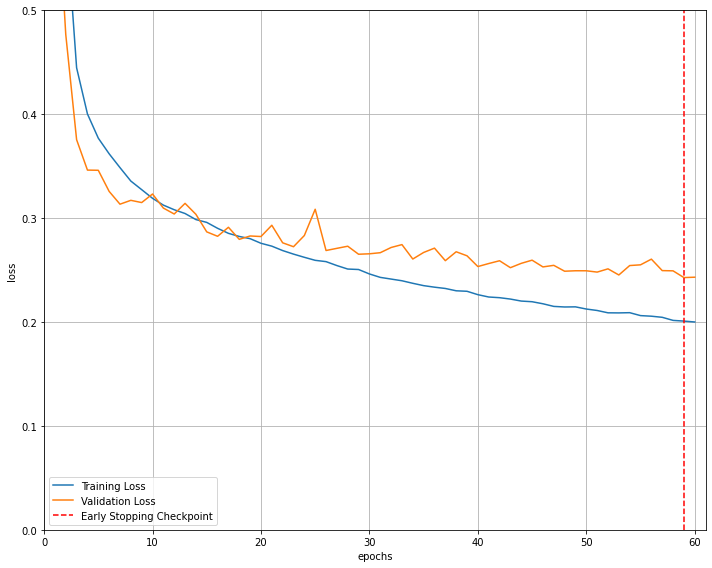

Input Image


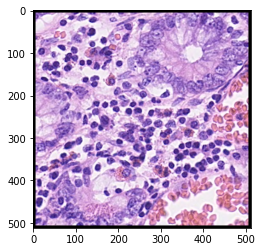

Predicted Mask Sigmoid


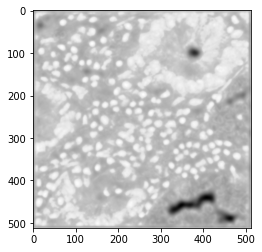

Predicted Mask Binary


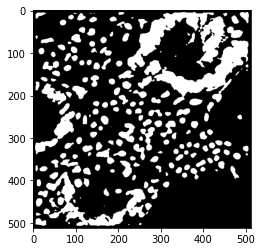

Actual Mask


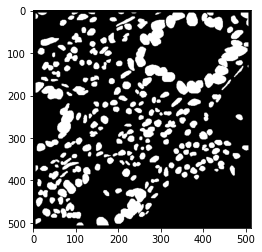

iou score: 0.6476669171179107
AJI score: 0.6476669171179107
AJI+ score: 0.6476669171179107
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6476662694516413
Panoptic Quality (PQ): 0.6476662694516413
Dice2 score: 0.7861624341536284 

Batch size: 8, Learning rate: 0.001 , Epochs: 60







  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.319358).  Saving model ...






  2%|▏         | 1/60 [00:20<19:57, 20.30s/it]

Train Epoch: 1 @ 06:18:36.726104 - Train Loss: 0.4343 - Valid Loss: 0.3194






  3%|▎         | 2/60 [00:40<19:30, 20.19s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 2 @ 06:18:56.648366 - Train Loss: 0.3224 - Valid Loss: 0.3436
Validation loss decreased (0.319358 --> 0.296164).  Saving model ...






  5%|▌         | 3/60 [01:00<19:16, 20.28s/it]

Train Epoch: 3 @ 06:19:17.148670 - Train Loss: 0.2723 - Valid Loss: 0.2962
Validation loss decreased (0.296164 --> 0.293103).  Saving model ...






  7%|▋         | 4/60 [01:21<18:56, 20.30s/it]

Train Epoch: 4 @ 06:19:37.492402 - Train Loss: 0.2587 - Valid Loss: 0.2931






  8%|▊         | 5/60 [01:40<18:28, 20.16s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 06:19:57.311594 - Train Loss: 0.2375 - Valid Loss: 0.3076






 10%|█         | 6/60 [02:00<18:05, 20.10s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 6 @ 06:20:17.294142 - Train Loss: 0.2198 - Valid Loss: 0.4216






 12%|█▏        | 7/60 [02:20<17:41, 20.03s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 7 @ 06:20:37.155533 - Train Loss: 0.2256 - Valid Loss: 0.3079
Validation loss decreased (0.293103 --> 0.283714).  Saving model ...






 13%|█▎        | 8/60 [02:40<17:24, 20.09s/it]

Train Epoch: 8 @ 06:20:57.374118 - Train Loss: 0.2259 - Valid Loss: 0.2837






 15%|█▌        | 9/60 [03:00<17:02, 20.06s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 9 @ 06:21:17.361507 - Train Loss: 0.2071 - Valid Loss: 0.2961






 17%|█▋        | 10/60 [03:20<16:40, 20.02s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 10 @ 06:21:37.278405 - Train Loss: 0.2033 - Valid Loss: 0.3279
Validation loss decreased (0.283714 --> 0.251256).  Saving model ...






 18%|█▊        | 11/60 [03:41<16:27, 20.15s/it]

Train Epoch: 11 @ 06:21:57.755296 - Train Loss: 0.1966 - Valid Loss: 0.2513






 20%|██        | 12/60 [04:01<16:05, 20.11s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 06:22:17.747056 - Train Loss: 0.1822 - Valid Loss: 0.2891






 22%|██▏       | 13/60 [04:21<15:40, 20.01s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 13 @ 06:22:37.521217 - Train Loss: 0.1726 - Valid Loss: 0.2538






 23%|██▎       | 14/60 [04:41<15:19, 19.98s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 14 @ 06:22:57.450874 - Train Loss: 0.1595 - Valid Loss: 0.2920






 25%|██▌       | 15/60 [05:01<14:59, 19.98s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 15 @ 06:23:17.427880 - Train Loss: 0.1581 - Valid Loss: 0.2709






 27%|██▋       | 16/60 [05:20<14:36, 19.92s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 16 @ 06:23:37.220076 - Train Loss: 0.1595 - Valid Loss: 0.2784
Validation loss decreased (0.251256 --> 0.238078).  Saving model ...






 28%|██▊       | 17/60 [05:41<14:21, 20.04s/it]

Train Epoch: 17 @ 06:23:57.519286 - Train Loss: 0.1460 - Valid Loss: 0.2381






 30%|███       | 18/60 [06:01<14:03, 20.09s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 18 @ 06:24:17.723909 - Train Loss: 0.1400 - Valid Loss: 0.2627






 32%|███▏      | 19/60 [06:21<13:40, 20.01s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 19 @ 06:24:37.540268 - Train Loss: 0.1330 - Valid Loss: 0.2497






 33%|███▎      | 20/60 [06:40<13:17, 19.95s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 20 @ 06:24:57.348971 - Train Loss: 0.1341 - Valid Loss: 0.2967






 35%|███▌      | 21/60 [07:00<12:59, 19.98s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 21 @ 06:25:17.396088 - Train Loss: 0.1407 - Valid Loss: 0.2843






 37%|███▋      | 22/60 [07:20<12:38, 19.95s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 22 @ 06:25:37.283260 - Train Loss: 0.1314 - Valid Loss: 0.2984






 38%|███▊      | 23/60 [07:40<12:15, 19.89s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 23 @ 06:25:57.022956 - Train Loss: 0.1184 - Valid Loss: 0.2594






 40%|████      | 24/60 [08:00<11:57, 19.94s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 24 @ 06:26:17.086981 - Train Loss: 0.1153 - Valid Loss: 0.3034






 42%|████▏     | 25/60 [08:20<11:39, 19.99s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 25 @ 06:26:37.178803 - Train Loss: 0.1160 - Valid Loss: 0.2640






 43%|████▎     | 26/60 [08:40<11:21, 20.05s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 26 @ 06:26:57.370635 - Train Loss: 0.1099 - Valid Loss: 0.2584
EarlyStopping counter: 10 out of 10
Early stopping


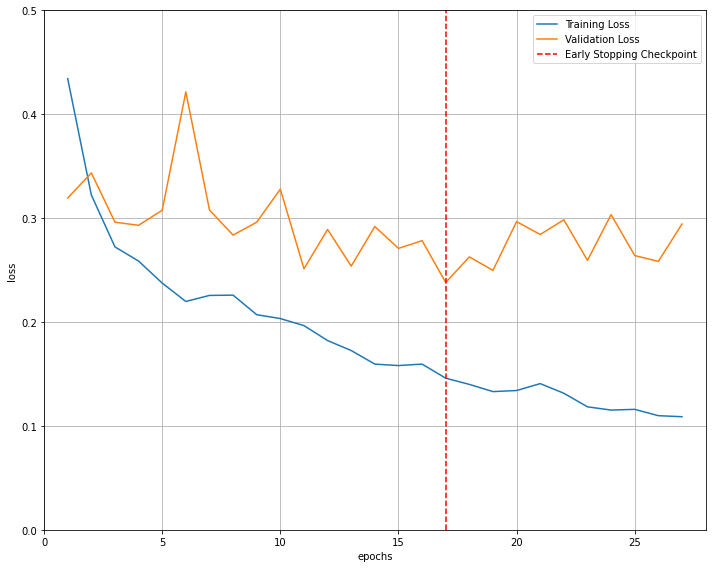

Input Image


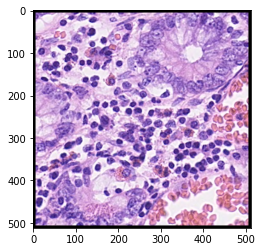

Predicted Mask Sigmoid


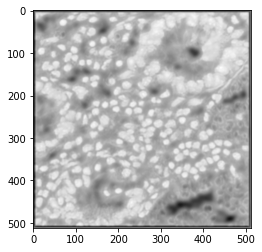

Predicted Mask Binary


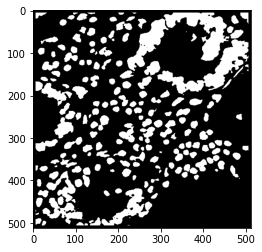

Actual Mask


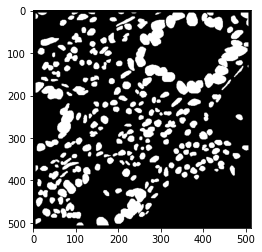

iou score: 0.715856567262731
AJI score: 0.715856567262731
AJI+ score: 0.715856567262731
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.7158558514068796
Panoptic Quality (PQ): 0.7158558514068796
Dice2 score: 0.8344014073445796 

Batch size: 8, Learning rate: 0.0001 , Epochs: 60








  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.384932).  Saving model ...







  2%|▏         | 1/60 [00:20<20:13, 20.57s/it]

Train Epoch: 1 @ 06:27:39.945272 - Train Loss: 0.5541 - Valid Loss: 0.3849
Validation loss decreased (0.384932 --> 0.300371).  Saving model ...







  3%|▎         | 2/60 [00:41<19:59, 20.68s/it]

Train Epoch: 2 @ 06:28:00.883117 - Train Loss: 0.3585 - Valid Loss: 0.3004
Validation loss decreased (0.300371 --> 0.278957).  Saving model ...







  5%|▌         | 3/60 [01:02<19:40, 20.71s/it]

Train Epoch: 3 @ 06:28:21.672285 - Train Loss: 0.3082 - Valid Loss: 0.2790
Validation loss decreased (0.278957 --> 0.274496).  Saving model ...







  7%|▋         | 4/60 [01:22<19:18, 20.69s/it]

Train Epoch: 4 @ 06:28:42.311890 - Train Loss: 0.2731 - Valid Loss: 0.2745
Validation loss decreased (0.274496 --> 0.269457).  Saving model ...







  8%|▊         | 5/60 [01:43<19:02, 20.77s/it]

Train Epoch: 5 @ 06:29:03.249361 - Train Loss: 0.2476 - Valid Loss: 0.2695
Validation loss decreased (0.269457 --> 0.265538).  Saving model ...







 10%|█         | 6/60 [02:04<18:43, 20.81s/it]

Train Epoch: 6 @ 06:29:24.146347 - Train Loss: 0.2313 - Valid Loss: 0.2655
Validation loss decreased (0.265538 --> 0.258423).  Saving model ...







 12%|█▏        | 7/60 [02:25<18:19, 20.75s/it]

Train Epoch: 7 @ 06:29:44.760068 - Train Loss: 0.2355 - Valid Loss: 0.2584







 13%|█▎        | 8/60 [02:45<17:53, 20.65s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 06:30:05.189828 - Train Loss: 0.2133 - Valid Loss: 0.2642
Validation loss decreased (0.258423 --> 0.233667).  Saving model ...







 15%|█▌        | 9/60 [03:06<17:37, 20.73s/it]

Train Epoch: 9 @ 06:30:26.100117 - Train Loss: 0.2005 - Valid Loss: 0.2337







 17%|█▋        | 10/60 [03:26<17:09, 20.59s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 10 @ 06:30:46.369741 - Train Loss: 0.2037 - Valid Loss: 0.2502







 18%|█▊        | 11/60 [03:47<16:44, 20.50s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 11 @ 06:31:06.670810 - Train Loss: 0.1881 - Valid Loss: 0.2402







 20%|██        | 12/60 [04:07<16:24, 20.51s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 12 @ 06:31:27.178609 - Train Loss: 0.1808 - Valid Loss: 0.2456







 22%|██▏       | 13/60 [04:28<15:59, 20.42s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 13 @ 06:31:47.396911 - Train Loss: 0.1739 - Valid Loss: 0.2597







 23%|██▎       | 14/60 [04:48<15:36, 20.36s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 14 @ 06:32:07.619582 - Train Loss: 0.1710 - Valid Loss: 0.2357







 25%|██▌       | 15/60 [05:08<15:18, 20.41s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 15 @ 06:32:28.130891 - Train Loss: 0.1617 - Valid Loss: 0.2435







 27%|██▋       | 16/60 [05:29<14:58, 20.41s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 16 @ 06:32:48.555037 - Train Loss: 0.1556 - Valid Loss: 0.2428







 28%|██▊       | 17/60 [05:49<14:38, 20.43s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 17 @ 06:33:09.018408 - Train Loss: 0.1540 - Valid Loss: 0.2345
Validation loss decreased (0.233667 --> 0.232815).  Saving model ...







 30%|███       | 18/60 [06:10<14:20, 20.49s/it]

Train Epoch: 18 @ 06:33:29.667281 - Train Loss: 0.1470 - Valid Loss: 0.2328







 32%|███▏      | 19/60 [06:30<13:59, 20.47s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 19 @ 06:33:50.081737 - Train Loss: 0.1461 - Valid Loss: 0.2365







 33%|███▎      | 20/60 [06:51<13:39, 20.48s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 20 @ 06:34:10.585841 - Train Loss: 0.1381 - Valid Loss: 0.2521







 35%|███▌      | 21/60 [07:11<13:15, 20.41s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 21 @ 06:34:30.820495 - Train Loss: 0.1346 - Valid Loss: 0.2433







 37%|███▋      | 22/60 [07:31<12:52, 20.34s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 22 @ 06:34:51.011703 - Train Loss: 0.1303 - Valid Loss: 0.2476
Validation loss decreased (0.232815 --> 0.232612).  Saving model ...







 38%|███▊      | 23/60 [07:52<12:38, 20.51s/it]

Train Epoch: 23 @ 06:35:11.908464 - Train Loss: 0.1302 - Valid Loss: 0.2326







 40%|████      | 24/60 [08:12<12:17, 20.48s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 24 @ 06:35:32.310508 - Train Loss: 0.1254 - Valid Loss: 0.2514







 42%|████▏     | 25/60 [08:33<11:53, 20.40s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 25 @ 06:35:52.530704 - Train Loss: 0.1231 - Valid Loss: 0.2582







 43%|████▎     | 26/60 [08:53<11:33, 20.40s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 26 @ 06:36:12.938652 - Train Loss: 0.1255 - Valid Loss: 0.2526







 45%|████▌     | 27/60 [09:13<11:12, 20.39s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 27 @ 06:36:33.297481 - Train Loss: 0.1164 - Valid Loss: 0.2369







 47%|████▋     | 28/60 [09:34<10:51, 20.35s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 28 @ 06:36:53.560482 - Train Loss: 0.1155 - Valid Loss: 0.2389







 48%|████▊     | 29/60 [09:54<10:31, 20.37s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 29 @ 06:37:13.987256 - Train Loss: 0.1154 - Valid Loss: 0.2361







 50%|█████     | 30/60 [10:15<10:12, 20.43s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 30 @ 06:37:34.536719 - Train Loss: 0.1125 - Valid Loss: 0.2504







 52%|█████▏    | 31/60 [10:35<09:52, 20.43s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 31 @ 06:37:54.987760 - Train Loss: 0.1120 - Valid Loss: 0.2465







 53%|█████▎    | 32/60 [10:55<09:31, 20.40s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 32 @ 06:38:15.311419 - Train Loss: 0.1056 - Valid Loss: 0.2385
EarlyStopping counter: 10 out of 10
Early stopping


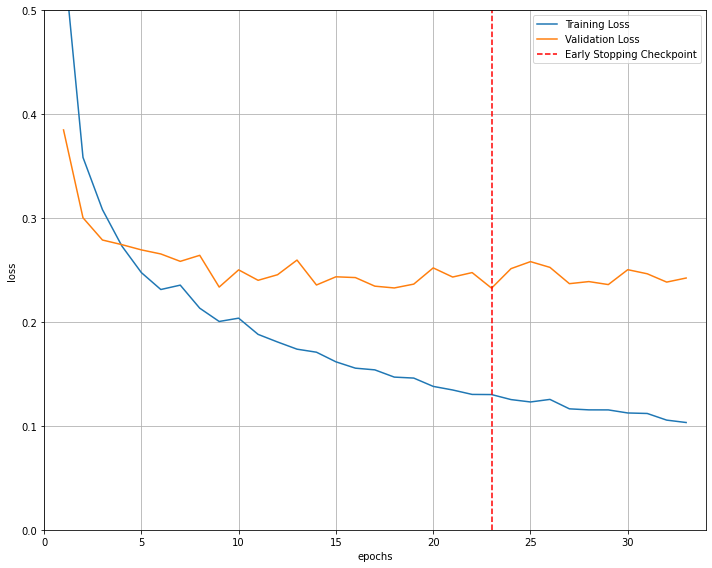

Input Image


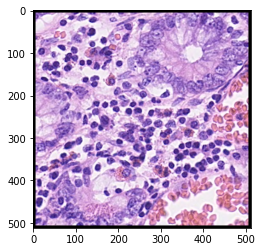

Predicted Mask Sigmoid


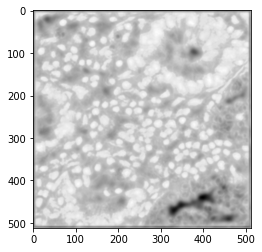

Predicted Mask Binary


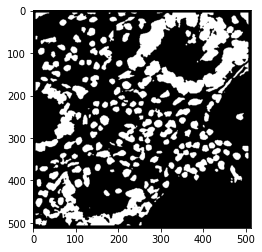

Actual Mask


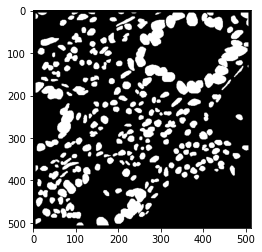

iou score: 0.681216848282694
AJI score: 0.681216848282694
AJI+ score: 0.681216848282694
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.681216167066527
Panoptic Quality (PQ): 0.681216167066527
Dice2 score: 0.810385464526523 

Batch size: 8, Learning rate: 1e-05 , Epochs: 60









  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.656740).  Saving model ...








  2%|▏         | 1/60 [00:20<20:35, 20.93s/it]

Train Epoch: 1 @ 06:38:58.562500 - Train Loss: 0.7292 - Valid Loss: 0.6567
Validation loss decreased (0.656740 --> 0.380302).  Saving model ...








  3%|▎         | 2/60 [00:41<20:15, 20.96s/it]

Train Epoch: 2 @ 06:39:19.590294 - Train Loss: 0.5810 - Valid Loss: 0.3803
Validation loss decreased (0.380302 --> 0.315612).  Saving model ...








  5%|▌         | 3/60 [01:02<19:55, 20.97s/it]

Train Epoch: 3 @ 06:39:40.568413 - Train Loss: 0.4335 - Valid Loss: 0.3156
Validation loss decreased (0.315612 --> 0.299727).  Saving model ...








  7%|▋         | 4/60 [01:23<19:35, 20.99s/it]

Train Epoch: 4 @ 06:40:01.602255 - Train Loss: 0.4003 - Valid Loss: 0.2997








  8%|▊         | 5/60 [01:44<19:08, 20.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 06:40:22.267501 - Train Loss: 0.3749 - Valid Loss: 0.3253








 10%|█         | 6/60 [02:04<18:39, 20.72s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 6 @ 06:40:42.605879 - Train Loss: 0.3598 - Valid Loss: 0.3133
Validation loss decreased (0.299727 --> 0.293263).  Saving model ...








 12%|█▏        | 7/60 [02:25<18:21, 20.78s/it]

Train Epoch: 7 @ 06:41:03.523217 - Train Loss: 0.3477 - Valid Loss: 0.2933








 13%|█▎        | 8/60 [02:46<17:58, 20.74s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 06:41:24.174263 - Train Loss: 0.3361 - Valid Loss: 0.2960
Validation loss decreased (0.293263 --> 0.287835).  Saving model ...








 15%|█▌        | 9/60 [03:07<17:38, 20.75s/it]

Train Epoch: 9 @ 06:41:44.930185 - Train Loss: 0.3286 - Valid Loss: 0.2878
Validation loss decreased (0.287835 --> 0.283601).  Saving model ...








 17%|█▋        | 10/60 [03:28<17:20, 20.81s/it]

Train Epoch: 10 @ 06:42:05.888022 - Train Loss: 0.3201 - Valid Loss: 0.2836








 18%|█▊        | 11/60 [03:48<16:58, 20.79s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 11 @ 06:42:26.623206 - Train Loss: 0.3143 - Valid Loss: 0.3009








 20%|██        | 12/60 [04:09<16:31, 20.65s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 12 @ 06:42:46.958971 - Train Loss: 0.3059 - Valid Loss: 0.2880
Validation loss decreased (0.283601 --> 0.273378).  Saving model ...








 22%|██▏       | 13/60 [04:30<16:11, 20.67s/it]

Train Epoch: 13 @ 06:43:07.683130 - Train Loss: 0.3002 - Valid Loss: 0.2734
Validation loss decreased (0.273378 --> 0.271233).  Saving model ...








 23%|██▎       | 14/60 [04:53<16:30, 21.53s/it]

Train Epoch: 14 @ 06:43:31.203223 - Train Loss: 0.2947 - Valid Loss: 0.2712








 25%|██▌       | 15/60 [05:14<15:56, 21.26s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 15 @ 06:43:51.831487 - Train Loss: 0.2898 - Valid Loss: 0.2856
Validation loss decreased (0.271233 --> 0.270014).  Saving model ...








 27%|██▋       | 16/60 [05:35<15:31, 21.16s/it]

Train Epoch: 16 @ 06:44:12.771730 - Train Loss: 0.2856 - Valid Loss: 0.2700
Validation loss decreased (0.270014 --> 0.267939).  Saving model ...








 28%|██▊       | 17/60 [05:55<15:05, 21.05s/it]

Train Epoch: 17 @ 06:44:33.549123 - Train Loss: 0.2794 - Valid Loss: 0.2679








 30%|███       | 18/60 [06:16<14:37, 20.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 18 @ 06:44:54.068350 - Train Loss: 0.2766 - Valid Loss: 0.2713








 32%|███▏      | 19/60 [06:37<14:13, 20.81s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 19 @ 06:45:14.711340 - Train Loss: 0.2720 - Valid Loss: 0.2706
Validation loss decreased (0.267939 --> 0.259994).  Saving model ...








 33%|███▎      | 20/60 [06:57<13:51, 20.78s/it]

Train Epoch: 20 @ 06:45:35.408489 - Train Loss: 0.2701 - Valid Loss: 0.2600








 35%|███▌      | 21/60 [07:18<13:26, 20.68s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 21 @ 06:45:55.871170 - Train Loss: 0.2648 - Valid Loss: 0.2612








 37%|███▋      | 22/60 [07:38<13:06, 20.69s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 22 @ 06:46:16.588672 - Train Loss: 0.2622 - Valid Loss: 0.2604
Validation loss decreased (0.259994 --> 0.257321).  Saving model ...








 38%|███▊      | 23/60 [08:00<12:52, 20.89s/it]

Train Epoch: 23 @ 06:46:37.920934 - Train Loss: 0.2589 - Valid Loss: 0.2573








 40%|████      | 24/60 [08:21<12:31, 20.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 24 @ 06:46:58.813463 - Train Loss: 0.2554 - Valid Loss: 0.2637
Validation loss decreased (0.257321 --> 0.256645).  Saving model ...








 42%|████▏     | 25/60 [08:42<12:14, 20.98s/it]

Train Epoch: 25 @ 06:47:20.007121 - Train Loss: 0.2535 - Valid Loss: 0.2566








 43%|████▎     | 26/60 [09:02<11:49, 20.86s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 26 @ 06:47:40.602454 - Train Loss: 0.2509 - Valid Loss: 0.2612








 45%|████▌     | 27/60 [09:23<11:23, 20.72s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 27 @ 06:48:00.996216 - Train Loss: 0.2473 - Valid Loss: 0.2709








 47%|████▋     | 28/60 [09:44<11:02, 20.71s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 28 @ 06:48:21.671404 - Train Loss: 0.2458 - Valid Loss: 0.2586








 48%|████▊     | 29/60 [10:04<10:40, 20.67s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 29 @ 06:48:42.249867 - Train Loss: 0.2434 - Valid Loss: 0.2683








 50%|█████     | 30/60 [10:25<10:20, 20.67s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 30 @ 06:49:02.921563 - Train Loss: 0.2420 - Valid Loss: 0.2626








 52%|█████▏    | 31/60 [10:45<09:56, 20.58s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 31 @ 06:49:23.287271 - Train Loss: 0.2398 - Valid Loss: 0.2572








 53%|█████▎    | 32/60 [11:05<09:34, 20.50s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 32 @ 06:49:43.613281 - Train Loss: 0.2365 - Valid Loss: 0.2579
Validation loss decreased (0.256645 --> 0.254139).  Saving model ...








 55%|█████▌    | 33/60 [11:27<09:18, 20.70s/it]

Train Epoch: 33 @ 06:50:04.775234 - Train Loss: 0.2349 - Valid Loss: 0.2541








 57%|█████▋    | 34/60 [11:47<08:57, 20.66s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 34 @ 06:50:25.338213 - Train Loss: 0.2336 - Valid Loss: 0.2566








 58%|█████▊    | 35/60 [12:08<08:34, 20.59s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 35 @ 06:50:45.757047 - Train Loss: 0.2308 - Valid Loss: 0.2556








 60%|██████    | 36/60 [12:28<08:14, 20.60s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 36 @ 06:51:06.385138 - Train Loss: 0.2300 - Valid Loss: 0.2558
Validation loss decreased (0.254139 --> 0.252723).  Saving model ...








 62%|██████▏   | 37/60 [12:49<07:56, 20.71s/it]

Train Epoch: 37 @ 06:51:27.346866 - Train Loss: 0.2284 - Valid Loss: 0.2527
Validation loss decreased (0.252723 --> 0.248998).  Saving model ...








 63%|██████▎   | 38/60 [13:10<07:36, 20.76s/it]

Train Epoch: 38 @ 06:51:48.237442 - Train Loss: 0.2258 - Valid Loss: 0.2490








 65%|██████▌   | 39/60 [13:31<07:15, 20.72s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 39 @ 06:52:08.845504 - Train Loss: 0.2250 - Valid Loss: 0.2576








 67%|██████▋   | 40/60 [13:51<06:53, 20.67s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 40 @ 06:52:29.420581 - Train Loss: 0.2212 - Valid Loss: 0.2530
Validation loss decreased (0.248998 --> 0.246477).  Saving model ...








 68%|██████▊   | 41/60 [14:12<06:33, 20.71s/it]

Train Epoch: 41 @ 06:52:50.209274 - Train Loss: 0.2218 - Valid Loss: 0.2465
Validation loss decreased (0.246477 --> 0.245519).  Saving model ...








 70%|███████   | 42/60 [14:33<06:14, 20.80s/it]

Train Epoch: 42 @ 06:53:11.231122 - Train Loss: 0.2201 - Valid Loss: 0.2455








 72%|███████▏  | 43/60 [14:54<05:52, 20.76s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 43 @ 06:53:31.888946 - Train Loss: 0.2185 - Valid Loss: 0.2577








 73%|███████▎  | 44/60 [15:14<05:30, 20.64s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 44 @ 06:53:52.262926 - Train Loss: 0.2156 - Valid Loss: 0.2490








 75%|███████▌  | 45/60 [15:35<05:09, 20.60s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 45 @ 06:54:12.776825 - Train Loss: 0.2153 - Valid Loss: 0.2488








 77%|███████▋  | 46/60 [15:55<04:49, 20.65s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 46 @ 06:54:33.526835 - Train Loss: 0.2139 - Valid Loss: 0.2520








 78%|███████▊  | 47/60 [16:16<04:28, 20.65s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 47 @ 06:54:54.168098 - Train Loss: 0.2142 - Valid Loss: 0.2457
Validation loss decreased (0.245519 --> 0.242603).  Saving model ...








 80%|████████  | 48/60 [16:37<04:09, 20.77s/it]

Train Epoch: 48 @ 06:55:15.220222 - Train Loss: 0.2112 - Valid Loss: 0.2426








 82%|████████▏ | 49/60 [16:58<03:47, 20.68s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 49 @ 06:55:35.678615 - Train Loss: 0.2093 - Valid Loss: 0.2493
Validation loss decreased (0.242603 --> 0.241543).  Saving model ...








 83%|████████▎ | 50/60 [17:19<03:27, 20.78s/it]

Train Epoch: 50 @ 06:55:56.690780 - Train Loss: 0.2083 - Valid Loss: 0.2415
Validation loss decreased (0.241543 --> 0.241494).  Saving model ...








 85%|████████▌ | 51/60 [17:40<03:08, 20.90s/it]

Train Epoch: 51 @ 06:56:17.876117 - Train Loss: 0.2079 - Valid Loss: 0.2415








 87%|████████▋ | 52/60 [18:00<02:46, 20.78s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 52 @ 06:56:38.377576 - Train Loss: 0.2056 - Valid Loss: 0.2468








 88%|████████▊ | 53/60 [18:21<02:24, 20.69s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 53 @ 06:56:58.868172 - Train Loss: 0.2044 - Valid Loss: 0.2587








 90%|█████████ | 54/60 [18:41<02:04, 20.68s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 54 @ 06:57:19.514746 - Train Loss: 0.2043 - Valid Loss: 0.2422








 92%|█████████▏| 55/60 [19:02<01:43, 20.61s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 55 @ 06:57:39.964743 - Train Loss: 0.2022 - Valid Loss: 0.2495








 93%|█████████▎| 56/60 [19:22<01:22, 20.57s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 56 @ 06:58:00.456422 - Train Loss: 0.2015 - Valid Loss: 0.2443








 95%|█████████▌| 57/60 [19:43<01:01, 20.63s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 57 @ 06:58:21.199694 - Train Loss: 0.1997 - Valid Loss: 0.2502
Validation loss decreased (0.241494 --> 0.240665).  Saving model ...








 97%|█████████▋| 58/60 [20:04<00:41, 20.72s/it]

Train Epoch: 58 @ 06:58:42.130413 - Train Loss: 0.1992 - Valid Loss: 0.2407








 98%|█████████▊| 59/60 [20:24<00:20, 20.64s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 59 @ 06:59:02.581510 - Train Loss: 0.1978 - Valid Loss: 0.2417








100%|██████████| 60/60 [20:45<00:00, 20.76s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 60 @ 06:59:23.344594 - Train Loss: 0.1964 - Valid Loss: 0.2417


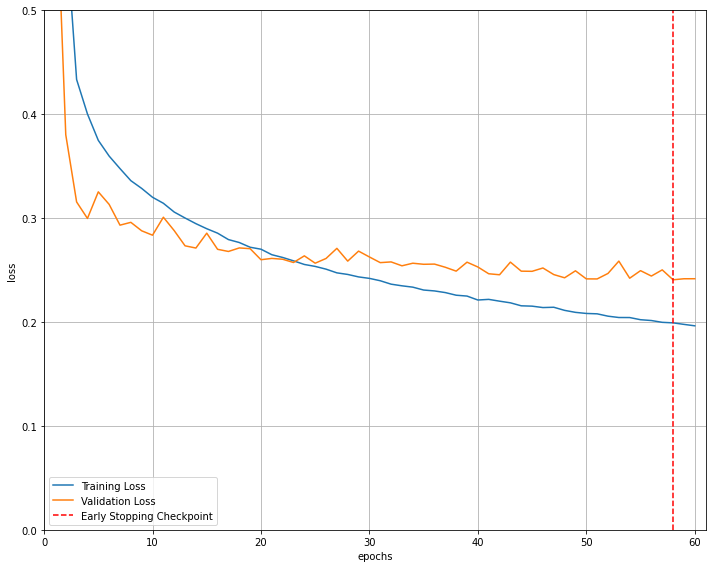

Input Image


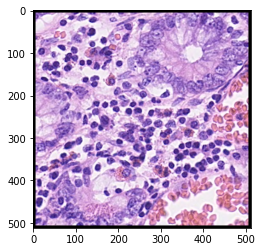

Predicted Mask Sigmoid


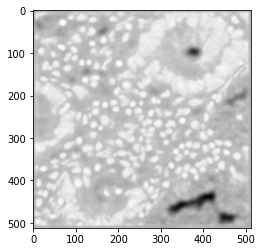

Predicted Mask Binary


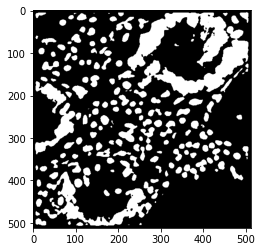

Actual Mask


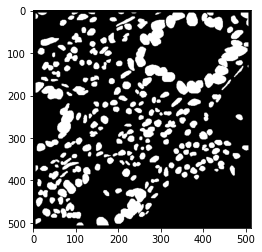

iou score: 0.6637484823311394
AJI score: 0.6637484823311394
AJI+ score: 0.6637484823311394
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6637478185833209
Panoptic Quality (PQ): 0.6637478185833209
Dice2 score: 0.7978952220003073 

Batch size: 16, Learning rate: 0.001 , Epochs: 60









  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.536953).  Saving model ...








  2%|▏         | 1/60 [00:20<20:16, 20.62s/it]

Train Epoch: 1 @ 06:59:46.330473 - Train Loss: 0.4313 - Valid Loss: 0.5370
Validation loss decreased (0.536953 --> 0.280348).  Saving model ...








  3%|▎         | 2/60 [00:41<19:57, 20.65s/it]

Train Epoch: 2 @ 07:00:07.036285 - Train Loss: 0.3261 - Valid Loss: 0.2803








  5%|▌         | 3/60 [01:01<19:26, 20.46s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 3 @ 07:00:27.051100 - Train Loss: 0.2827 - Valid Loss: 0.3313
Validation loss decreased (0.280348 --> 0.265879).  Saving model ...








  7%|▋         | 4/60 [01:21<19:04, 20.43s/it]

Train Epoch: 4 @ 07:00:47.415862 - Train Loss: 0.2546 - Valid Loss: 0.2659








  8%|▊         | 5/60 [01:41<18:41, 20.38s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 07:01:07.695225 - Train Loss: 0.2484 - Valid Loss: 0.3056








 10%|█         | 6/60 [02:01<18:12, 20.23s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 6 @ 07:01:27.563703 - Train Loss: 0.2365 - Valid Loss: 0.2693








 12%|█▏        | 7/60 [02:21<17:46, 20.13s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 7 @ 07:01:47.464230 - Train Loss: 0.2251 - Valid Loss: 0.2917








 13%|█▎        | 8/60 [02:41<17:27, 20.14s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 8 @ 07:02:07.631533 - Train Loss: 0.2213 - Valid Loss: 0.2696
Validation loss decreased (0.265879 --> 0.234184).  Saving model ...








 15%|█▌        | 9/60 [03:02<17:10, 20.21s/it]

Train Epoch: 9 @ 07:02:27.989894 - Train Loss: 0.2106 - Valid Loss: 0.2342








 17%|█▋        | 10/60 [03:22<16:45, 20.11s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 10 @ 07:02:47.865149 - Train Loss: 0.2363 - Valid Loss: 0.2978








 18%|█▊        | 11/60 [03:42<16:23, 20.06s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 11 @ 07:03:07.830520 - Train Loss: 0.2093 - Valid Loss: 0.3094








 20%|██        | 12/60 [04:02<16:01, 20.04s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 12 @ 07:03:27.810293 - Train Loss: 0.2038 - Valid Loss: 0.3820








 22%|██▏       | 13/60 [04:21<15:38, 19.96s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 13 @ 07:03:47.593557 - Train Loss: 0.1921 - Valid Loss: 0.2373








 23%|██▎       | 14/60 [04:41<15:16, 19.93s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 14 @ 07:04:07.451569 - Train Loss: 0.1969 - Valid Loss: 0.2367
Validation loss decreased (0.234184 --> 0.233088).  Saving model ...








 25%|██▌       | 15/60 [05:02<15:04, 20.10s/it]

Train Epoch: 15 @ 07:04:27.962114 - Train Loss: 0.1816 - Valid Loss: 0.2331








 27%|██▋       | 16/60 [05:22<14:42, 20.05s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 16 @ 07:04:47.893464 - Train Loss: 0.1724 - Valid Loss: 0.2453








 28%|██▊       | 17/60 [05:41<14:18, 19.98s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 17 @ 07:05:07.687327 - Train Loss: 0.1770 - Valid Loss: 0.2524








 30%|███       | 18/60 [06:02<14:01, 20.03s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 18 @ 07:05:27.859594 - Train Loss: 0.1618 - Valid Loss: 0.2466








 32%|███▏      | 19/60 [06:22<13:43, 20.08s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 19 @ 07:05:48.041781 - Train Loss: 0.1664 - Valid Loss: 0.2504








 33%|███▎      | 20/60 [06:42<13:25, 20.14s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 20 @ 07:06:08.326083 - Train Loss: 0.1504 - Valid Loss: 0.2416








 35%|███▌      | 21/60 [07:02<13:04, 20.11s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 21 @ 07:06:28.356418 - Train Loss: 0.1466 - Valid Loss: 0.2381








 37%|███▋      | 22/60 [07:22<12:41, 20.04s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 22 @ 07:06:48.247752 - Train Loss: 0.1401 - Valid Loss: 0.2554








 38%|███▊      | 23/60 [07:42<12:23, 20.08s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 23 @ 07:07:08.425632 - Train Loss: 0.1374 - Valid Loss: 0.2459








 40%|████      | 24/60 [08:02<12:01, 20.04s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 24 @ 07:07:28.379250 - Train Loss: 0.1306 - Valid Loss: 0.2399
EarlyStopping counter: 10 out of 10
Early stopping


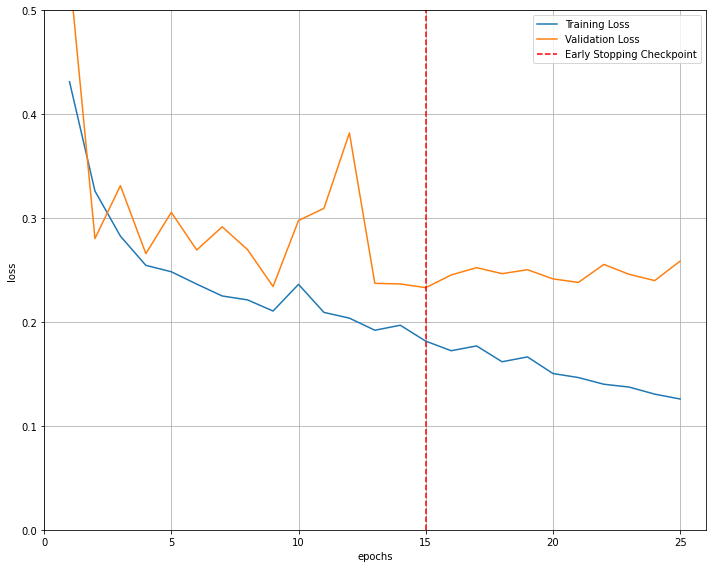

Input Image


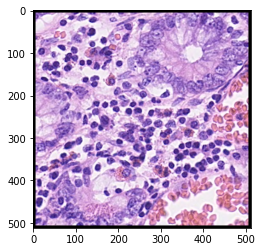

Predicted Mask Sigmoid


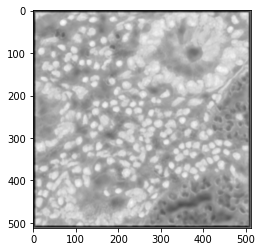

Predicted Mask Binary


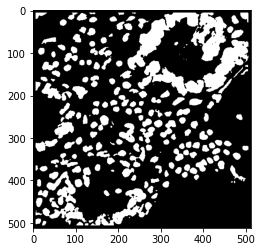

Actual Mask


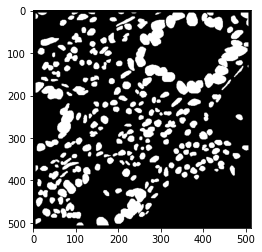

iou score: 0.6940367995173834
AJI score: 0.6940367995173834
AJI+ score: 0.6940367995173834
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6940361054812779
Panoptic Quality (PQ): 0.6940361054812779
Dice2 score: 0.8193881026847923 

Batch size: 16, Learning rate: 0.0001 , Epochs: 60










  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.331833).  Saving model ...









  2%|▏         | 1/60 [00:20<20:37, 20.97s/it]

Train Epoch: 1 @ 07:08:11.420259 - Train Loss: 0.5351 - Valid Loss: 0.3318
Validation loss decreased (0.331833 --> 0.315134).  Saving model ...









  3%|▎         | 2/60 [00:41<20:13, 20.92s/it]

Train Epoch: 2 @ 07:08:32.241663 - Train Loss: 0.3572 - Valid Loss: 0.3151
Validation loss decreased (0.315134 --> 0.281295).  Saving model ...









  5%|▌         | 3/60 [01:02<19:50, 20.88s/it]

Train Epoch: 3 @ 07:08:53.035814 - Train Loss: 0.3116 - Valid Loss: 0.2813
Validation loss decreased (0.281295 --> 0.263646).  Saving model ...









  7%|▋         | 4/60 [01:23<19:31, 20.93s/it]

Train Epoch: 4 @ 07:09:14.062745 - Train Loss: 0.2798 - Valid Loss: 0.2636









  8%|▊         | 5/60 [01:44<19:04, 20.81s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 5 @ 07:09:34.594702 - Train Loss: 0.2500 - Valid Loss: 0.2822
Validation loss decreased (0.263646 --> 0.246896).  Saving model ...









 10%|█         | 6/60 [02:04<18:41, 20.76s/it]

Train Epoch: 6 @ 07:09:55.243397 - Train Loss: 0.2366 - Valid Loss: 0.2469









 12%|█▏        | 7/60 [02:25<18:16, 20.69s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 07:10:15.752780 - Train Loss: 0.2216 - Valid Loss: 0.2498
Validation loss decreased (0.246896 --> 0.241222).  Saving model ...









 13%|█▎        | 8/60 [02:46<18:00, 20.78s/it]

Train Epoch: 8 @ 07:10:36.744175 - Train Loss: 0.2160 - Valid Loss: 0.2412
Validation loss decreased (0.241222 --> 0.237931).  Saving model ...









 15%|█▌        | 9/60 [03:07<17:45, 20.90s/it]

Train Epoch: 9 @ 07:10:57.924085 - Train Loss: 0.2045 - Valid Loss: 0.2379









 17%|█▋        | 10/60 [03:27<17:18, 20.77s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 10 @ 07:11:18.400107 - Train Loss: 0.1981 - Valid Loss: 0.2395
Validation loss decreased (0.237931 --> 0.226165).  Saving model ...









 18%|█▊        | 11/60 [03:48<16:58, 20.79s/it]

Train Epoch: 11 @ 07:11:39.218882 - Train Loss: 0.1916 - Valid Loss: 0.2262
Validation loss decreased (0.226165 --> 0.225711).  Saving model ...









 20%|██        | 12/60 [04:09<16:42, 20.88s/it]

Train Epoch: 12 @ 07:12:00.310759 - Train Loss: 0.1801 - Valid Loss: 0.2257









 22%|██▏       | 13/60 [04:30<16:17, 20.79s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 13 @ 07:12:20.910030 - Train Loss: 0.1751 - Valid Loss: 0.2350









 23%|██▎       | 14/60 [04:50<15:49, 20.65s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 14 @ 07:12:41.213747 - Train Loss: 0.1690 - Valid Loss: 0.2612









 25%|██▌       | 15/60 [05:11<15:26, 20.59s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 15 @ 07:13:01.667641 - Train Loss: 0.1702 - Valid Loss: 0.2367
Validation loss decreased (0.225711 --> 0.222858).  Saving model ...









 27%|██▋       | 16/60 [05:32<15:11, 20.71s/it]

Train Epoch: 16 @ 07:13:22.656498 - Train Loss: 0.1640 - Valid Loss: 0.2229









 28%|██▊       | 17/60 [05:52<14:46, 20.62s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 17 @ 07:13:43.059715 - Train Loss: 0.1515 - Valid Loss: 0.2424









 30%|███       | 18/60 [06:13<14:23, 20.57s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 18 @ 07:14:03.514794 - Train Loss: 0.1500 - Valid Loss: 0.2232









 32%|███▏      | 19/60 [06:33<14:03, 20.58s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 19 @ 07:14:24.134808 - Train Loss: 0.1450 - Valid Loss: 0.2306









 33%|███▎      | 20/60 [06:54<13:40, 20.51s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 20 @ 07:14:44.472741 - Train Loss: 0.1404 - Valid Loss: 0.2292









 35%|███▌      | 21/60 [07:14<13:17, 20.45s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 21 @ 07:15:04.776723 - Train Loss: 0.1342 - Valid Loss: 0.2301









 37%|███▋      | 22/60 [07:34<12:58, 20.49s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 22 @ 07:15:25.367016 - Train Loss: 0.1326 - Valid Loss: 0.2357









 38%|███▊      | 23/60 [07:55<12:39, 20.52s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 23 @ 07:15:45.950770 - Train Loss: 0.1278 - Valid Loss: 0.2379









 40%|████      | 24/60 [08:16<12:20, 20.56s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 24 @ 07:16:06.620907 - Train Loss: 0.1279 - Valid Loss: 0.2235









 42%|████▏     | 25/60 [08:36<11:57, 20.50s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 25 @ 07:16:26.975267 - Train Loss: 0.1219 - Valid Loss: 0.2505
EarlyStopping counter: 10 out of 10
Early stopping


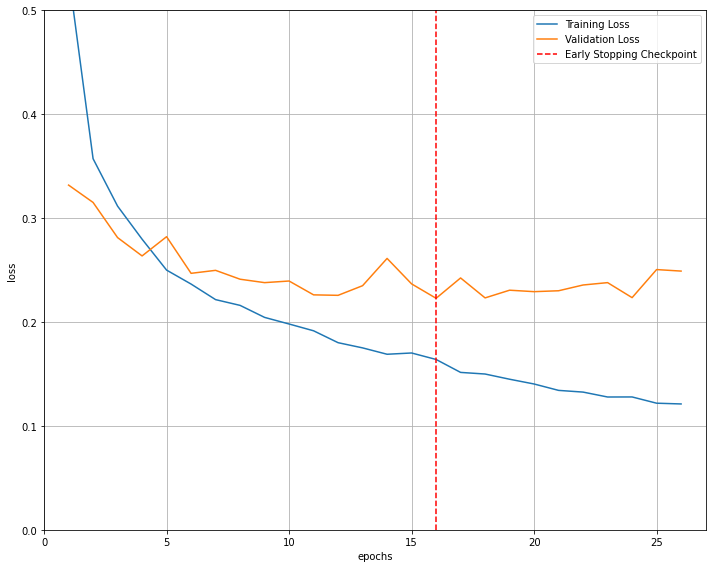

Input Image


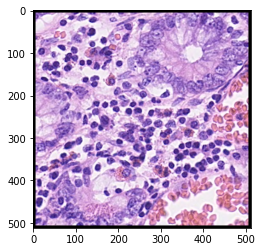

Predicted Mask Sigmoid


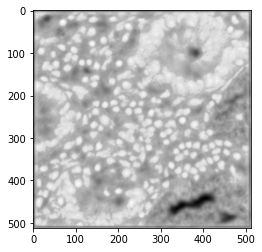

Predicted Mask Binary


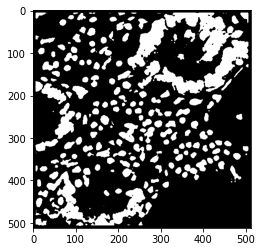

Actual Mask


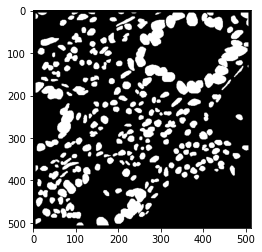

iou score: 0.6793934822752217
AJI score: 0.6793934822752217
AJI+ score: 0.6793934822752217
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6793928028824189
Panoptic Quality (PQ): 0.6793928028824189
Dice2 score: 0.8090938656672501 

Batch size: 16, Learning rate: 1e-05 , Epochs: 60











  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.662388).  Saving model ...










  2%|▏         | 1/60 [00:21<20:39, 21.01s/it]

Train Epoch: 1 @ 07:17:10.769294 - Train Loss: 0.7260 - Valid Loss: 0.6624
Validation loss decreased (0.662388 --> 0.460182).  Saving model ...










  3%|▎         | 2/60 [00:41<20:17, 20.98s/it]

Train Epoch: 2 @ 07:17:31.698154 - Train Loss: 0.5861 - Valid Loss: 0.4602
Validation loss decreased (0.460182 --> 0.374823).  Saving model ...










  5%|▌         | 3/60 [01:02<19:57, 21.00s/it]

Train Epoch: 3 @ 07:17:52.750147 - Train Loss: 0.4399 - Valid Loss: 0.3748
Validation loss decreased (0.374823 --> 0.356753).  Saving model ...










  7%|▋         | 4/60 [01:24<19:38, 21.05s/it]

Train Epoch: 4 @ 07:18:13.909557 - Train Loss: 0.4006 - Valid Loss: 0.3568
Validation loss decreased (0.356753 --> 0.329453).  Saving model ...










  8%|▊         | 5/60 [01:44<19:14, 20.99s/it]

Train Epoch: 5 @ 07:18:34.742938 - Train Loss: 0.3751 - Valid Loss: 0.3295
Validation loss decreased (0.329453 --> 0.326538).  Saving model ...










 10%|█         | 6/60 [02:05<18:51, 20.96s/it]

Train Epoch: 6 @ 07:18:55.640213 - Train Loss: 0.3565 - Valid Loss: 0.3265
Validation loss decreased (0.326538 --> 0.326300).  Saving model ...










 12%|█▏        | 7/60 [02:27<18:34, 21.02s/it]

Train Epoch: 7 @ 07:19:16.803061 - Train Loss: 0.3432 - Valid Loss: 0.3263
Validation loss decreased (0.326300 --> 0.312074).  Saving model ...










 13%|█▎        | 8/60 [02:47<18:10, 20.98s/it]

Train Epoch: 8 @ 07:19:37.689135 - Train Loss: 0.3323 - Valid Loss: 0.3121
Validation loss decreased (0.312074 --> 0.306150).  Saving model ...










 15%|█▌        | 9/60 [03:08<17:48, 20.94s/it]

Train Epoch: 9 @ 07:19:58.550216 - Train Loss: 0.3225 - Valid Loss: 0.3061
Validation loss decreased (0.306150 --> 0.300250).  Saving model ...










 17%|█▋        | 10/60 [03:30<17:31, 21.04s/it]

Train Epoch: 10 @ 07:20:19.798090 - Train Loss: 0.3123 - Valid Loss: 0.3003










 18%|█▊        | 11/60 [03:50<17:03, 20.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 11 @ 07:20:40.357500 - Train Loss: 0.3067 - Valid Loss: 0.3077










 20%|██        | 12/60 [04:10<16:35, 20.74s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 12 @ 07:21:00.753014 - Train Loss: 0.2996 - Valid Loss: 0.3011
Validation loss decreased (0.300250 --> 0.295368).  Saving model ...










 22%|██▏       | 13/60 [04:32<16:19, 20.85s/it]

Train Epoch: 13 @ 07:21:21.835806 - Train Loss: 0.2965 - Valid Loss: 0.2954










 23%|██▎       | 14/60 [04:52<15:55, 20.78s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 14 @ 07:21:42.470124 - Train Loss: 0.2914 - Valid Loss: 0.2974
Validation loss decreased (0.295368 --> 0.293894).  Saving model ...










 25%|██▌       | 15/60 [05:13<15:39, 20.88s/it]

Train Epoch: 15 @ 07:22:03.575137 - Train Loss: 0.2846 - Valid Loss: 0.2939










 27%|██▋       | 16/60 [05:34<15:13, 20.77s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 16 @ 07:22:24.075588 - Train Loss: 0.2822 - Valid Loss: 0.2975
Validation loss decreased (0.293894 --> 0.289129).  Saving model ...










 28%|██▊       | 17/60 [05:55<14:53, 20.78s/it]

Train Epoch: 17 @ 07:22:44.876723 - Train Loss: 0.2750 - Valid Loss: 0.2891
Validation loss decreased (0.289129 --> 0.287888).  Saving model ...










 30%|███       | 18/60 [06:16<14:38, 20.92s/it]

Train Epoch: 18 @ 07:23:06.119594 - Train Loss: 0.2722 - Valid Loss: 0.2879
Validation loss decreased (0.287888 --> 0.287831).  Saving model ...










 32%|███▏      | 19/60 [06:37<14:17, 20.92s/it]

Train Epoch: 19 @ 07:23:27.045312 - Train Loss: 0.2689 - Valid Loss: 0.2878
Validation loss decreased (0.287831 --> 0.284315).  Saving model ...










 33%|███▎      | 20/60 [06:58<13:56, 20.90s/it]

Train Epoch: 20 @ 07:23:47.905356 - Train Loss: 0.2640 - Valid Loss: 0.2843










 35%|███▌      | 21/60 [07:18<13:32, 20.84s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 21 @ 07:24:08.617039 - Train Loss: 0.2606 - Valid Loss: 0.2857
Validation loss decreased (0.284315 --> 0.280321).  Saving model ...










 37%|███▋      | 22/60 [07:39<13:12, 20.87s/it]

Train Epoch: 22 @ 07:24:29.534137 - Train Loss: 0.2575 - Valid Loss: 0.2803
Validation loss decreased (0.280321 --> 0.280240).  Saving model ...










 38%|███▊      | 23/60 [08:00<12:52, 20.87s/it]

Train Epoch: 23 @ 07:24:50.406301 - Train Loss: 0.2567 - Valid Loss: 0.2802










 40%|████      | 24/60 [08:21<12:28, 20.80s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 24 @ 07:25:11.056815 - Train Loss: 0.2526 - Valid Loss: 0.2810










 42%|████▏     | 25/60 [08:41<12:05, 20.73s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 25 @ 07:25:31.619878 - Train Loss: 0.2489 - Valid Loss: 0.2843










 43%|████▎     | 26/60 [09:02<11:41, 20.62s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 26 @ 07:25:51.987491 - Train Loss: 0.2465 - Valid Loss: 0.2865
Validation loss decreased (0.280240 --> 0.275865).  Saving model ...










 45%|████▌     | 27/60 [09:23<11:23, 20.73s/it]

Train Epoch: 27 @ 07:26:12.954939 - Train Loss: 0.2443 - Valid Loss: 0.2759










 47%|████▋     | 28/60 [09:43<11:03, 20.72s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 28 @ 07:26:33.672326 - Train Loss: 0.2416 - Valid Loss: 0.2776










 48%|████▊     | 29/60 [10:04<10:41, 20.69s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 29 @ 07:26:54.301013 - Train Loss: 0.2400 - Valid Loss: 0.2817










 50%|█████     | 30/60 [10:25<10:18, 20.62s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 30 @ 07:27:14.762272 - Train Loss: 0.2381 - Valid Loss: 0.2767
Validation loss decreased (0.275865 --> 0.272328).  Saving model ...










 52%|█████▏    | 31/60 [10:45<09:59, 20.67s/it]

Train Epoch: 31 @ 07:27:35.531467 - Train Loss: 0.2355 - Valid Loss: 0.2723










 53%|█████▎    | 32/60 [11:06<09:38, 20.67s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 32 @ 07:27:56.217521 - Train Loss: 0.2327 - Valid Loss: 0.2738










 55%|█████▌    | 33/60 [11:26<09:17, 20.63s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 33 @ 07:28:16.747476 - Train Loss: 0.2314 - Valid Loss: 0.2731










 57%|█████▋    | 34/60 [11:47<08:54, 20.55s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 34 @ 07:28:37.123626 - Train Loss: 0.2302 - Valid Loss: 0.2734
Validation loss decreased (0.272328 --> 0.271099).  Saving model ...










 58%|█████▊    | 35/60 [12:08<08:36, 20.66s/it]

Train Epoch: 35 @ 07:28:58.023315 - Train Loss: 0.2275 - Valid Loss: 0.2711
Validation loss decreased (0.271099 --> 0.271047).  Saving model ...










 60%|██████    | 36/60 [12:29<08:18, 20.79s/it]

Train Epoch: 36 @ 07:29:19.123128 - Train Loss: 0.2261 - Valid Loss: 0.2710










 62%|██████▏   | 37/60 [12:49<07:55, 20.69s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 37 @ 07:29:39.586938 - Train Loss: 0.2242 - Valid Loss: 0.2719










 63%|██████▎   | 38/60 [13:10<07:33, 20.62s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 38 @ 07:30:00.038968 - Train Loss: 0.2225 - Valid Loss: 0.2783










 65%|██████▌   | 39/60 [13:30<07:13, 20.62s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 39 @ 07:30:20.661870 - Train Loss: 0.2214 - Valid Loss: 0.2736










 67%|██████▋   | 40/60 [13:51<06:50, 20.54s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 40 @ 07:30:41.000077 - Train Loss: 0.2204 - Valid Loss: 0.2718










 68%|██████▊   | 41/60 [14:11<06:29, 20.50s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 41 @ 07:31:01.408075 - Train Loss: 0.2182 - Valid Loss: 0.2729










 70%|███████   | 42/60 [14:32<06:09, 20.54s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 42 @ 07:31:22.062671 - Train Loss: 0.2164 - Valid Loss: 0.2752










 72%|███████▏  | 43/60 [14:52<05:48, 20.53s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 43 @ 07:31:42.544133 - Train Loss: 0.2150 - Valid Loss: 0.2853










 73%|███████▎  | 44/60 [15:13<05:27, 20.47s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 44 @ 07:32:02.889278 - Train Loss: 0.2139 - Valid Loss: 0.2760










 75%|███████▌  | 45/60 [15:33<05:07, 20.51s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 45 @ 07:32:23.500368 - Train Loss: 0.2124 - Valid Loss: 0.2736
Validation loss decreased (0.271047 --> 0.268006).  Saving model ...










 77%|███████▋  | 46/60 [15:54<04:48, 20.64s/it]

Train Epoch: 46 @ 07:32:44.429369 - Train Loss: 0.2108 - Valid Loss: 0.2680










 78%|███████▊  | 47/60 [16:15<04:28, 20.67s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 47 @ 07:33:05.171291 - Train Loss: 0.2093 - Valid Loss: 0.2736
Validation loss decreased (0.268006 --> 0.267352).  Saving model ...










 80%|████████  | 48/60 [16:36<04:08, 20.71s/it]

Train Epoch: 48 @ 07:33:25.974247 - Train Loss: 0.2081 - Valid Loss: 0.2674
Validation loss decreased (0.267352 --> 0.263575).  Saving model ...










 82%|████████▏ | 49/60 [16:57<03:48, 20.77s/it]

Train Epoch: 49 @ 07:33:46.885170 - Train Loss: 0.2060 - Valid Loss: 0.2636










 83%|████████▎ | 50/60 [17:17<03:27, 20.77s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 50 @ 07:34:07.665028 - Train Loss: 0.2059 - Valid Loss: 0.2651










 85%|████████▌ | 51/60 [17:38<03:06, 20.67s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 51 @ 07:34:28.108908 - Train Loss: 0.2044 - Valid Loss: 0.2677
Validation loss decreased (0.263575 --> 0.262267).  Saving model ...










 87%|████████▋ | 52/60 [17:59<02:45, 20.71s/it]

Train Epoch: 52 @ 07:34:48.916557 - Train Loss: 0.2037 - Valid Loss: 0.2623










 88%|████████▊ | 53/60 [18:19<02:24, 20.71s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 53 @ 07:35:09.615359 - Train Loss: 0.2026 - Valid Loss: 0.2667










 90%|█████████ | 54/60 [18:40<02:03, 20.64s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 54 @ 07:35:30.107092 - Train Loss: 0.2000 - Valid Loss: 0.2721










 92%|█████████▏| 55/60 [19:00<01:42, 20.56s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 55 @ 07:35:50.465040 - Train Loss: 0.2006 - Valid Loss: 0.2660










 93%|█████████▎| 56/60 [19:21<01:22, 20.54s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 56 @ 07:36:10.967462 - Train Loss: 0.1988 - Valid Loss: 0.2638










 95%|█████████▌| 57/60 [19:41<01:01, 20.54s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 57 @ 07:36:31.508397 - Train Loss: 0.1968 - Valid Loss: 0.2715










 97%|█████████▋| 58/60 [20:02<00:41, 20.50s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 58 @ 07:36:51.914374 - Train Loss: 0.1970 - Valid Loss: 0.2656










 98%|█████████▊| 59/60 [20:22<00:20, 20.49s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 59 @ 07:37:12.385359 - Train Loss: 0.1943 - Valid Loss: 0.2716










100%|██████████| 60/60 [20:43<00:00, 20.72s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 60 @ 07:37:32.997120 - Train Loss: 0.1935 - Valid Loss: 0.2662


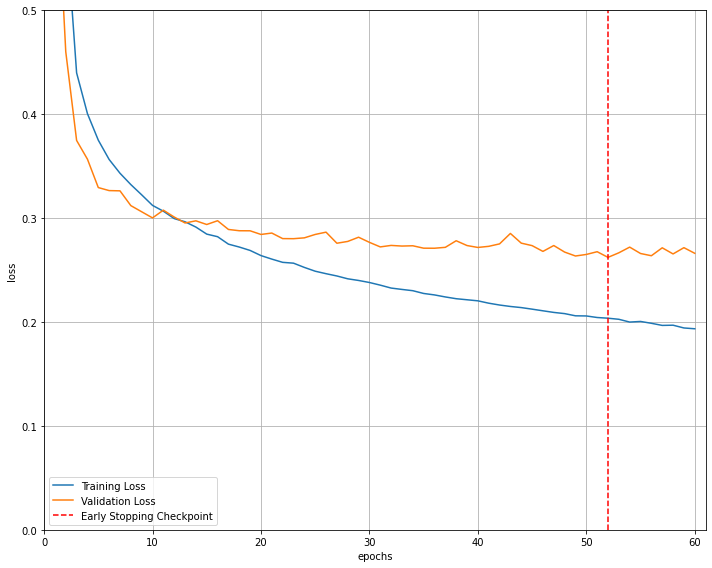

Input Image


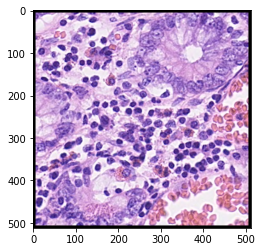

Predicted Mask Sigmoid


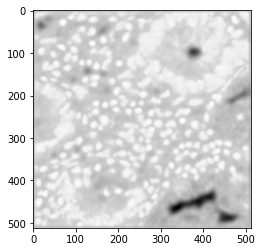

Predicted Mask Binary


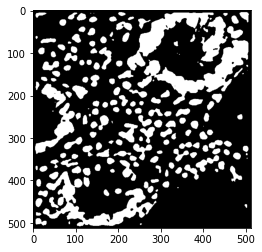

Actual Mask


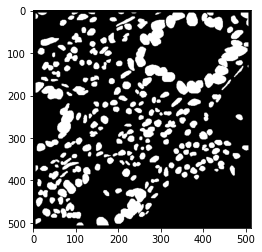

iou score: 0.660627988766035
AJI score: 0.660627988766035
AJI+ score: 0.660627988766035
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.660627328138707
Panoptic Quality (PQ): 0.660627328138707
Dice2 score: 0.7956363414745631 



In [ ]:
n_bs = [1, 4, 8, 16]
n_lr = [0.001, 0.0001, 0.00001]
epochs = 60
patience = 10

train_dir = "./Train/train_500"
test_dir = "./Test/test_500"

for bs in n_bs:
    for lr in n_lr:
        hyperparam_tuning(train_dir, test_dir, bs, lr, epochs, patience)

1000 x 1000 images (best: lr 0.001, batch size 1, iou score 0.6901700673393865)

Batch size: 1, Learning rate: 0.001 , Epochs: 60



  0%|          | 0/60 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Validation loss decreased (inf --> 1.523338).  Saving model ...


  2%|▏         | 1/60 [00:16<16:16, 16.54s/it]

Train Epoch: 1 @ 22:03:46.057554 - Train Loss: 0.5583 - Valid Loss: 1.5233
Validation loss decreased (1.523338 --> 0.294715).  Saving model ...


  3%|▎         | 2/60 [00:33<15:59, 16.54s/it]

Train Epoch: 2 @ 22:04:02.576148 - Train Loss: 0.3892 - Valid Loss: 0.2947


  5%|▌         | 3/60 [00:49<15:40, 16.51s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 3 @ 22:04:19.014898 - Train Loss: 0.3018 - Valid Loss: 0.3278
Validation loss decreased (0.294715 --> 0.253245).  Saving model ...


  7%|▋         | 4/60 [01:06<15:31, 16.63s/it]

Train Epoch: 4 @ 22:04:35.938036 - Train Loss: 0.2919 - Valid Loss: 0.2532
Validation loss decreased (0.253245 --> 0.235164).  Saving model ...


  8%|▊         | 5/60 [01:23<15:17, 16.69s/it]

Train Epoch: 5 @ 22:04:52.761675 - Train Loss: 0.2823 - Valid Loss: 0.2352


 10%|█         | 6/60 [01:39<14:52, 16.52s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 22:05:08.891010 - Train Loss: 0.2501 - Valid Loss: 0.2770
Validation loss decreased (0.235164 --> 0.234010).  Saving model ...


 12%|█▏        | 7/60 [01:55<14:35, 16.53s/it]

Train Epoch: 7 @ 22:05:25.427242 - Train Loss: 0.2543 - Valid Loss: 0.2340


 13%|█▎        | 8/60 [02:12<14:17, 16.48s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 22:05:41.808068 - Train Loss: 0.2330 - Valid Loss: 0.2381


 15%|█▌        | 9/60 [02:28<13:59, 16.46s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 9 @ 22:05:58.207454 - Train Loss: 0.2186 - Valid Loss: 0.2499


 17%|█▋        | 10/60 [02:44<13:40, 16.41s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 10 @ 22:06:14.509071 - Train Loss: 0.2223 - Valid Loss: 0.2821


 18%|█▊        | 11/60 [03:01<13:20, 16.33s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 11 @ 22:06:30.647552 - Train Loss: 0.2895 - Valid Loss: 0.2879


 20%|██        | 12/60 [03:17<13:02, 16.29s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 12 @ 22:06:46.857311 - Train Loss: 0.2572 - Valid Loss: 0.2907


 22%|██▏       | 13/60 [03:33<12:46, 16.30s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 13 @ 22:07:03.174190 - Train Loss: 0.2403 - Valid Loss: 0.3230
Validation loss decreased (0.234010 --> 0.232630).  Saving model ...


 23%|██▎       | 14/60 [03:50<12:33, 16.38s/it]

Train Epoch: 14 @ 22:07:19.736997 - Train Loss: 0.2207 - Valid Loss: 0.2326
Validation loss decreased (0.232630 --> 0.229292).  Saving model ...


 25%|██▌       | 15/60 [04:06<12:20, 16.46s/it]

Train Epoch: 15 @ 22:07:36.378242 - Train Loss: 0.2111 - Valid Loss: 0.2293
Validation loss decreased (0.229292 --> 0.227902).  Saving model ...


 27%|██▋       | 16/60 [04:23<12:07, 16.54s/it]

Train Epoch: 16 @ 22:07:53.122512 - Train Loss: 0.2162 - Valid Loss: 0.2279
Validation loss decreased (0.227902 --> 0.213205).  Saving model ...


 28%|██▊       | 17/60 [04:40<11:55, 16.63s/it]

Train Epoch: 17 @ 22:08:09.956452 - Train Loss: 0.2073 - Valid Loss: 0.2132


 30%|███       | 18/60 [04:56<11:34, 16.54s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 18 @ 22:08:26.277393 - Train Loss: 0.2184 - Valid Loss: 0.2341


 32%|███▏      | 19/60 [05:13<11:15, 16.46s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 19 @ 22:08:42.569304 - Train Loss: 0.2122 - Valid Loss: 0.2225


 33%|███▎      | 20/60 [05:29<10:55, 16.39s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 20 @ 22:08:58.790290 - Train Loss: 0.1926 - Valid Loss: 0.2234


 35%|███▌      | 21/60 [05:45<10:36, 16.33s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 21 @ 22:09:14.971269 - Train Loss: 0.1815 - Valid Loss: 0.2394


 37%|███▋      | 22/60 [06:01<10:19, 16.31s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 22 @ 22:09:31.231803 - Train Loss: 0.1761 - Valid Loss: 0.2205
Validation loss decreased (0.213205 --> 0.211790).  Saving model ...


 38%|███▊      | 23/60 [06:18<10:08, 16.44s/it]

Train Epoch: 23 @ 22:09:47.975397 - Train Loss: 0.1749 - Valid Loss: 0.2118


 40%|████      | 24/60 [06:34<09:49, 16.39s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 24 @ 22:10:04.244040 - Train Loss: 0.1749 - Valid Loss: 0.2164


 42%|████▏     | 25/60 [06:50<09:31, 16.34s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 25 @ 22:10:20.459474 - Train Loss: 0.1688 - Valid Loss: 0.2219


 43%|████▎     | 26/60 [07:07<09:14, 16.30s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 26 @ 22:10:36.672386 - Train Loss: 0.1740 - Valid Loss: 0.2218


 45%|████▌     | 27/60 [07:23<08:58, 16.31s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 27 @ 22:10:52.997308 - Train Loss: 0.1783 - Valid Loss: 0.2308


 47%|████▋     | 28/60 [07:39<08:40, 16.27s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 28 @ 22:11:09.181957 - Train Loss: 0.1718 - Valid Loss: 0.2155


 48%|████▊     | 29/60 [07:55<08:23, 16.24s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 29 @ 22:11:25.363066 - Train Loss: 0.1781 - Valid Loss: 0.2167


 50%|█████     | 30/60 [08:12<08:07, 16.23s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 30 @ 22:11:41.577084 - Train Loss: 0.1881 - Valid Loss: 0.2355


 52%|█████▏    | 31/60 [08:28<07:51, 16.26s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 31 @ 22:11:57.895450 - Train Loss: 0.1839 - Valid Loss: 0.2157


 53%|█████▎    | 32/60 [08:44<07:34, 16.24s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 32 @ 22:12:14.092650 - Train Loss: 0.1671 - Valid Loss: 0.2174
EarlyStopping counter: 10 out of 10
Early stopping


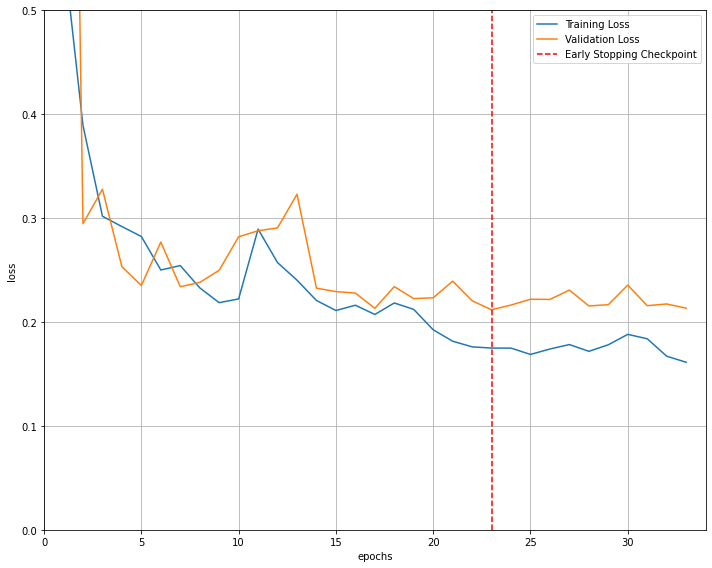

Input Image


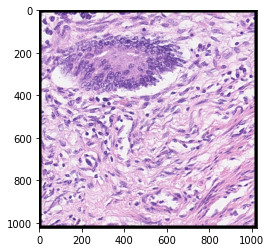

Predicted Mask Sigmoid


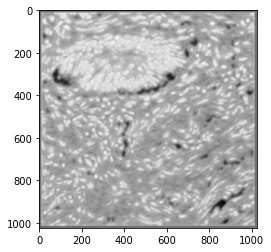

Predicted Mask Binary


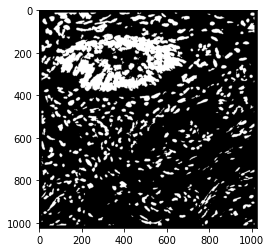

Actual Mask


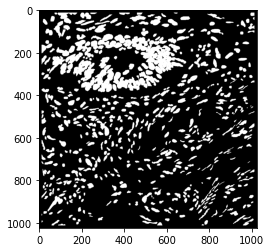

iou score: 0.6901700673393865
AJI score: 0.6901700673393865
AJI+ score: 0.6901700673393865
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6901693771700094
Panoptic Quality (PQ): 0.6901693771700094
Dice2 score: 0.8166871259598519 

Batch size: 1, Learning rate: 0.0001 , Epochs: 60




  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.625287).  Saving model ...



  2%|▏         | 1/60 [00:17<16:45, 17.05s/it]

Train Epoch: 1 @ 22:12:52.209629 - Train Loss: 0.7018 - Valid Loss: 0.6253
Validation loss decreased (0.625287 --> 0.441818).  Saving model ...



  3%|▎         | 2/60 [00:34<16:33, 17.12s/it]

Train Epoch: 2 @ 22:13:09.502136 - Train Loss: 0.5533 - Valid Loss: 0.4418
Validation loss decreased (0.441818 --> 0.408225).  Saving model ...



  5%|▌         | 3/60 [00:51<16:16, 17.14s/it]

Train Epoch: 3 @ 22:13:26.684084 - Train Loss: 0.4468 - Valid Loss: 0.4082
Validation loss decreased (0.408225 --> 0.355473).  Saving model ...



  7%|▋         | 4/60 [01:08<15:59, 17.14s/it]

Train Epoch: 4 @ 22:13:43.812423 - Train Loss: 0.3642 - Valid Loss: 0.3555
Validation loss decreased (0.355473 --> 0.334075).  Saving model ...



  8%|▊         | 5/60 [01:25<15:39, 17.08s/it]

Train Epoch: 5 @ 22:14:00.760800 - Train Loss: 0.3313 - Valid Loss: 0.3341



 10%|█         | 6/60 [01:42<15:14, 16.93s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 22:14:17.356205 - Train Loss: 0.3120 - Valid Loss: 0.3657
Validation loss decreased (0.334075 --> 0.317201).  Saving model ...



 12%|█▏        | 7/60 [01:59<14:59, 16.98s/it]

Train Epoch: 7 @ 22:14:34.443738 - Train Loss: 0.2977 - Valid Loss: 0.3172



 13%|█▎        | 8/60 [02:15<14:38, 16.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 22:14:51.114189 - Train Loss: 0.2804 - Valid Loss: 0.3439



 15%|█▌        | 9/60 [02:32<14:15, 16.77s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 9 @ 22:15:07.594272 - Train Loss: 0.2819 - Valid Loss: 0.3204



 17%|█▋        | 10/60 [02:48<13:53, 16.67s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 10 @ 22:15:24.056853 - Train Loss: 0.2538 - Valid Loss: 0.3184
Validation loss decreased (0.317201 --> 0.311244).  Saving model ...



 18%|█▊        | 11/60 [03:05<13:42, 16.79s/it]

Train Epoch: 11 @ 22:15:41.129425 - Train Loss: 0.2476 - Valid Loss: 0.3112



 20%|██        | 12/60 [03:22<13:24, 16.76s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 22:15:57.824562 - Train Loss: 0.2388 - Valid Loss: 0.3127
Validation loss decreased (0.311244 --> 0.308782).  Saving model ...



 22%|██▏       | 13/60 [03:39<13:10, 16.81s/it]

Train Epoch: 13 @ 22:16:14.743094 - Train Loss: 0.2340 - Valid Loss: 0.3088
Validation loss decreased (0.308782 --> 0.298089).  Saving model ...



 23%|██▎       | 14/60 [03:56<12:55, 16.87s/it]

Train Epoch: 14 @ 22:16:31.740078 - Train Loss: 0.2225 - Valid Loss: 0.2981



 25%|██▌       | 15/60 [04:13<12:36, 16.81s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 15 @ 22:16:48.432478 - Train Loss: 0.2194 - Valid Loss: 0.3043
Validation loss decreased (0.298089 --> 0.284990).  Saving model ...



 27%|██▋       | 16/60 [04:30<12:22, 16.88s/it]

Train Epoch: 16 @ 22:17:05.474502 - Train Loss: 0.2134 - Valid Loss: 0.2850



 28%|██▊       | 17/60 [04:46<12:02, 16.79s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 17 @ 22:17:22.056770 - Train Loss: 0.2128 - Valid Loss: 0.2974
Validation loss decreased (0.284990 --> 0.284283).  Saving model ...



 30%|███       | 18/60 [05:03<11:47, 16.84s/it]

Train Epoch: 18 @ 22:17:39.005466 - Train Loss: 0.2060 - Valid Loss: 0.2843



 32%|███▏      | 19/60 [05:20<11:28, 16.79s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 19 @ 22:17:55.677670 - Train Loss: 0.2014 - Valid Loss: 0.2901



 33%|███▎      | 20/60 [05:37<11:09, 16.75s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 20 @ 22:18:12.326408 - Train Loss: 0.2016 - Valid Loss: 0.3187



 35%|███▌      | 21/60 [05:53<10:50, 16.68s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 21 @ 22:18:28.864106 - Train Loss: 0.2215 - Valid Loss: 0.3227



 37%|███▋      | 22/60 [06:10<10:31, 16.63s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 22 @ 22:18:45.359392 - Train Loss: 0.2108 - Valid Loss: 0.2964



 38%|███▊      | 23/60 [06:26<10:15, 16.63s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 23 @ 22:19:02.009425 - Train Loss: 0.1981 - Valid Loss: 0.2882
Validation loss decreased (0.284283 --> 0.282252).  Saving model ...



 40%|████      | 24/60 [06:43<10:02, 16.73s/it]

Train Epoch: 24 @ 22:19:18.971073 - Train Loss: 0.1901 - Valid Loss: 0.2823
Validation loss decreased (0.282252 --> 0.273824).  Saving model ...



 42%|████▏     | 25/60 [07:00<09:49, 16.85s/it]

Train Epoch: 25 @ 22:19:36.095577 - Train Loss: 0.1840 - Valid Loss: 0.2738



 43%|████▎     | 26/60 [07:17<09:30, 16.79s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 26 @ 22:19:52.740897 - Train Loss: 0.1821 - Valid Loss: 0.2946



 45%|████▌     | 27/60 [07:34<09:11, 16.71s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 27 @ 22:20:09.254656 - Train Loss: 0.1771 - Valid Loss: 0.2762



 47%|████▋     | 28/60 [07:50<08:53, 16.66s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 28 @ 22:20:25.804706 - Train Loss: 0.1741 - Valid Loss: 0.2912



 48%|████▊     | 29/60 [08:07<08:36, 16.66s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 29 @ 22:20:42.460301 - Train Loss: 0.1740 - Valid Loss: 0.2930



 50%|█████     | 30/60 [08:23<08:19, 16.64s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 30 @ 22:20:59.044303 - Train Loss: 0.1703 - Valid Loss: 0.2832



 52%|█████▏    | 31/60 [08:40<08:01, 16.60s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 31 @ 22:21:15.558539 - Train Loss: 0.1673 - Valid Loss: 0.2843



 53%|█████▎    | 32/60 [08:56<07:44, 16.58s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 32 @ 22:21:32.088419 - Train Loss: 0.1754 - Valid Loss: 0.2871



 55%|█████▌    | 33/60 [09:13<07:28, 16.61s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 33 @ 22:21:48.777813 - Train Loss: 0.1663 - Valid Loss: 0.2790



 57%|█████▋    | 34/60 [09:30<07:11, 16.62s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 34 @ 22:22:05.401478 - Train Loss: 0.1630 - Valid Loss: 0.3071
EarlyStopping counter: 10 out of 10
Early stopping


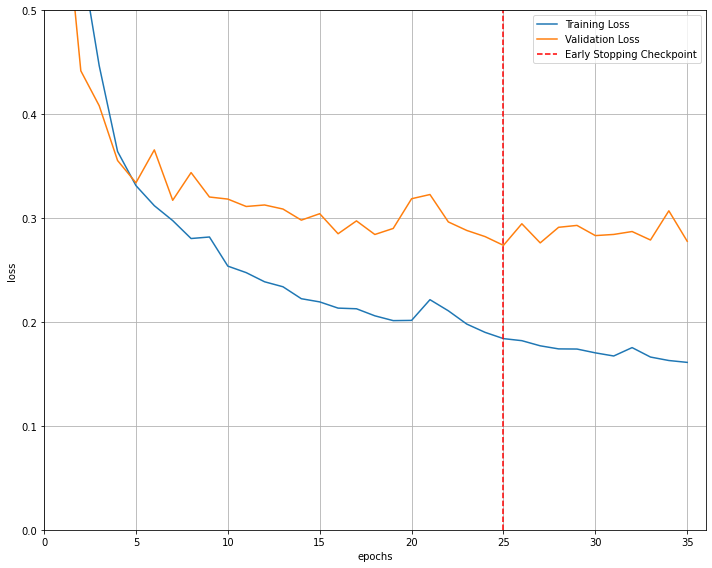

Input Image


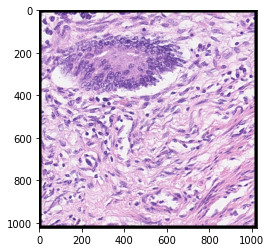

Predicted Mask Sigmoid


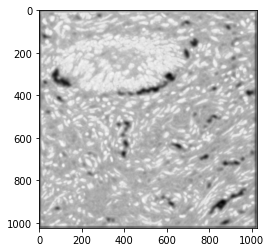

Predicted Mask Binary


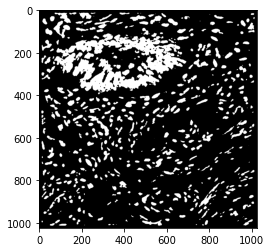

Actual Mask


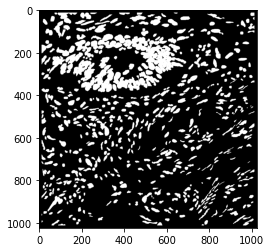

iou score: 0.6614616249579356
AJI score: 0.6614616249579356
AJI+ score: 0.6614616249579356
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6614609634969721
Panoptic Quality (PQ): 0.6614609634969721
Dice2 score: 0.7962406293611293 

Batch size: 1, Learning rate: 1e-05 , Epochs: 60





  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.807469).  Saving model ...




  2%|▏         | 1/60 [00:16<16:41, 16.98s/it]

Train Epoch: 1 @ 22:22:41.564695 - Train Loss: 0.7494 - Valid Loss: 0.8075
Validation loss decreased (0.807469 --> 0.780465).  Saving model ...




  3%|▎         | 2/60 [00:34<16:27, 17.03s/it]

Train Epoch: 2 @ 22:22:58.714306 - Train Loss: 0.7337 - Valid Loss: 0.7805
Validation loss decreased (0.780465 --> 0.746456).  Saving model ...




  5%|▌         | 3/60 [00:51<16:10, 17.03s/it]

Train Epoch: 3 @ 22:23:15.750243 - Train Loss: 0.7142 - Valid Loss: 0.7465
Validation loss decreased (0.746456 --> 0.707664).  Saving model ...




  7%|▋         | 4/60 [01:08<15:52, 17.02s/it]

Train Epoch: 4 @ 22:23:32.731693 - Train Loss: 0.6927 - Valid Loss: 0.7077
Validation loss decreased (0.707664 --> 0.668497).  Saving model ...




  8%|▊         | 5/60 [01:25<15:36, 17.02s/it]

Train Epoch: 5 @ 22:23:49.765726 - Train Loss: 0.6680 - Valid Loss: 0.6685
Validation loss decreased (0.668497 --> 0.614472).  Saving model ...




 10%|█         | 6/60 [01:42<15:21, 17.06s/it]

Train Epoch: 6 @ 22:24:06.912137 - Train Loss: 0.6261 - Valid Loss: 0.6145
Validation loss decreased (0.614472 --> 0.553064).  Saving model ...




 12%|█▏        | 7/60 [01:59<15:04, 17.06s/it]

Train Epoch: 7 @ 22:24:23.964512 - Train Loss: 0.5721 - Valid Loss: 0.5531
Validation loss decreased (0.553064 --> 0.509724).  Saving model ...




 13%|█▎        | 8/60 [02:16<14:48, 17.09s/it]

Train Epoch: 8 @ 22:24:41.132180 - Train Loss: 0.5200 - Valid Loss: 0.5097
Validation loss decreased (0.509724 --> 0.455455).  Saving model ...




 15%|█▌        | 9/60 [02:33<14:31, 17.08s/it]

Train Epoch: 9 @ 22:24:58.186320 - Train Loss: 0.4754 - Valid Loss: 0.4555
Validation loss decreased (0.455455 --> 0.441620).  Saving model ...




 17%|█▋        | 10/60 [02:50<14:13, 17.06s/it]

Train Epoch: 10 @ 22:25:15.210012 - Train Loss: 0.4478 - Valid Loss: 0.4416
Validation loss decreased (0.441620 --> 0.418492).  Saving model ...




 18%|█▊        | 11/60 [03:07<13:56, 17.07s/it]

Train Epoch: 11 @ 22:25:32.298037 - Train Loss: 0.4306 - Valid Loss: 0.4185
Validation loss decreased (0.418492 --> 0.410271).  Saving model ...




 20%|██        | 12/60 [03:24<13:41, 17.11s/it]

Train Epoch: 12 @ 22:25:49.503123 - Train Loss: 0.4103 - Valid Loss: 0.4103
Validation loss decreased (0.410271 --> 0.405925).  Saving model ...




 22%|██▏       | 13/60 [03:41<13:23, 17.09s/it]

Train Epoch: 13 @ 22:26:06.528769 - Train Loss: 0.4038 - Valid Loss: 0.4059
Validation loss decreased (0.405925 --> 0.395627).  Saving model ...




 23%|██▎       | 14/60 [03:59<13:05, 17.08s/it]

Train Epoch: 14 @ 22:26:23.590043 - Train Loss: 0.3901 - Valid Loss: 0.3956
Validation loss decreased (0.395627 --> 0.394680).  Saving model ...




 25%|██▌       | 15/60 [04:16<12:50, 17.12s/it]

Train Epoch: 15 @ 22:26:40.813730 - Train Loss: 0.3844 - Valid Loss: 0.3947
Validation loss decreased (0.394680 --> 0.393168).  Saving model ...




 27%|██▋       | 16/60 [04:33<12:35, 17.16s/it]

Train Epoch: 16 @ 22:26:58.079482 - Train Loss: 0.3729 - Valid Loss: 0.3932




 28%|██▊       | 17/60 [04:50<12:11, 17.00s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 17 @ 22:27:14.709631 - Train Loss: 0.3729 - Valid Loss: 0.3934




 30%|███       | 18/60 [05:06<11:49, 16.88s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 18 @ 22:27:31.312897 - Train Loss: 0.3592 - Valid Loss: 0.3943
Validation loss decreased (0.393168 --> 0.385990).  Saving model ...




 32%|███▏      | 19/60 [05:23<11:36, 16.98s/it]

Train Epoch: 19 @ 22:27:48.503126 - Train Loss: 0.3539 - Valid Loss: 0.3860
Validation loss decreased (0.385990 --> 0.385351).  Saving model ...




 33%|███▎      | 20/60 [05:41<11:21, 17.03s/it]

Train Epoch: 20 @ 22:28:05.650224 - Train Loss: 0.3506 - Valid Loss: 0.3854
Validation loss decreased (0.385351 --> 0.381507).  Saving model ...




 35%|███▌      | 21/60 [05:58<11:04, 17.04s/it]

Train Epoch: 21 @ 22:28:22.706354 - Train Loss: 0.3447 - Valid Loss: 0.3815




 37%|███▋      | 22/60 [06:14<10:43, 16.92s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 22 @ 22:28:39.368337 - Train Loss: 0.3421 - Valid Loss: 0.3825
Validation loss decreased (0.381507 --> 0.379652).  Saving model ...




 38%|███▊      | 23/60 [06:31<10:28, 17.00s/it]

Train Epoch: 23 @ 22:28:56.535351 - Train Loss: 0.3371 - Valid Loss: 0.3797
Validation loss decreased (0.379652 --> 0.377469).  Saving model ...




 40%|████      | 24/60 [06:49<10:13, 17.04s/it]

Train Epoch: 24 @ 22:29:13.664548 - Train Loss: 0.3321 - Valid Loss: 0.3775
Validation loss decreased (0.377469 --> 0.376623).  Saving model ...




 42%|████▏     | 25/60 [07:06<09:56, 17.04s/it]

Train Epoch: 25 @ 22:29:30.725221 - Train Loss: 0.3287 - Valid Loss: 0.3766
Validation loss decreased (0.376623 --> 0.370990).  Saving model ...




 43%|████▎     | 26/60 [07:23<09:39, 17.05s/it]

Train Epoch: 26 @ 22:29:47.802275 - Train Loss: 0.3255 - Valid Loss: 0.3710




 45%|████▌     | 27/60 [07:40<09:20, 16.98s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 27 @ 22:30:04.613597 - Train Loss: 0.3247 - Valid Loss: 0.3738




 47%|████▋     | 28/60 [07:56<09:00, 16.89s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 28 @ 22:30:21.302089 - Train Loss: 0.3202 - Valid Loss: 0.3798




 48%|████▊     | 29/60 [08:13<08:42, 16.85s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 29 @ 22:30:38.054232 - Train Loss: 0.3200 - Valid Loss: 0.3820




 50%|█████     | 30/60 [08:30<08:23, 16.80s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 30 @ 22:30:54.733963 - Train Loss: 0.3145 - Valid Loss: 0.3711
Validation loss decreased (0.370990 --> 0.367791).  Saving model ...




 52%|█████▏    | 31/60 [08:47<08:09, 16.86s/it]

Train Epoch: 31 @ 22:31:11.742138 - Train Loss: 0.3112 - Valid Loss: 0.3678




 53%|█████▎    | 32/60 [09:03<07:50, 16.80s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 32 @ 22:31:28.410901 - Train Loss: 0.3070 - Valid Loss: 0.3718




 55%|█████▌    | 33/60 [09:20<07:33, 16.79s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 33 @ 22:31:45.175354 - Train Loss: 0.3058 - Valid Loss: 0.3696
Validation loss decreased (0.367791 --> 0.364855).  Saving model ...




 57%|█████▋    | 34/60 [09:37<07:18, 16.87s/it]

Train Epoch: 34 @ 22:32:02.240606 - Train Loss: 0.3021 - Valid Loss: 0.3649




 58%|█████▊    | 35/60 [09:54<06:59, 16.80s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 35 @ 22:32:18.860469 - Train Loss: 0.3002 - Valid Loss: 0.3664




 60%|██████    | 36/60 [10:10<06:41, 16.74s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 36 @ 22:32:35.474178 - Train Loss: 0.2986 - Valid Loss: 0.3652




 62%|██████▏   | 37/60 [10:27<06:25, 16.74s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 37 @ 22:32:52.214725 - Train Loss: 0.2971 - Valid Loss: 0.3719
Validation loss decreased (0.364855 --> 0.362657).  Saving model ...




 63%|██████▎   | 38/60 [10:44<06:10, 16.82s/it]

Train Epoch: 38 @ 22:33:09.224118 - Train Loss: 0.2947 - Valid Loss: 0.3627




 65%|██████▌   | 39/60 [11:01<05:52, 16.77s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 39 @ 22:33:25.864803 - Train Loss: 0.2916 - Valid Loss: 0.3650
Validation loss decreased (0.362657 --> 0.352810).  Saving model ...




 67%|██████▋   | 40/60 [11:18<05:36, 16.85s/it]

Train Epoch: 40 @ 22:33:42.896776 - Train Loss: 0.2899 - Valid Loss: 0.3528




 68%|██████▊   | 41/60 [11:35<05:19, 16.84s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 41 @ 22:33:59.711311 - Train Loss: 0.2878 - Valid Loss: 0.3566




 70%|███████   | 42/60 [11:51<05:02, 16.79s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 42 @ 22:34:16.388906 - Train Loss: 0.2864 - Valid Loss: 0.3553




 72%|███████▏  | 43/60 [12:08<04:44, 16.74s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 43 @ 22:34:33.021295 - Train Loss: 0.2853 - Valid Loss: 0.3572




 73%|███████▎  | 44/60 [12:25<04:27, 16.71s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 44 @ 22:34:49.648625 - Train Loss: 0.2822 - Valid Loss: 0.3528




 75%|███████▌  | 45/60 [12:41<04:10, 16.72s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 45 @ 22:35:06.401746 - Train Loss: 0.2808 - Valid Loss: 0.3563




 77%|███████▋  | 46/60 [12:58<03:53, 16.71s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 46 @ 22:35:23.081810 - Train Loss: 0.2792 - Valid Loss: 0.3581
Validation loss decreased (0.352810 --> 0.345982).  Saving model ...




 78%|███████▊  | 47/60 [13:15<03:39, 16.85s/it]

Train Epoch: 47 @ 22:35:40.262702 - Train Loss: 0.2781 - Valid Loss: 0.3460




 80%|████████  | 48/60 [13:32<03:21, 16.80s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 48 @ 22:35:56.950498 - Train Loss: 0.2757 - Valid Loss: 0.3464




 82%|████████▏ | 49/60 [13:48<03:04, 16.74s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 49 @ 22:36:13.548727 - Train Loss: 0.2751 - Valid Loss: 0.3477




 83%|████████▎ | 50/60 [14:05<02:47, 16.72s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 50 @ 22:36:30.220861 - Train Loss: 0.2737 - Valid Loss: 0.3491




 85%|████████▌ | 51/60 [14:22<02:30, 16.73s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 51 @ 22:36:46.964552 - Train Loss: 0.2730 - Valid Loss: 0.3510




 87%|████████▋ | 52/60 [14:39<02:13, 16.71s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 52 @ 22:37:03.631162 - Train Loss: 0.2712 - Valid Loss: 0.3525




 88%|████████▊ | 53/60 [14:55<01:56, 16.69s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 53 @ 22:37:20.278521 - Train Loss: 0.2690 - Valid Loss: 0.3523




 90%|█████████ | 54/60 [15:12<01:40, 16.69s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 54 @ 22:37:36.976930 - Train Loss: 0.2680 - Valid Loss: 0.3487




 92%|█████████▏| 55/60 [15:29<01:23, 16.71s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 55 @ 22:37:53.720305 - Train Loss: 0.2671 - Valid Loss: 0.3482




 93%|█████████▎| 56/60 [15:45<01:06, 16.69s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 56 @ 22:38:10.374473 - Train Loss: 0.2651 - Valid Loss: 0.3477
Validation loss decreased (0.345982 --> 0.336256).  Saving model ...




 95%|█████████▌| 57/60 [16:02<00:50, 16.78s/it]

Train Epoch: 57 @ 22:38:27.351114 - Train Loss: 0.2654 - Valid Loss: 0.3363




 97%|█████████▋| 58/60 [16:19<00:33, 16.76s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 58 @ 22:38:44.079364 - Train Loss: 0.2638 - Valid Loss: 0.3466




 98%|█████████▊| 59/60 [16:36<00:16, 16.76s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 59 @ 22:39:00.824101 - Train Loss: 0.2615 - Valid Loss: 0.3412




100%|██████████| 60/60 [16:52<00:00, 16.88s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 60 @ 22:39:17.437724 - Train Loss: 0.2607 - Valid Loss: 0.3392


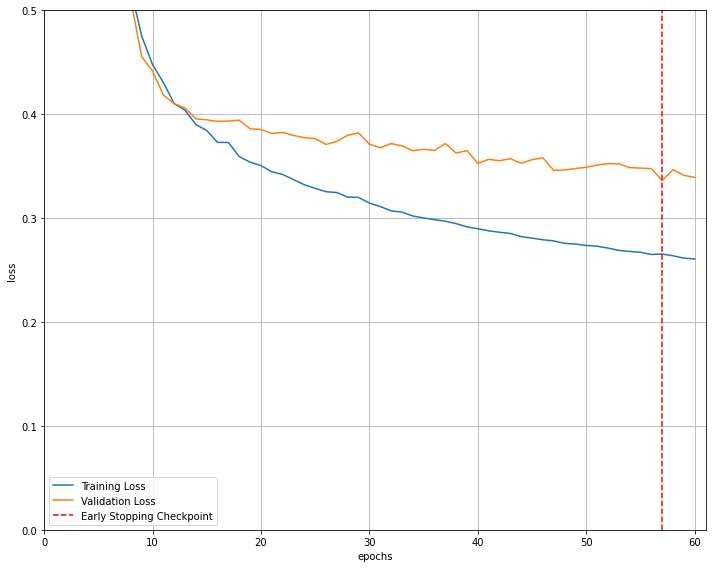

Input Image


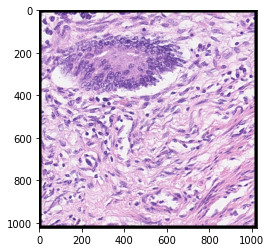

Predicted Mask Sigmoid


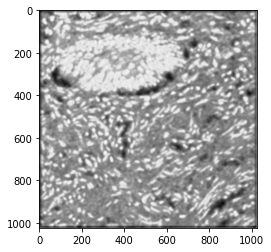

Predicted Mask Binary


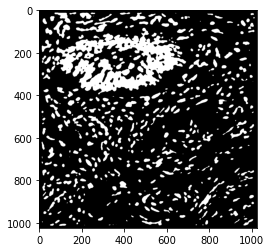

Actual Mask


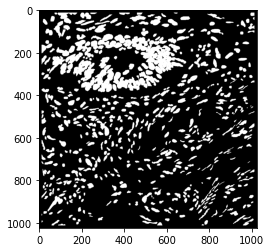

iou score: 0.6394782546772324
AJI score: 0.6394782546772324
AJI+ score: 0.6394782546772324
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6394776151996172
Panoptic Quality (PQ): 0.6394776151996172
Dice2 score: 0.7800997089810475 

Batch size: 4, Learning rate: 0.001 , Epochs: 60





  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 1.082146).  Saving model ...




  2%|▏         | 1/60 [00:16<16:12, 16.49s/it]

Train Epoch: 1 @ 22:39:36.545721 - Train Loss: 0.6435 - Valid Loss: 1.0821
Validation loss decreased (1.082146 --> 0.485664).  Saving model ...




  3%|▎         | 2/60 [00:33<15:59, 16.54s/it]

Train Epoch: 2 @ 22:39:53.228817 - Train Loss: 0.4557 - Valid Loss: 0.4857
Validation loss decreased (0.485664 --> 0.369719).  Saving model ...




  5%|▌         | 3/60 [00:49<15:45, 16.58s/it]

Train Epoch: 3 @ 22:40:09.899160 - Train Loss: 0.3708 - Valid Loss: 0.3697




  7%|▋         | 4/60 [01:06<15:22, 16.47s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 4 @ 22:40:26.109525 - Train Loss: 0.3382 - Valid Loss: 0.4049
Validation loss decreased (0.369719 --> 0.341688).  Saving model ...




  8%|▊         | 5/60 [01:22<15:07, 16.50s/it]

Train Epoch: 5 @ 22:40:42.662957 - Train Loss: 0.2905 - Valid Loss: 0.3417
Validation loss decreased (0.341688 --> 0.295725).  Saving model ...




 10%|█         | 6/60 [01:39<14:51, 16.50s/it]

Train Epoch: 6 @ 22:40:59.180232 - Train Loss: 0.2930 - Valid Loss: 0.2957




 12%|█▏        | 7/60 [01:55<14:29, 16.40s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 22:41:15.341430 - Train Loss: 0.2729 - Valid Loss: 0.3588
Validation loss decreased (0.295725 --> 0.272086).  Saving model ...




 13%|█▎        | 8/60 [02:11<14:16, 16.46s/it]

Train Epoch: 8 @ 22:41:31.954879 - Train Loss: 0.2579 - Valid Loss: 0.2721




 15%|█▌        | 9/60 [02:28<13:57, 16.41s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 9 @ 22:41:48.246239 - Train Loss: 0.2418 - Valid Loss: 0.3242




 17%|█▋        | 10/60 [02:44<13:35, 16.30s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 10 @ 22:42:04.288036 - Train Loss: 0.2385 - Valid Loss: 0.2786




 18%|█▊        | 11/60 [03:00<13:15, 16.24s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 11 @ 22:42:20.398053 - Train Loss: 0.2174 - Valid Loss: 0.3501




 20%|██        | 12/60 [03:16<12:58, 16.21s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 12 @ 22:42:36.544279 - Train Loss: 0.2121 - Valid Loss: 0.3394




 22%|██▏       | 13/60 [03:32<12:41, 16.20s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 13 @ 22:42:52.700950 - Train Loss: 0.2064 - Valid Loss: 0.3193




 23%|██▎       | 14/60 [03:48<12:23, 16.16s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 14 @ 22:43:08.773069 - Train Loss: 0.1944 - Valid Loss: 0.2895




 25%|██▌       | 15/60 [04:04<12:05, 16.11s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 15 @ 22:43:24.775784 - Train Loss: 0.1906 - Valid Loss: 0.2955




 27%|██▋       | 16/60 [04:20<11:48, 16.10s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 16 @ 22:43:40.834919 - Train Loss: 0.2251 - Valid Loss: 0.3837
Validation loss decreased (0.272086 --> 0.257449).  Saving model ...




 28%|██▊       | 17/60 [04:37<11:38, 16.24s/it]

Train Epoch: 17 @ 22:43:57.403524 - Train Loss: 0.1902 - Valid Loss: 0.2574




 30%|███       | 18/60 [04:53<11:20, 16.19s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 18 @ 22:44:13.485454 - Train Loss: 0.1827 - Valid Loss: 0.3179




 32%|███▏      | 19/60 [05:09<11:02, 16.15s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 19 @ 22:44:29.547205 - Train Loss: 0.1776 - Valid Loss: 0.3730




 33%|███▎      | 20/60 [05:25<10:46, 16.15s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 20 @ 22:44:45.702265 - Train Loss: 0.1713 - Valid Loss: 0.2711




 35%|███▌      | 21/60 [05:41<10:30, 16.18s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 21 @ 22:45:01.928916 - Train Loss: 0.1779 - Valid Loss: 0.4017




 37%|███▋      | 22/60 [05:57<10:13, 16.15s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 22 @ 22:45:18.004479 - Train Loss: 0.1741 - Valid Loss: 0.2751




 38%|███▊      | 23/60 [06:13<09:55, 16.11s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 23 @ 22:45:34.020753 - Train Loss: 0.1652 - Valid Loss: 0.3644




 40%|████      | 24/60 [06:30<09:40, 16.12s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 24 @ 22:45:50.186358 - Train Loss: 0.1643 - Valid Loss: 0.2838




 42%|████▏     | 25/60 [06:46<09:25, 16.16s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 25 @ 22:46:06.420349 - Train Loss: 0.1685 - Valid Loss: 0.2621




 43%|████▎     | 26/60 [07:02<09:09, 16.16s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 26 @ 22:46:22.600057 - Train Loss: 0.1531 - Valid Loss: 0.3570
EarlyStopping counter: 10 out of 10
Early stopping


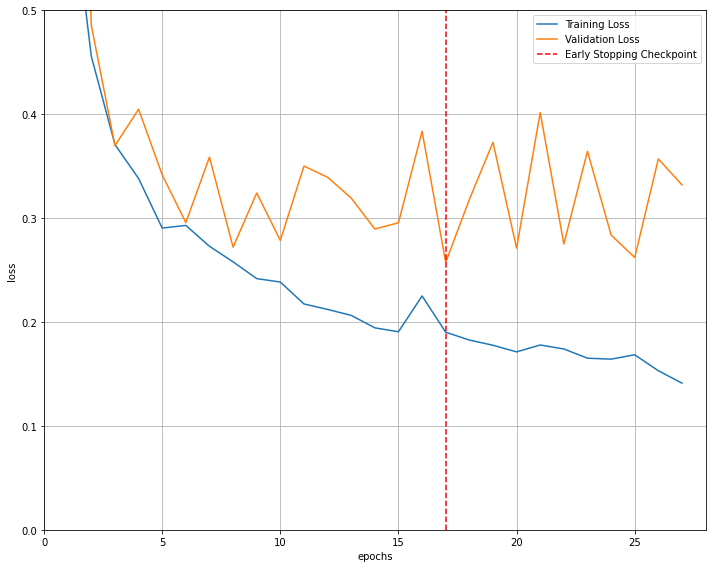

Input Image


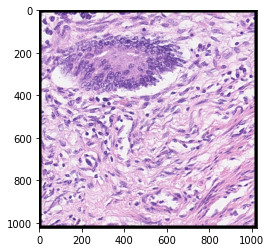

Predicted Mask Sigmoid


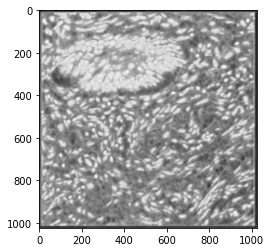

Predicted Mask Binary


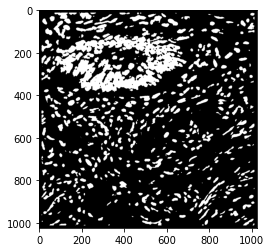

Actual Mask


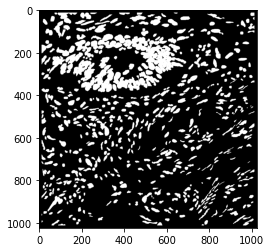

iou score: 0.6828339843129783
AJI score: 0.6828339843129783
AJI+ score: 0.6828339843129783
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6828333014796768
Panoptic Quality (PQ): 0.6828333014796768
Dice2 score: 0.8115286364290382 

Batch size: 4, Learning rate: 0.0001 , Epochs: 60






  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.617096).  Saving model ...





  2%|▏         | 1/60 [00:16<16:40, 16.95s/it]

Train Epoch: 1 @ 22:46:58.566830 - Train Loss: 0.6918 - Valid Loss: 0.6171
Validation loss decreased (0.617096 --> 0.482419).  Saving model ...





  3%|▎         | 2/60 [00:33<16:23, 16.96s/it]

Train Epoch: 2 @ 22:47:15.555124 - Train Loss: 0.5186 - Valid Loss: 0.4824
Validation loss decreased (0.482419 --> 0.379411).  Saving model ...





  5%|▌         | 3/60 [00:51<16:08, 16.99s/it]

Train Epoch: 3 @ 22:47:32.616931 - Train Loss: 0.3994 - Valid Loss: 0.3794
Validation loss decreased (0.379411 --> 0.378984).  Saving model ...





  7%|▋         | 4/60 [01:08<15:53, 17.03s/it]

Train Epoch: 4 @ 22:47:49.737691 - Train Loss: 0.3438 - Valid Loss: 0.3790
Validation loss decreased (0.378984 --> 0.358004).  Saving model ...





  8%|▊         | 5/60 [01:25<15:35, 17.01s/it]

Train Epoch: 5 @ 22:48:06.696436 - Train Loss: 0.3072 - Valid Loss: 0.3580
Validation loss decreased (0.358004 --> 0.352919).  Saving model ...





 10%|█         | 6/60 [01:42<15:18, 17.01s/it]

Train Epoch: 6 @ 22:48:23.705345 - Train Loss: 0.2917 - Valid Loss: 0.3529
Validation loss decreased (0.352919 --> 0.339841).  Saving model ...





 12%|█▏        | 7/60 [01:59<15:02, 17.02s/it]

Train Epoch: 7 @ 22:48:40.765595 - Train Loss: 0.2817 - Valid Loss: 0.3398





 13%|█▎        | 8/60 [02:15<14:40, 16.92s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 8 @ 22:48:57.457164 - Train Loss: 0.2679 - Valid Loss: 0.3436





 15%|█▌        | 9/60 [02:32<14:17, 16.81s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 9 @ 22:49:14.014932 - Train Loss: 0.2641 - Valid Loss: 0.3634
Validation loss decreased (0.339841 --> 0.321537).  Saving model ...





 17%|█▋        | 10/60 [02:49<14:02, 16.84s/it]

Train Epoch: 10 @ 22:49:30.924572 - Train Loss: 0.2590 - Valid Loss: 0.3215
Validation loss decreased (0.321537 --> 0.307143).  Saving model ...





 18%|█▊        | 11/60 [03:06<13:49, 16.92s/it]

Train Epoch: 11 @ 22:49:48.029046 - Train Loss: 0.2469 - Valid Loss: 0.3071
Validation loss decreased (0.307143 --> 0.285705).  Saving model ...





 20%|██        | 12/60 [03:23<13:35, 16.98s/it]

Train Epoch: 12 @ 22:50:05.157657 - Train Loss: 0.2384 - Valid Loss: 0.2857
Validation loss decreased (0.285705 --> 0.282780).  Saving model ...





 22%|██▏       | 13/60 [03:40<13:17, 16.97s/it]

Train Epoch: 13 @ 22:50:22.079510 - Train Loss: 0.2518 - Valid Loss: 0.2828
Validation loss decreased (0.282780 --> 0.278793).  Saving model ...





 23%|██▎       | 14/60 [03:57<13:00, 16.96s/it]

Train Epoch: 14 @ 22:50:39.031190 - Train Loss: 0.2342 - Valid Loss: 0.2788
Validation loss decreased (0.278793 --> 0.260213).  Saving model ...





 25%|██▌       | 15/60 [04:14<12:45, 17.01s/it]

Train Epoch: 15 @ 22:50:56.156939 - Train Loss: 0.2309 - Valid Loss: 0.2602





 27%|██▋       | 16/60 [04:31<12:23, 16.91s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 16 @ 22:51:12.825449 - Train Loss: 0.2203 - Valid Loss: 0.2702





 28%|██▊       | 17/60 [04:47<12:03, 16.83s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 17 @ 22:51:29.463499 - Train Loss: 0.2138 - Valid Loss: 0.2676
Validation loss decreased (0.260213 --> 0.255669).  Saving model ...





 30%|███       | 18/60 [05:04<11:49, 16.89s/it]

Train Epoch: 18 @ 22:51:46.505514 - Train Loss: 0.2166 - Valid Loss: 0.2557





 32%|███▏      | 19/60 [05:21<11:28, 16.79s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 19 @ 22:52:03.061191 - Train Loss: 0.2086 - Valid Loss: 0.2626





 33%|███▎      | 20/60 [05:37<11:07, 16.70s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 20 @ 22:52:19.547942 - Train Loss: 0.2034 - Valid Loss: 0.2619





 35%|███▌      | 21/60 [05:54<10:50, 16.69s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 21 @ 22:52:36.201206 - Train Loss: 0.1994 - Valid Loss: 0.2578
Validation loss decreased (0.255669 --> 0.249947).  Saving model ...





 37%|███▋      | 22/60 [06:11<10:38, 16.80s/it]

Train Epoch: 22 @ 22:52:53.272432 - Train Loss: 0.1975 - Valid Loss: 0.2499





 38%|███▊      | 23/60 [06:28<10:18, 16.73s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 23 @ 22:53:09.827185 - Train Loss: 0.1994 - Valid Loss: 0.2605





 40%|████      | 24/60 [06:44<09:59, 16.66s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 24 @ 22:53:26.344654 - Train Loss: 0.2017 - Valid Loss: 0.2775
Validation loss decreased (0.249947 --> 0.244005).  Saving model ...





 42%|████▏     | 25/60 [07:01<09:47, 16.79s/it]

Train Epoch: 25 @ 22:53:43.432217 - Train Loss: 0.1895 - Valid Loss: 0.2440





 43%|████▎     | 26/60 [07:18<09:29, 16.75s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 26 @ 22:54:00.099481 - Train Loss: 0.1826 - Valid Loss: 0.2460





 45%|████▌     | 27/60 [07:35<09:10, 16.69s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 27 @ 22:54:16.625045 - Train Loss: 0.1842 - Valid Loss: 0.2545
Validation loss decreased (0.244005 --> 0.243027).  Saving model ...





 47%|████▋     | 28/60 [07:51<08:56, 16.76s/it]

Train Epoch: 28 @ 22:54:33.547528 - Train Loss: 0.1822 - Valid Loss: 0.2430





 48%|████▊     | 29/60 [08:08<08:39, 16.75s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 29 @ 22:54:50.272428 - Train Loss: 0.1815 - Valid Loss: 0.2500
Validation loss decreased (0.243027 --> 0.242019).  Saving model ...





 50%|█████     | 30/60 [08:25<08:24, 16.82s/it]

Train Epoch: 30 @ 22:55:07.273563 - Train Loss: 0.1761 - Valid Loss: 0.2420





 52%|█████▏    | 31/60 [08:42<08:05, 16.75s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 31 @ 22:55:23.838892 - Train Loss: 0.1720 - Valid Loss: 0.2426





 53%|█████▎    | 32/60 [08:58<07:47, 16.68s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 32 @ 22:55:40.375090 - Train Loss: 0.1685 - Valid Loss: 0.2464





 55%|█████▌    | 33/60 [09:15<07:30, 16.69s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 33 @ 22:55:57.082199 - Train Loss: 0.1652 - Valid Loss: 0.2506





 57%|█████▋    | 34/60 [09:32<07:13, 16.66s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 34 @ 22:56:13.668809 - Train Loss: 0.1712 - Valid Loss: 0.2478
Validation loss decreased (0.242019 --> 0.239338).  Saving model ...





 58%|█████▊    | 35/60 [09:48<06:58, 16.74s/it]

Train Epoch: 35 @ 22:56:30.603133 - Train Loss: 0.1698 - Valid Loss: 0.2393





 60%|██████    | 36/60 [10:05<06:40, 16.69s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 36 @ 22:56:47.159597 - Train Loss: 0.1642 - Valid Loss: 0.2403





 62%|██████▏   | 37/60 [10:22<06:23, 16.69s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 37 @ 22:57:03.854339 - Train Loss: 0.1677 - Valid Loss: 0.2520





 63%|██████▎   | 38/60 [10:38<06:06, 16.67s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 38 @ 22:57:20.481788 - Train Loss: 0.1600 - Valid Loss: 0.2661





 65%|██████▌   | 39/60 [10:55<05:50, 16.68s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 39 @ 22:57:37.190494 - Train Loss: 0.1539 - Valid Loss: 0.2484





 67%|██████▋   | 40/60 [11:12<05:33, 16.66s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 40 @ 22:57:53.784017 - Train Loss: 0.1573 - Valid Loss: 0.2550
Validation loss decreased (0.239338 --> 0.234440).  Saving model ...





 68%|██████▊   | 41/60 [11:29<05:18, 16.74s/it]

Train Epoch: 41 @ 22:58:10.716621 - Train Loss: 0.1655 - Valid Loss: 0.2344





 70%|███████   | 42/60 [11:45<05:00, 16.69s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 42 @ 22:58:27.307911 - Train Loss: 0.1513 - Valid Loss: 0.2428





 72%|███████▏  | 43/60 [12:02<04:43, 16.69s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 43 @ 22:58:43.996495 - Train Loss: 0.1455 - Valid Loss: 0.2516





 73%|███████▎  | 44/60 [12:18<04:26, 16.66s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 44 @ 22:59:00.581696 - Train Loss: 0.1477 - Valid Loss: 0.2658





 75%|███████▌  | 45/60 [12:35<04:09, 16.62s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 45 @ 22:59:17.111761 - Train Loss: 0.1481 - Valid Loss: 0.2466





 77%|███████▋  | 46/60 [12:52<03:52, 16.60s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 46 @ 22:59:33.676328 - Train Loss: 0.1446 - Valid Loss: 0.2697





 78%|███████▊  | 47/60 [13:08<03:36, 16.63s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 47 @ 22:59:50.363353 - Train Loss: 0.1426 - Valid Loss: 0.2429





 80%|████████  | 48/60 [13:25<03:19, 16.62s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 48 @ 23:00:06.957454 - Train Loss: 0.1372 - Valid Loss: 0.2533





 82%|████████▏ | 49/60 [13:41<03:02, 16.59s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 49 @ 23:00:23.483580 - Train Loss: 0.1356 - Valid Loss: 0.2509





 83%|████████▎ | 50/60 [13:58<02:45, 16.58s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 50 @ 23:00:40.054601 - Train Loss: 0.1372 - Valid Loss: 0.3093
EarlyStopping counter: 10 out of 10
Early stopping


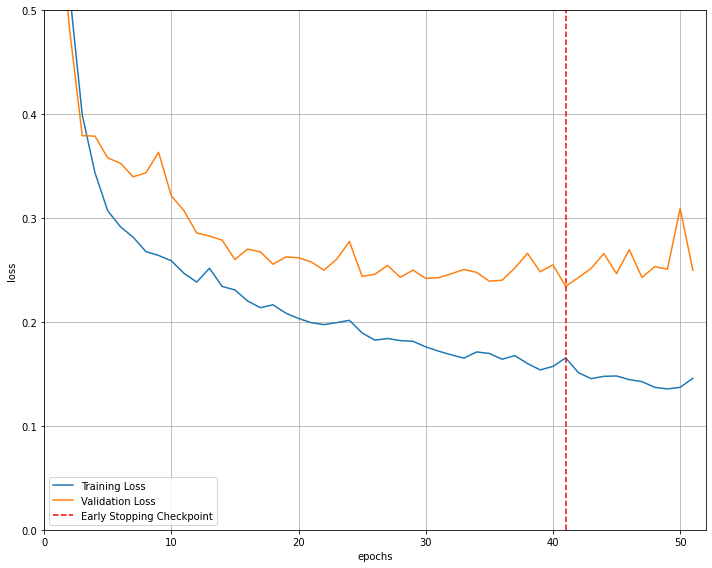

Input Image


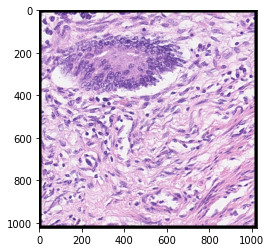

Predicted Mask Sigmoid


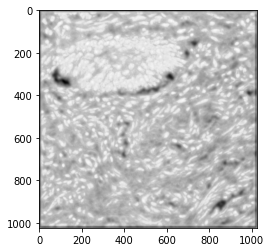

Predicted Mask Binary


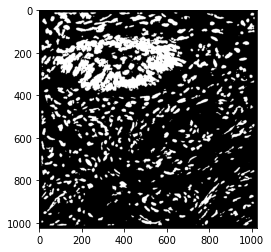

Actual Mask


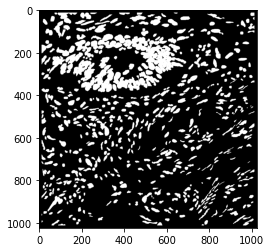

iou score: 0.677808646990516
AJI score: 0.677808646990516
AJI+ score: 0.677808646990516
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6778079691825469
Panoptic Quality (PQ): 0.6778079691825469
Dice2 score: 0.807968951890075 

Batch size: 4, Learning rate: 1e-05 , Epochs: 60







  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.761947).  Saving model ...






  2%|▏         | 1/60 [00:17<16:43, 17.01s/it]

Train Epoch: 1 @ 23:01:16.667331 - Train Loss: 0.7467 - Valid Loss: 0.7619
Validation loss decreased (0.761947 --> 0.731780).  Saving model ...






  3%|▎         | 2/60 [00:34<16:26, 17.01s/it]

Train Epoch: 2 @ 23:01:33.681450 - Train Loss: 0.7284 - Valid Loss: 0.7318
Validation loss decreased (0.731780 --> 0.693819).  Saving model ...






  5%|▌         | 3/60 [00:51<16:12, 17.06s/it]

Train Epoch: 3 @ 23:01:50.834345 - Train Loss: 0.7060 - Valid Loss: 0.6938
Validation loss decreased (0.693819 --> 0.648242).  Saving model ...






  7%|▋         | 4/60 [01:08<15:58, 17.11s/it]

Train Epoch: 4 @ 23:02:08.064623 - Train Loss: 0.6778 - Valid Loss: 0.6482
Validation loss decreased (0.648242 --> 0.588351).  Saving model ...






  8%|▊         | 5/60 [01:25<15:42, 17.14s/it]

Train Epoch: 5 @ 23:02:25.282344 - Train Loss: 0.6348 - Valid Loss: 0.5884
Validation loss decreased (0.588351 --> 0.539709).  Saving model ...






 10%|█         | 6/60 [01:42<15:27, 17.18s/it]

Train Epoch: 6 @ 23:02:42.546538 - Train Loss: 0.5801 - Valid Loss: 0.5397
Validation loss decreased (0.539709 --> 0.494180).  Saving model ...






 12%|█▏        | 7/60 [02:00<15:09, 17.17s/it]

Train Epoch: 7 @ 23:02:59.684481 - Train Loss: 0.5272 - Valid Loss: 0.4942
Validation loss decreased (0.494180 --> 0.450139).  Saving model ...






 13%|█▎        | 8/60 [02:17<14:51, 17.15s/it]

Train Epoch: 8 @ 23:03:16.805775 - Train Loss: 0.4818 - Valid Loss: 0.4501
Validation loss decreased (0.450139 --> 0.418290).  Saving model ...






 15%|█▌        | 9/60 [02:34<14:35, 17.17s/it]

Train Epoch: 9 @ 23:03:34.018488 - Train Loss: 0.4524 - Valid Loss: 0.4183
Validation loss decreased (0.418290 --> 0.393087).  Saving model ...






 17%|█▋        | 10/60 [02:51<14:19, 17.20s/it]

Train Epoch: 10 @ 23:03:51.277778 - Train Loss: 0.4351 - Valid Loss: 0.3931
Validation loss decreased (0.393087 --> 0.360844).  Saving model ...






 18%|█▊        | 11/60 [03:08<14:01, 17.18s/it]

Train Epoch: 11 @ 23:04:08.418674 - Train Loss: 0.4214 - Valid Loss: 0.3608






 20%|██        | 12/60 [03:25<13:37, 17.03s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 23:04:25.103167 - Train Loss: 0.4131 - Valid Loss: 0.4284






 22%|██▏       | 13/60 [03:42<13:17, 16.96s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 13 @ 23:04:41.892657 - Train Loss: 0.3957 - Valid Loss: 0.3787






 23%|██▎       | 14/60 [03:58<12:57, 16.89s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 14 @ 23:04:58.626663 - Train Loss: 0.3889 - Valid Loss: 0.3897






 25%|██▌       | 15/60 [04:15<12:36, 16.82s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 15 @ 23:05:15.286170 - Train Loss: 0.3842 - Valid Loss: 0.3820
Validation loss decreased (0.360844 --> 0.359873).  Saving model ...






 27%|██▋       | 16/60 [04:32<12:23, 16.89s/it]

Train Epoch: 16 @ 23:05:32.324206 - Train Loss: 0.3841 - Valid Loss: 0.3599






 28%|██▊       | 17/60 [04:49<12:04, 16.86s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 17 @ 23:05:49.115852 - Train Loss: 0.3667 - Valid Loss: 0.3987






 30%|███       | 18/60 [05:06<11:46, 16.82s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 18 @ 23:06:05.861567 - Train Loss: 0.3558 - Valid Loss: 0.3748
Validation loss decreased (0.359873 --> 0.345956).  Saving model ...






 32%|███▏      | 19/60 [05:23<11:32, 16.89s/it]

Train Epoch: 19 @ 23:06:22.897325 - Train Loss: 0.3552 - Valid Loss: 0.3460
Validation loss decreased (0.345956 --> 0.330855).  Saving model ...






 33%|███▎      | 20/60 [05:40<11:17, 16.95s/it]

Train Epoch: 20 @ 23:06:39.987108 - Train Loss: 0.3474 - Valid Loss: 0.3309






 35%|███▌      | 21/60 [05:57<10:59, 16.92s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 21 @ 23:06:56.828788 - Train Loss: 0.3436 - Valid Loss: 0.3439






 37%|███▋      | 22/60 [06:13<10:40, 16.86s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 22 @ 23:07:13.549611 - Train Loss: 0.3384 - Valid Loss: 0.3421






 38%|███▊      | 23/60 [06:30<10:21, 16.80s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 23 @ 23:07:30.199305 - Train Loss: 0.3346 - Valid Loss: 0.3499
Validation loss decreased (0.330855 --> 0.328935).  Saving model ...






 40%|████      | 24/60 [06:47<10:07, 16.88s/it]

Train Epoch: 24 @ 23:07:47.286069 - Train Loss: 0.3323 - Valid Loss: 0.3289






 42%|████▏     | 25/60 [07:04<09:50, 16.87s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 25 @ 23:08:04.133808 - Train Loss: 0.3277 - Valid Loss: 0.3427






 43%|████▎     | 26/60 [07:21<09:32, 16.85s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 26 @ 23:08:20.922169 - Train Loss: 0.3246 - Valid Loss: 0.3349






 45%|████▌     | 27/60 [07:38<09:15, 16.83s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 27 @ 23:08:37.715999 - Train Loss: 0.3209 - Valid Loss: 0.3567
Validation loss decreased (0.328935 --> 0.321927).  Saving model ...






 47%|████▋     | 28/60 [07:55<09:01, 16.91s/it]

Train Epoch: 28 @ 23:08:54.821075 - Train Loss: 0.3211 - Valid Loss: 0.3219






 48%|████▊     | 29/60 [08:11<08:42, 16.85s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 29 @ 23:09:11.508127 - Train Loss: 0.3153 - Valid Loss: 0.3410






 50%|█████     | 30/60 [08:28<08:23, 16.79s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 30 @ 23:09:28.183727 - Train Loss: 0.3136 - Valid Loss: 0.3591






 52%|█████▏    | 31/60 [08:45<08:07, 16.79s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 31 @ 23:09:44.975503 - Train Loss: 0.3115 - Valid Loss: 0.3393






 53%|█████▎    | 32/60 [09:02<07:49, 16.77s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 32 @ 23:10:01.695755 - Train Loss: 0.3091 - Valid Loss: 0.3457






 55%|█████▌    | 33/60 [09:18<07:31, 16.73s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 33 @ 23:10:18.342108 - Train Loss: 0.3062 - Valid Loss: 0.3328






 57%|█████▋    | 34/60 [09:35<07:14, 16.72s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 34 @ 23:10:35.024118 - Train Loss: 0.3033 - Valid Loss: 0.3268






 58%|█████▊    | 35/60 [09:52<06:58, 16.74s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 35 @ 23:10:51.806091 - Train Loss: 0.3005 - Valid Loss: 0.3366






 60%|██████    | 36/60 [10:08<06:41, 16.74s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 36 @ 23:11:08.536911 - Train Loss: 0.2991 - Valid Loss: 0.3528






 62%|██████▏   | 37/60 [10:25<06:24, 16.72s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 37 @ 23:11:25.205493 - Train Loss: 0.2992 - Valid Loss: 0.3427
Validation loss decreased (0.321927 --> 0.317830).  Saving model ...






 63%|██████▎   | 38/60 [10:42<06:10, 16.83s/it]

Train Epoch: 38 @ 23:11:42.314093 - Train Loss: 0.2942 - Valid Loss: 0.3178
Validation loss decreased (0.317830 --> 0.313715).  Saving model ...






 65%|██████▌   | 39/60 [11:00<05:57, 17.00s/it]

Train Epoch: 39 @ 23:11:59.706332 - Train Loss: 0.2920 - Valid Loss: 0.3137






 67%|██████▋   | 40/60 [11:16<05:38, 16.93s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 40 @ 23:12:16.462780 - Train Loss: 0.2898 - Valid Loss: 0.3208






 68%|██████▊   | 41/60 [11:33<05:20, 16.85s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 41 @ 23:12:33.117513 - Train Loss: 0.2863 - Valid Loss: 0.3332






 70%|███████   | 42/60 [11:50<05:02, 16.81s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 42 @ 23:12:49.844206 - Train Loss: 0.2845 - Valid Loss: 0.3375






 72%|███████▏  | 43/60 [12:07<04:45, 16.81s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 43 @ 23:13:06.670035 - Train Loss: 0.2810 - Valid Loss: 0.3398






 73%|███████▎  | 44/60 [12:23<04:28, 16.81s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 44 @ 23:13:23.461825 - Train Loss: 0.2777 - Valid Loss: 0.3394






 75%|███████▌  | 45/60 [12:40<04:12, 16.81s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 45 @ 23:13:40.269537 - Train Loss: 0.2761 - Valid Loss: 0.3317






 77%|███████▋  | 46/60 [12:57<03:54, 16.77s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 46 @ 23:13:56.952006 - Train Loss: 0.2740 - Valid Loss: 0.3302






 78%|███████▊  | 47/60 [13:13<03:37, 16.73s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 47 @ 23:14:13.595531 - Train Loss: 0.2752 - Valid Loss: 0.3671






 80%|████████  | 48/60 [13:30<03:20, 16.74s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 48 @ 23:14:30.346172 - Train Loss: 0.2712 - Valid Loss: 0.3165
EarlyStopping counter: 10 out of 10
Early stopping


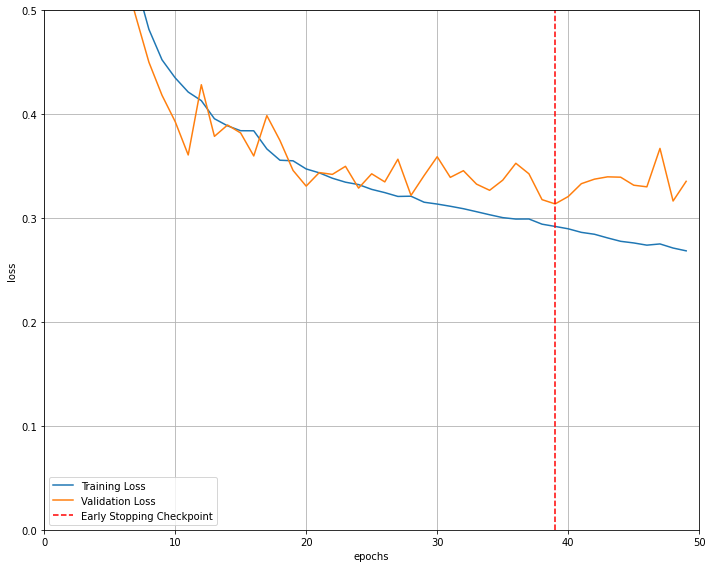

Input Image


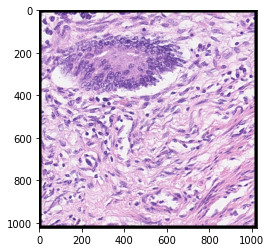

Predicted Mask Sigmoid


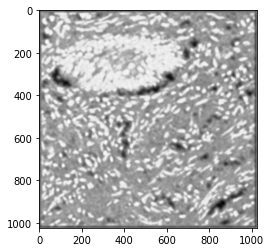

Predicted Mask Binary


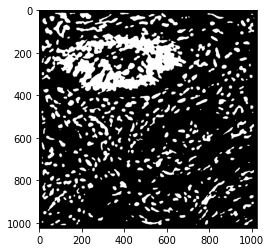

Actual Mask


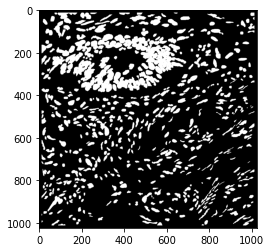

iou score: 0.6348916770483394
AJI score: 0.6348916770483394
AJI+ score: 0.6348916770483394
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6348910421572973
Panoptic Quality (PQ): 0.6348910421572973
Dice2 score: 0.7766773615174106 

Batch size: 8, Learning rate: 0.001 , Epochs: 60








  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.681815).  Saving model ...







  2%|▏         | 1/60 [00:16<16:19, 16.60s/it]

Train Epoch: 1 @ 23:15:06.487093 - Train Loss: 0.5952 - Valid Loss: 0.6818
Validation loss decreased (0.681815 --> 0.373383).  Saving model ...







  3%|▎         | 2/60 [00:33<16:01, 16.58s/it]

Train Epoch: 2 @ 23:15:23.033664 - Train Loss: 0.4146 - Valid Loss: 0.3734







  5%|▌         | 3/60 [00:49<15:40, 16.51s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 3 @ 23:15:39.362680 - Train Loss: 0.3574 - Valid Loss: 0.7181







  7%|▋         | 4/60 [01:05<15:20, 16.43s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 4 @ 23:15:55.618835 - Train Loss: 0.3239 - Valid Loss: 0.3939
Validation loss decreased (0.373383 --> 0.289218).  Saving model ...







  8%|▊         | 5/60 [01:22<15:06, 16.47s/it]

Train Epoch: 5 @ 23:16:12.187072 - Train Loss: 0.2760 - Valid Loss: 0.2892







 10%|█         | 6/60 [01:38<14:45, 16.39s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 23:16:28.396703 - Train Loss: 0.2660 - Valid Loss: 0.3747







 12%|█▏        | 7/60 [01:54<14:25, 16.34s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 7 @ 23:16:44.597902 - Train Loss: 0.2520 - Valid Loss: 0.3284







 13%|█▎        | 8/60 [02:11<14:09, 16.33s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 8 @ 23:17:00.918264 - Train Loss: 0.2439 - Valid Loss: 0.3065







 15%|█▌        | 9/60 [02:27<13:50, 16.28s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 9 @ 23:17:17.089420 - Train Loss: 0.2468 - Valid Loss: 0.3634







 17%|█▋        | 10/60 [02:43<13:31, 16.24s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 10 @ 23:17:33.214545 - Train Loss: 0.2375 - Valid Loss: 0.3482
Validation loss decreased (0.289218 --> 0.287341).  Saving model ...







 18%|█▊        | 11/60 [02:59<13:21, 16.35s/it]

Train Epoch: 11 @ 23:17:49.833826 - Train Loss: 0.2293 - Valid Loss: 0.2873
Validation loss decreased (0.287341 --> 0.256424).  Saving model ...







 20%|██        | 12/60 [03:16<13:10, 16.46s/it]

Train Epoch: 12 @ 23:18:06.540057 - Train Loss: 0.2157 - Valid Loss: 0.2564







 22%|██▏       | 13/60 [03:32<12:48, 16.36s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 13 @ 23:18:22.669910 - Train Loss: 0.2090 - Valid Loss: 0.3204







 23%|██▎       | 14/60 [03:48<12:29, 16.29s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 14 @ 23:18:38.797223 - Train Loss: 0.2113 - Valid Loss: 0.2633







 25%|██▌       | 15/60 [04:05<12:11, 16.27s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 15 @ 23:18:55.008209 - Train Loss: 0.2043 - Valid Loss: 0.2584







 27%|██▋       | 16/60 [04:21<11:56, 16.28s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 16 @ 23:19:11.313617 - Train Loss: 0.2102 - Valid Loss: 0.4526







 28%|██▊       | 17/60 [04:37<11:38, 16.25s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 17 @ 23:19:27.499556 - Train Loss: 0.2427 - Valid Loss: 0.2643







 30%|███       | 18/60 [04:53<11:21, 16.24s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 18 @ 23:19:43.702539 - Train Loss: 0.2201 - Valid Loss: 0.2746







 32%|███▏      | 19/60 [05:09<11:04, 16.20s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 19 @ 23:19:59.817681 - Train Loss: 0.2049 - Valid Loss: 0.3054
Validation loss decreased (0.256424 --> 0.235215).  Saving model ...







 33%|███▎      | 20/60 [05:26<10:51, 16.30s/it]

Train Epoch: 20 @ 23:20:16.342520 - Train Loss: 0.2002 - Valid Loss: 0.2352







 35%|███▌      | 21/60 [05:42<10:34, 16.28s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 21 @ 23:20:32.577745 - Train Loss: 0.1941 - Valid Loss: 0.2885
Validation loss decreased (0.235215 --> 0.222039).  Saving model ...







 37%|███▋      | 22/60 [05:59<10:23, 16.40s/it]

Train Epoch: 22 @ 23:20:49.265293 - Train Loss: 0.1787 - Valid Loss: 0.2220







 38%|███▊      | 23/60 [06:15<10:04, 16.33s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 23 @ 23:21:05.438657 - Train Loss: 0.1699 - Valid Loss: 0.2850







 40%|████      | 24/60 [06:31<09:45, 16.26s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 24 @ 23:21:21.534901 - Train Loss: 0.1732 - Valid Loss: 0.2615







 42%|████▏     | 25/60 [06:47<09:28, 16.23s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 25 @ 23:21:37.698418 - Train Loss: 0.1773 - Valid Loss: 0.2563







 43%|████▎     | 26/60 [07:04<09:11, 16.23s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 26 @ 23:21:53.920723 - Train Loss: 0.1695 - Valid Loss: 0.3051







 45%|████▌     | 27/60 [07:20<08:54, 16.21s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 27 @ 23:22:10.072984 - Train Loss: 0.1742 - Valid Loss: 0.2390







 47%|████▋     | 28/60 [07:36<08:37, 16.16s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 28 @ 23:22:26.113937 - Train Loss: 0.1606 - Valid Loss: 0.2459







 48%|████▊     | 29/60 [07:52<08:21, 16.16s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 29 @ 23:22:42.295029 - Train Loss: 0.1501 - Valid Loss: 0.2470







 50%|█████     | 30/60 [08:08<08:05, 16.18s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 30 @ 23:22:58.520616 - Train Loss: 0.1497 - Valid Loss: 0.2417







 52%|█████▏    | 31/60 [08:24<07:48, 16.16s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 31 @ 23:23:14.621589 - Train Loss: 0.1459 - Valid Loss: 0.2615
EarlyStopping counter: 10 out of 10
Early stopping


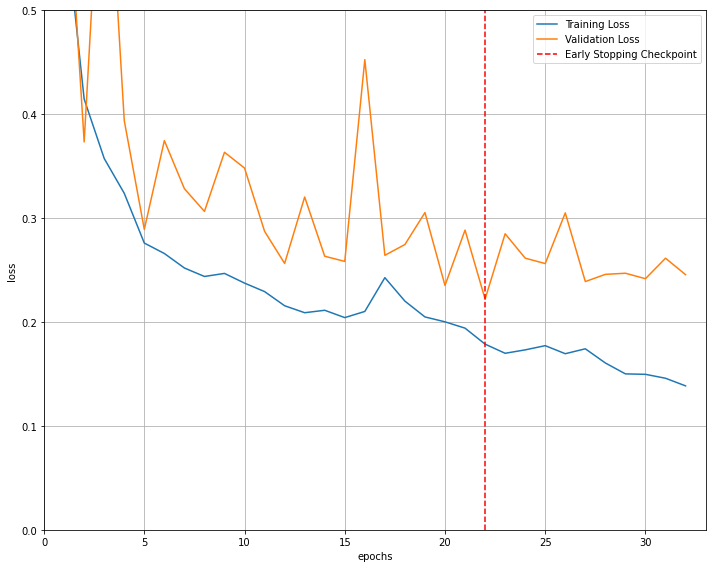

Input Image


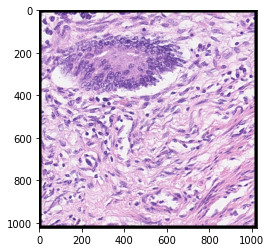

Predicted Mask Sigmoid


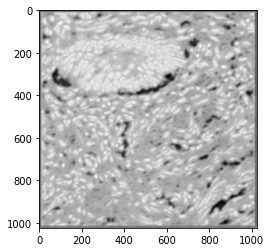

Predicted Mask Binary


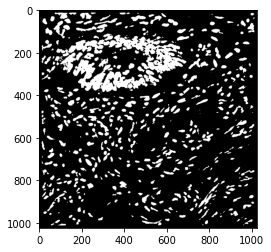

Actual Mask


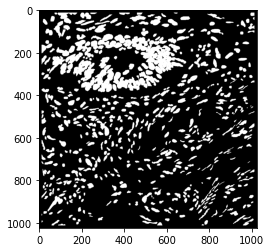

iou score: 0.6672030574273358
AJI score: 0.6672030574273358
AJI+ score: 0.6672030574273358
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6672023902249455
Panoptic Quality (PQ): 0.6672023902249455
Dice2 score: 0.8003860770947698 

Batch size: 8, Learning rate: 0.0001 , Epochs: 60









  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.667491).  Saving model ...








  2%|▏         | 1/60 [00:17<16:43, 17.01s/it]

Train Epoch: 1 @ 23:23:50.447259 - Train Loss: 0.7126 - Valid Loss: 0.6675
Validation loss decreased (0.667491 --> 0.388468).  Saving model ...








  3%|▎         | 2/60 [00:34<16:29, 17.05s/it]

Train Epoch: 2 @ 23:24:07.596139 - Train Loss: 0.5398 - Valid Loss: 0.3885
Validation loss decreased (0.388468 --> 0.327029).  Saving model ...








  5%|▌         | 3/60 [00:51<16:12, 17.06s/it]

Train Epoch: 3 @ 23:24:24.687600 - Train Loss: 0.4404 - Valid Loss: 0.3270
Validation loss decreased (0.327029 --> 0.302937).  Saving model ...








  7%|▋         | 4/60 [01:08<15:55, 17.06s/it]

Train Epoch: 4 @ 23:24:41.753196 - Train Loss: 0.3913 - Valid Loss: 0.3029
Validation loss decreased (0.302937 --> 0.286685).  Saving model ...








  8%|▊         | 5/60 [01:25<15:36, 17.03s/it]

Train Epoch: 5 @ 23:24:58.710523 - Train Loss: 0.3614 - Valid Loss: 0.2867








 10%|█         | 6/60 [01:41<15:11, 16.88s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 23:25:15.218375 - Train Loss: 0.3462 - Valid Loss: 0.2907








 12%|█▏        | 7/60 [01:58<14:49, 16.78s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 7 @ 23:25:31.788177 - Train Loss: 0.3054 - Valid Loss: 0.2983








 13%|█▎        | 8/60 [02:14<14:30, 16.73s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 8 @ 23:25:48.397658 - Train Loss: 0.3016 - Valid Loss: 0.2879








 15%|█▌        | 9/60 [02:31<14:09, 16.65s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 9 @ 23:26:04.861197 - Train Loss: 0.2804 - Valid Loss: 0.3078
Validation loss decreased (0.286685 --> 0.277163).  Saving model ...








 17%|█▋        | 10/60 [02:48<13:55, 16.72s/it]

Train Epoch: 10 @ 23:26:21.738959 - Train Loss: 0.2655 - Valid Loss: 0.2772








 18%|█▊        | 11/60 [03:04<13:38, 16.69s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 11 @ 23:26:38.374465 - Train Loss: 0.2530 - Valid Loss: 0.2806








 20%|██        | 12/60 [03:21<13:20, 16.68s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 12 @ 23:26:55.020012 - Train Loss: 0.2449 - Valid Loss: 0.2784








 22%|██▏       | 13/60 [03:38<13:01, 16.63s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 13 @ 23:27:11.528362 - Train Loss: 0.2379 - Valid Loss: 0.2777
Validation loss decreased (0.277163 --> 0.268462).  Saving model ...








 23%|██▎       | 14/60 [03:55<12:48, 16.71s/it]

Train Epoch: 14 @ 23:27:28.442657 - Train Loss: 0.2353 - Valid Loss: 0.2685








 25%|██▌       | 15/60 [04:11<12:30, 16.68s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 15 @ 23:27:45.034175 - Train Loss: 0.2280 - Valid Loss: 0.2780








 27%|██▋       | 16/60 [04:28<12:13, 16.66s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 16 @ 23:28:01.651270 - Train Loss: 0.2294 - Valid Loss: 0.2752








 28%|██▊       | 17/60 [04:44<11:53, 16.60s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 17 @ 23:28:18.123163 - Train Loss: 0.2245 - Valid Loss: 0.2979
Validation loss decreased (0.268462 --> 0.260720).  Saving model ...








 30%|███       | 18/60 [05:01<11:41, 16.71s/it]

Train Epoch: 18 @ 23:28:35.072074 - Train Loss: 0.2149 - Valid Loss: 0.2607
Validation loss decreased (0.260720 --> 0.260533).  Saving model ...








 32%|███▏      | 19/60 [05:18<11:31, 16.85s/it]

Train Epoch: 19 @ 23:28:52.269050 - Train Loss: 0.2069 - Valid Loss: 0.2605








 33%|███▎      | 20/60 [05:35<11:13, 16.84s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 20 @ 23:29:09.067512 - Train Loss: 0.2071 - Valid Loss: 0.2646








 35%|███▌      | 21/60 [05:52<10:54, 16.77s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 21 @ 23:29:25.678800 - Train Loss: 0.2102 - Valid Loss: 0.2727
Validation loss decreased (0.260533 --> 0.246877).  Saving model ...








 37%|███▋      | 22/60 [06:09<10:39, 16.83s/it]

Train Epoch: 22 @ 23:29:42.640609 - Train Loss: 0.1996 - Valid Loss: 0.2469








 38%|███▊      | 23/60 [06:25<10:21, 16.79s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 23 @ 23:29:59.334066 - Train Loss: 0.1951 - Valid Loss: 0.2628








 40%|████      | 24/60 [06:42<10:03, 16.75s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 24 @ 23:30:16.011388 - Train Loss: 0.1898 - Valid Loss: 0.2567
Validation loss decreased (0.246877 --> 0.244143).  Saving model ...








 42%|████▏     | 25/60 [06:59<09:50, 16.87s/it]

Train Epoch: 25 @ 23:30:33.165068 - Train Loss: 0.1836 - Valid Loss: 0.2441








 43%|████▎     | 26/60 [07:16<09:32, 16.85s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 26 @ 23:30:49.945698 - Train Loss: 0.1801 - Valid Loss: 0.2682








 45%|████▌     | 27/60 [07:33<09:14, 16.79s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 27 @ 23:31:06.603377 - Train Loss: 0.1853 - Valid Loss: 0.2607
Validation loss decreased (0.244143 --> 0.238742).  Saving model ...








 47%|████▋     | 28/60 [07:50<08:59, 16.85s/it]

Train Epoch: 28 @ 23:31:23.579569 - Train Loss: 0.1799 - Valid Loss: 0.2387








 48%|████▊     | 29/60 [08:06<08:41, 16.81s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 29 @ 23:31:40.307403 - Train Loss: 0.1754 - Valid Loss: 0.2461








 50%|█████     | 30/60 [08:23<08:23, 16.77s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 30 @ 23:31:56.985984 - Train Loss: 0.1785 - Valid Loss: 0.2564








 52%|█████▏    | 31/60 [08:40<08:04, 16.71s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 31 @ 23:32:13.561298 - Train Loss: 0.1784 - Valid Loss: 0.2514








 53%|█████▎    | 32/60 [08:56<07:46, 16.67s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 32 @ 23:32:30.135472 - Train Loss: 0.1662 - Valid Loss: 0.2529








 55%|█████▌    | 33/60 [09:13<07:30, 16.70s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 33 @ 23:32:46.891145 - Train Loss: 0.1620 - Valid Loss: 0.2551
Validation loss decreased (0.238742 --> 0.232520).  Saving model ...








 57%|█████▋    | 34/60 [09:30<07:17, 16.82s/it]

Train Epoch: 34 @ 23:33:04.007153 - Train Loss: 0.1617 - Valid Loss: 0.2325








 58%|█████▊    | 35/60 [09:47<06:59, 16.76s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 35 @ 23:33:20.638894 - Train Loss: 0.1631 - Valid Loss: 0.2547








 60%|██████    | 36/60 [10:03<06:40, 16.70s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 36 @ 23:33:37.197642 - Train Loss: 0.1684 - Valid Loss: 0.2582








 62%|██████▏   | 37/60 [10:20<06:24, 16.71s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 37 @ 23:33:53.916910 - Train Loss: 0.1531 - Valid Loss: 0.2555








 63%|██████▎   | 38/60 [10:37<06:07, 16.71s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 38 @ 23:34:10.641651 - Train Loss: 0.1506 - Valid Loss: 0.2526








 65%|██████▌   | 39/60 [10:53<05:50, 16.67s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 39 @ 23:34:27.217687 - Train Loss: 0.1498 - Valid Loss: 0.2491








 67%|██████▋   | 40/60 [11:10<05:32, 16.64s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 40 @ 23:34:43.785467 - Train Loss: 0.1495 - Valid Loss: 0.2581








 68%|██████▊   | 41/60 [11:27<05:16, 16.66s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 41 @ 23:35:00.497363 - Train Loss: 0.1515 - Valid Loss: 0.2350








 70%|███████   | 42/60 [11:43<04:59, 16.67s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 42 @ 23:35:17.172582 - Train Loss: 0.1480 - Valid Loss: 0.2741








 72%|███████▏  | 43/60 [12:00<04:43, 16.69s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 43 @ 23:35:33.920618 - Train Loss: 0.1432 - Valid Loss: 0.2568
EarlyStopping counter: 10 out of 10
Early stopping


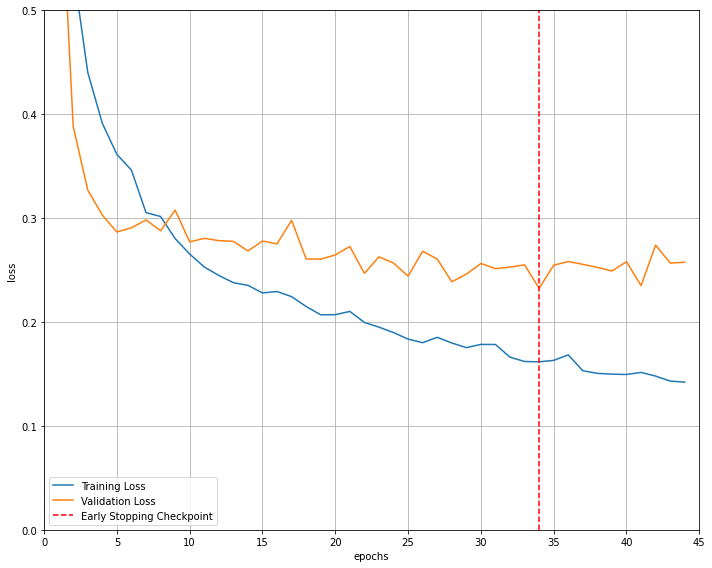

Input Image


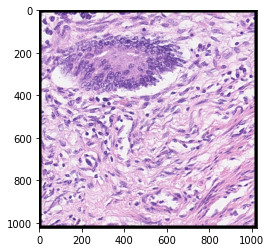

Predicted Mask Sigmoid


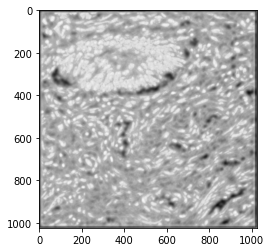

Predicted Mask Binary


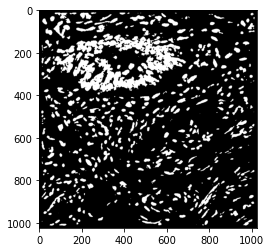

Actual Mask


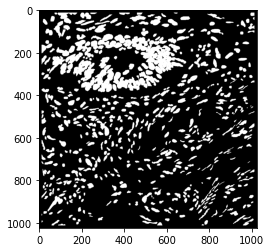

iou score: 0.6535999068738723
AJI score: 0.6535999068738723
AJI+ score: 0.6535999068738723
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.653599253274619
Panoptic Quality (PQ): 0.653599253274619
Dice2 score: 0.7905175903275198 

Batch size: 8, Learning rate: 1e-05 , Epochs: 60










  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.718255).  Saving model ...









  2%|▏         | 1/60 [00:16<16:39, 16.94s/it]

Train Epoch: 1 @ 23:36:10.312423 - Train Loss: 0.7562 - Valid Loss: 0.7183
Validation loss decreased (0.718255 --> 0.705194).  Saving model ...









  3%|▎         | 2/60 [00:34<16:25, 17.00s/it]

Train Epoch: 2 @ 23:36:27.427910 - Train Loss: 0.7445 - Valid Loss: 0.7052
Validation loss decreased (0.705194 --> 0.680013).  Saving model ...









  5%|▌         | 3/60 [00:51<16:12, 17.06s/it]

Train Epoch: 3 @ 23:36:44.633982 - Train Loss: 0.7279 - Valid Loss: 0.6800
Validation loss decreased (0.680013 --> 0.651379).  Saving model ...









  7%|▋         | 4/60 [01:08<15:55, 17.06s/it]

Train Epoch: 4 @ 23:37:01.710168 - Train Loss: 0.7059 - Valid Loss: 0.6514
Validation loss decreased (0.651379 --> 0.613293).  Saving model ...









  8%|▊         | 5/60 [01:25<15:39, 17.09s/it]

Train Epoch: 5 @ 23:37:18.859250 - Train Loss: 0.6827 - Valid Loss: 0.6133
Validation loss decreased (0.613293 --> 0.565695).  Saving model ...









 10%|█         | 6/60 [01:42<15:23, 17.11s/it]

Train Epoch: 6 @ 23:37:36.011713 - Train Loss: 0.6513 - Valid Loss: 0.5657
Validation loss decreased (0.565695 --> 0.511563).  Saving model ...









 12%|█▏        | 7/60 [01:59<15:08, 17.14s/it]

Train Epoch: 7 @ 23:37:53.224428 - Train Loss: 0.6126 - Valid Loss: 0.5116
Validation loss decreased (0.511563 --> 0.449445).  Saving model ...









 13%|█▎        | 8/60 [02:17<14:51, 17.14s/it]

Train Epoch: 8 @ 23:38:10.381088 - Train Loss: 0.5695 - Valid Loss: 0.4494
Validation loss decreased (0.449445 --> 0.395706).  Saving model ...









 15%|█▌        | 9/60 [02:34<14:33, 17.13s/it]

Train Epoch: 9 @ 23:38:27.487449 - Train Loss: 0.5279 - Valid Loss: 0.3957
Validation loss decreased (0.395706 --> 0.362869).  Saving model ...









 17%|█▋        | 10/60 [02:51<14:17, 17.14s/it]

Train Epoch: 10 @ 23:38:44.655577 - Train Loss: 0.4871 - Valid Loss: 0.3629
Validation loss decreased (0.362869 --> 0.336905).  Saving model ...









 18%|█▊        | 11/60 [03:08<14:01, 17.18s/it]

Train Epoch: 11 @ 23:39:01.907093 - Train Loss: 0.4601 - Valid Loss: 0.3369
Validation loss decreased (0.336905 --> 0.329451).  Saving model ...









 20%|██        | 12/60 [03:25<13:43, 17.16s/it]

Train Epoch: 12 @ 23:39:19.044078 - Train Loss: 0.4359 - Valid Loss: 0.3295
Validation loss decreased (0.329451 --> 0.323440).  Saving model ...









 22%|██▏       | 13/60 [03:42<13:26, 17.16s/it]

Train Epoch: 13 @ 23:39:36.190476 - Train Loss: 0.4190 - Valid Loss: 0.3234
Validation loss decreased (0.323440 --> 0.322435).  Saving model ...









 23%|██▎       | 14/60 [04:00<13:10, 17.19s/it]

Train Epoch: 14 @ 23:39:53.454525 - Train Loss: 0.4051 - Valid Loss: 0.3224
Validation loss decreased (0.322435 --> 0.321829).  Saving model ...









 25%|██▌       | 15/60 [04:17<12:53, 17.19s/it]

Train Epoch: 15 @ 23:40:10.661781 - Train Loss: 0.3992 - Valid Loss: 0.3218









 27%|██▋       | 16/60 [04:34<12:31, 17.07s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 16 @ 23:40:27.455640 - Train Loss: 0.3831 - Valid Loss: 0.3237
Validation loss decreased (0.321829 --> 0.320563).  Saving model ...









 28%|██▊       | 17/60 [04:51<12:14, 17.08s/it]

Train Epoch: 17 @ 23:40:44.544459 - Train Loss: 0.3748 - Valid Loss: 0.3206









 30%|███       | 18/60 [05:08<11:54, 17.00s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 18 @ 23:41:01.371367 - Train Loss: 0.3699 - Valid Loss: 0.3209









 32%|███▏      | 19/60 [05:24<11:34, 16.93s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 19 @ 23:41:18.135981 - Train Loss: 0.3623 - Valid Loss: 0.3239









 33%|███▎      | 20/60 [05:41<11:15, 16.89s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 20 @ 23:41:34.929793 - Train Loss: 0.3578 - Valid Loss: 0.3353
Validation loss decreased (0.320563 --> 0.319934).  Saving model ...









 35%|███▌      | 21/60 [05:58<11:02, 16.98s/it]

Train Epoch: 21 @ 23:41:52.102564 - Train Loss: 0.3550 - Valid Loss: 0.3199









 37%|███▋      | 22/60 [06:15<10:42, 16.90s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 22 @ 23:42:08.821246 - Train Loss: 0.3451 - Valid Loss: 0.3254









 38%|███▊      | 23/60 [06:32<10:22, 16.83s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 23 @ 23:42:25.496398 - Train Loss: 0.3407 - Valid Loss: 0.3245









 40%|████      | 24/60 [06:48<10:05, 16.83s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 24 @ 23:42:42.311658 - Train Loss: 0.3420 - Valid Loss: 0.3247









 42%|████▏     | 25/60 [07:05<09:48, 16.81s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 25 @ 23:42:59.096679 - Train Loss: 0.3305 - Valid Loss: 0.3275
Validation loss decreased (0.319934 --> 0.317743).  Saving model ...









 43%|████▎     | 26/60 [07:22<09:35, 16.93s/it]

Train Epoch: 26 @ 23:43:16.281716 - Train Loss: 0.3266 - Valid Loss: 0.3177









 45%|████▌     | 27/60 [07:39<09:16, 16.87s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 27 @ 23:43:33.028244 - Train Loss: 0.3223 - Valid Loss: 0.3250









 47%|████▋     | 28/60 [07:56<08:59, 16.86s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 28 @ 23:43:49.859030 - Train Loss: 0.3197 - Valid Loss: 0.3280
Validation loss decreased (0.317743 --> 0.315771).  Saving model ...









 48%|████▊     | 29/60 [08:13<08:45, 16.96s/it]

Train Epoch: 29 @ 23:44:07.043728 - Train Loss: 0.3160 - Valid Loss: 0.3158









 50%|█████     | 30/60 [08:30<08:27, 16.90s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 30 @ 23:44:23.813208 - Train Loss: 0.3123 - Valid Loss: 0.3326









 52%|█████▏    | 31/60 [08:47<08:08, 16.85s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 31 @ 23:44:40.542751 - Train Loss: 0.3070 - Valid Loss: 0.3240









 53%|█████▎    | 32/60 [09:04<07:51, 16.85s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 32 @ 23:44:57.389130 - Train Loss: 0.3047 - Valid Loss: 0.3181









 55%|█████▌    | 33/60 [09:20<07:34, 16.82s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 33 @ 23:45:14.146041 - Train Loss: 0.3033 - Valid Loss: 0.3183









 57%|█████▋    | 34/60 [09:37<07:16, 16.78s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 34 @ 23:45:30.826358 - Train Loss: 0.2992 - Valid Loss: 0.3199









 58%|█████▊    | 35/60 [09:54<06:58, 16.76s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 35 @ 23:45:47.535576 - Train Loss: 0.2963 - Valid Loss: 0.3208
Validation loss decreased (0.315771 --> 0.313338).  Saving model ...









 60%|██████    | 36/60 [10:11<06:45, 16.91s/it]

Train Epoch: 36 @ 23:46:04.807839 - Train Loss: 0.2929 - Valid Loss: 0.3133









 62%|██████▏   | 37/60 [10:28<06:28, 16.88s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 37 @ 23:46:21.621210 - Train Loss: 0.2927 - Valid Loss: 0.3182









 63%|██████▎   | 38/60 [10:45<06:10, 16.86s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 38 @ 23:46:38.420523 - Train Loss: 0.2888 - Valid Loss: 0.3178









 65%|██████▌   | 39/60 [11:01<05:53, 16.82s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 39 @ 23:46:55.140506 - Train Loss: 0.2863 - Valid Loss: 0.3172









 67%|██████▋   | 40/60 [11:18<05:35, 16.78s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 40 @ 23:47:11.827750 - Train Loss: 0.2846 - Valid Loss: 0.3220









 68%|██████▊   | 41/60 [11:35<05:18, 16.77s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 41 @ 23:47:28.576190 - Train Loss: 0.2820 - Valid Loss: 0.3166
Validation loss decreased (0.313338 --> 0.307323).  Saving model ...









 70%|███████   | 42/60 [11:52<05:04, 16.92s/it]

Train Epoch: 42 @ 23:47:45.848164 - Train Loss: 0.2812 - Valid Loss: 0.3073









 72%|███████▏  | 43/60 [12:09<04:46, 16.86s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 43 @ 23:48:02.585575 - Train Loss: 0.2790 - Valid Loss: 0.3130









 73%|███████▎  | 44/60 [12:25<04:28, 16.80s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 44 @ 23:48:19.242270 - Train Loss: 0.2753 - Valid Loss: 0.3081









 75%|███████▌  | 45/60 [12:42<04:11, 16.78s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 45 @ 23:48:35.963922 - Train Loss: 0.2764 - Valid Loss: 0.3200
Validation loss decreased (0.307323 --> 0.305349).  Saving model ...









 77%|███████▋  | 46/60 [12:59<03:56, 16.92s/it]

Train Epoch: 46 @ 23:48:53.229812 - Train Loss: 0.2720 - Valid Loss: 0.3053









 78%|███████▊  | 47/60 [13:16<03:39, 16.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 47 @ 23:49:10.024578 - Train Loss: 0.2717 - Valid Loss: 0.3081









 80%|████████  | 48/60 [13:33<03:21, 16.82s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 48 @ 23:49:26.689956 - Train Loss: 0.2697 - Valid Loss: 0.3065









 82%|████████▏ | 49/60 [13:50<03:04, 16.80s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 49 @ 23:49:43.435369 - Train Loss: 0.2688 - Valid Loss: 0.3116









 83%|████████▎ | 50/60 [14:06<02:48, 16.80s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 50 @ 23:50:00.255171 - Train Loss: 0.2668 - Valid Loss: 0.3063









 85%|████████▌ | 51/60 [14:23<02:30, 16.76s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 51 @ 23:50:16.924181 - Train Loss: 0.2647 - Valid Loss: 0.3063
Validation loss decreased (0.305349 --> 0.303324).  Saving model ...









 87%|████████▋ | 52/60 [14:40<02:14, 16.86s/it]

Train Epoch: 52 @ 23:50:34.010260 - Train Loss: 0.2641 - Valid Loss: 0.3033









 88%|████████▊ | 53/60 [14:57<01:57, 16.84s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 53 @ 23:50:50.797752 - Train Loss: 0.2635 - Valid Loss: 0.3090









 90%|█████████ | 54/60 [15:14<01:41, 16.84s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 54 @ 23:51:07.656942 - Train Loss: 0.2614 - Valid Loss: 0.3036
Validation loss decreased (0.303324 --> 0.302468).  Saving model ...









 92%|█████████▏| 55/60 [15:31<01:24, 16.95s/it]

Train Epoch: 55 @ 23:51:24.850581 - Train Loss: 0.2598 - Valid Loss: 0.3025









 93%|█████████▎| 56/60 [15:48<01:07, 16.92s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 56 @ 23:51:41.701778 - Train Loss: 0.2582 - Valid Loss: 0.3032
Validation loss decreased (0.302468 --> 0.300514).  Saving model ...









 95%|█████████▌| 57/60 [16:05<00:50, 16.96s/it]

Train Epoch: 57 @ 23:51:58.761372 - Train Loss: 0.2587 - Valid Loss: 0.3005
Validation loss decreased (0.300514 --> 0.299583).  Saving model ...









 97%|█████████▋| 58/60 [16:22<00:34, 17.01s/it]

Train Epoch: 58 @ 23:52:15.875114 - Train Loss: 0.2560 - Valid Loss: 0.2996









 98%|█████████▊| 59/60 [16:39<00:16, 16.95s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 59 @ 23:52:32.699373 - Train Loss: 0.2542 - Valid Loss: 0.3000









100%|██████████| 60/60 [16:56<00:00, 16.94s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 60 @ 23:52:49.511648 - Train Loss: 0.2535 - Valid Loss: 0.3022


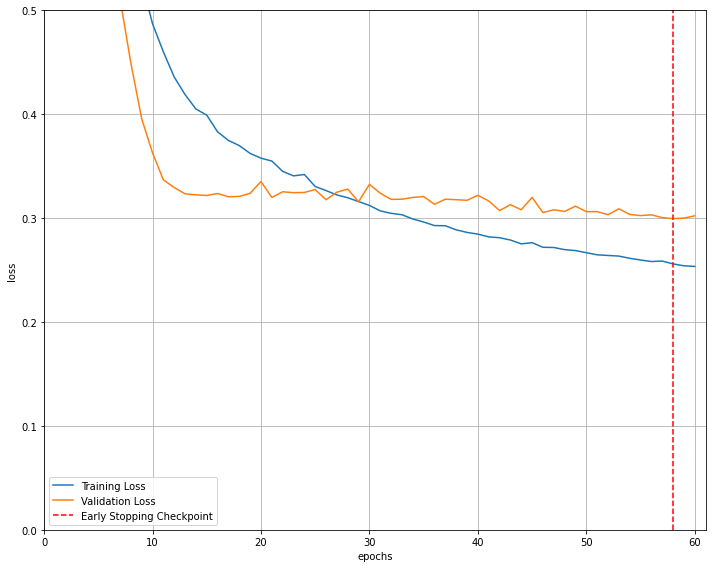

Input Image


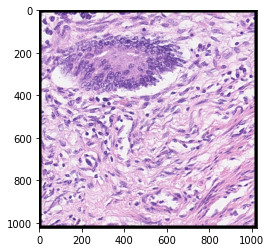

Predicted Mask Sigmoid


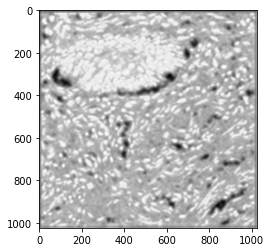

Predicted Mask Binary


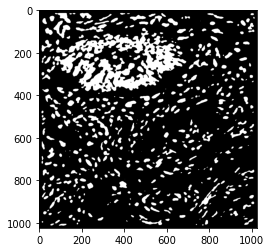

Actual Mask


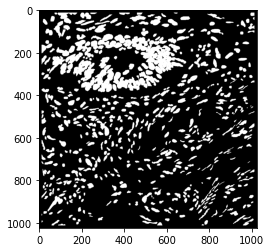

iou score: 0.617037627027741
AJI score: 0.617037627027741
AJI+ score: 0.617037627027741
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6170370099907311
Panoptic Quality (PQ): 0.6170370099907311
Dice2 score: 0.7631704008791818 

Batch size: 16, Learning rate: 0.001 , Epochs: 60










  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.514355).  Saving model ...









  2%|▏         | 1/60 [00:16<16:22, 16.65s/it]

Train Epoch: 1 @ 23:53:08.971117 - Train Loss: 0.6852 - Valid Loss: 0.5144
Validation loss decreased (0.514355 --> 0.377056).  Saving model ...









  3%|▎         | 2/60 [00:33<16:05, 16.65s/it]

Train Epoch: 2 @ 23:53:25.620450 - Train Loss: 0.4635 - Valid Loss: 0.3771
Validation loss decreased (0.377056 --> 0.329645).  Saving model ...









  5%|▌         | 3/60 [00:50<15:51, 16.69s/it]

Train Epoch: 3 @ 23:53:42.410426 - Train Loss: 0.3876 - Valid Loss: 0.3296









  7%|▋         | 4/60 [01:06<15:28, 16.57s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 4 @ 23:53:58.702640 - Train Loss: 0.3684 - Valid Loss: 0.4425









  8%|▊         | 5/60 [01:22<15:04, 16.44s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 5 @ 23:54:14.842526 - Train Loss: 0.3112 - Valid Loss: 0.3441
Validation loss decreased (0.329645 --> 0.287293).  Saving model ...









 10%|█         | 6/60 [01:39<14:48, 16.46s/it]

Train Epoch: 6 @ 23:54:31.327781 - Train Loss: 0.2897 - Valid Loss: 0.2873









 12%|█▏        | 7/60 [01:55<14:29, 16.40s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 23:54:47.614335 - Train Loss: 0.2759 - Valid Loss: 0.2923









 13%|█▎        | 8/60 [02:11<14:10, 16.35s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 8 @ 23:55:03.837334 - Train Loss: 0.2906 - Valid Loss: 0.5826









 15%|█▌        | 9/60 [02:27<13:49, 16.27s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 9 @ 23:55:19.927119 - Train Loss: 0.2698 - Valid Loss: 0.3311









 17%|█▋        | 10/60 [02:43<13:30, 16.21s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 10 @ 23:55:36.007537 - Train Loss: 0.2593 - Valid Loss: 0.2919
Validation loss decreased (0.287293 --> 0.275433).  Saving model ...









 18%|█▊        | 11/60 [03:00<13:20, 16.33s/it]

Train Epoch: 11 @ 23:55:52.611139 - Train Loss: 0.2603 - Valid Loss: 0.2754









 20%|██        | 12/60 [03:16<13:02, 16.31s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 23:56:08.856229 - Train Loss: 0.2529 - Valid Loss: 0.2982









 22%|██▏       | 13/60 [03:32<12:42, 16.23s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 13 @ 23:56:24.916815 - Train Loss: 0.2387 - Valid Loss: 0.3733









 23%|██▎       | 14/60 [03:48<12:24, 16.18s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 14 @ 23:56:40.986213 - Train Loss: 0.2385 - Valid Loss: 0.3351









 25%|██▌       | 15/60 [04:04<12:08, 16.18s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 15 @ 23:56:57.172874 - Train Loss: 0.2216 - Valid Loss: 0.3131









 27%|██▋       | 16/60 [04:21<11:52, 16.20s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 16 @ 23:57:13.402671 - Train Loss: 0.2166 - Valid Loss: 0.2831









 28%|██▊       | 17/60 [04:37<11:36, 16.20s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 17 @ 23:57:29.602338 - Train Loss: 0.2108 - Valid Loss: 0.3134









 30%|███       | 18/60 [04:53<11:22, 16.25s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 18 @ 23:57:45.960302 - Train Loss: 0.2089 - Valid Loss: 0.2780









 32%|███▏      | 19/60 [05:09<11:04, 16.22s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 19 @ 23:58:02.112968 - Train Loss: 0.2115 - Valid Loss: 0.2840









 33%|███▎      | 20/60 [05:25<10:47, 16.18s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 20 @ 23:58:18.215370 - Train Loss: 0.2051 - Valid Loss: 0.2850
EarlyStopping counter: 10 out of 10
Early stopping


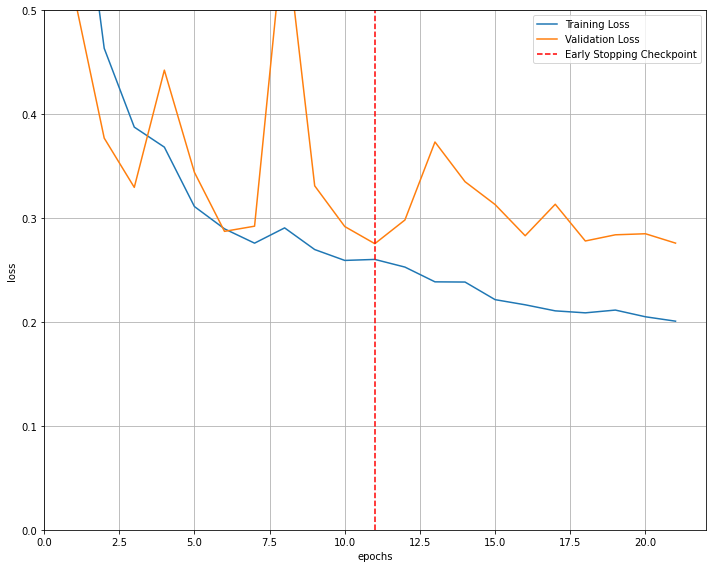

Input Image


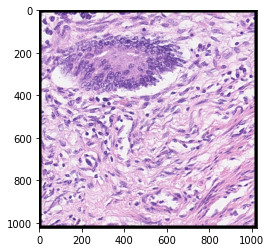

Predicted Mask Sigmoid


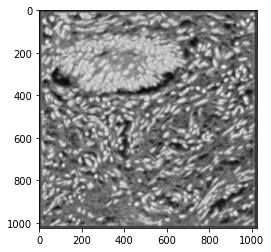

Predicted Mask Binary


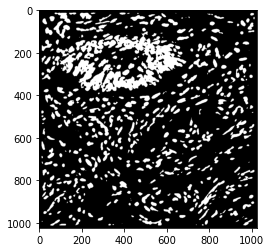

Actual Mask


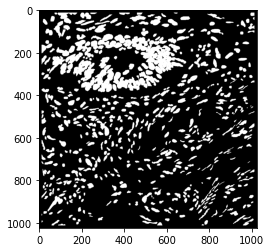

iou score: 0.6539391295119277
AJI score: 0.6539391295119277
AJI+ score: 0.6539391295119277
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6539384755734522
Panoptic Quality (PQ): 0.6539384755734522
Dice2 score: 0.7907656549668827 

Batch size: 16, Learning rate: 0.0001 , Epochs: 60











  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.622463).  Saving model ...










  2%|▏         | 1/60 [00:16<16:42, 16.99s/it]

Train Epoch: 1 @ 23:58:54.527464 - Train Loss: 0.7020 - Valid Loss: 0.6225
Validation loss decreased (0.622463 --> 0.493383).  Saving model ...










  3%|▎         | 2/60 [00:33<16:25, 17.00s/it]

Train Epoch: 2 @ 23:59:11.532120 - Train Loss: 0.5561 - Valid Loss: 0.4934
Validation loss decreased (0.493383 --> 0.443207).  Saving model ...










  5%|▌         | 3/60 [00:51<16:09, 17.01s/it]

Train Epoch: 3 @ 23:59:28.568145 - Train Loss: 0.4542 - Valid Loss: 0.4432
Validation loss decreased (0.443207 --> 0.359654).  Saving model ...










  7%|▋         | 4/60 [01:08<15:54, 17.05s/it]

Train Epoch: 4 @ 23:59:45.712736 - Train Loss: 0.3851 - Valid Loss: 0.3597
Validation loss decreased (0.359654 --> 0.337763).  Saving model ...










  8%|▊         | 5/60 [01:25<15:38, 17.07s/it]

Train Epoch: 5 @ 00:00:02.829475 - Train Loss: 0.3300 - Valid Loss: 0.3378










 10%|█         | 6/60 [01:41<15:13, 16.92s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 6 @ 00:00:19.408416 - Train Loss: 0.3025 - Valid Loss: 0.3674
Validation loss decreased (0.337763 --> 0.329489).  Saving model ...










 12%|█▏        | 7/60 [01:58<14:56, 16.91s/it]

Train Epoch: 7 @ 00:00:36.292141 - Train Loss: 0.2995 - Valid Loss: 0.3295
Validation loss decreased (0.329489 --> 0.315455).  Saving model ...










 13%|█▎        | 8/60 [02:15<14:42, 16.97s/it]

Train Epoch: 8 @ 00:00:53.394410 - Train Loss: 0.2891 - Valid Loss: 0.3155
Validation loss decreased (0.315455 --> 0.309869).  Saving model ...










 15%|█▌        | 9/60 [02:32<14:27, 17.00s/it]

Train Epoch: 9 @ 00:01:10.480286 - Train Loss: 0.2681 - Valid Loss: 0.3099
Validation loss decreased (0.309869 --> 0.304181).  Saving model ...










 17%|█▋        | 10/60 [02:49<14:10, 17.01s/it]

Train Epoch: 10 @ 00:01:27.504631 - Train Loss: 0.2561 - Valid Loss: 0.3042
Validation loss decreased (0.304181 --> 0.297601).  Saving model ...










 18%|█▊        | 11/60 [03:06<13:53, 17.01s/it]

Train Epoch: 11 @ 00:01:44.529190 - Train Loss: 0.2505 - Valid Loss: 0.2976










 20%|██        | 12/60 [03:24<13:44, 17.18s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 00:02:02.091990 - Train Loss: 0.2557 - Valid Loss: 0.2977










 22%|██▏       | 13/60 [03:41<13:20, 17.03s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 13 @ 00:02:18.760165 - Train Loss: 0.2319 - Valid Loss: 0.3027
Validation loss decreased (0.297601 --> 0.272112).  Saving model ...










 23%|██▎       | 14/60 [03:58<13:05, 17.07s/it]

Train Epoch: 14 @ 00:02:35.934069 - Train Loss: 0.2313 - Valid Loss: 0.2721










 25%|██▌       | 15/60 [04:15<12:42, 16.95s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 15 @ 00:02:52.595590 - Train Loss: 0.2225 - Valid Loss: 0.2792










 27%|██▋       | 16/60 [04:31<12:20, 16.83s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 16 @ 00:03:09.152718 - Train Loss: 0.2257 - Valid Loss: 0.2833
Validation loss decreased (0.272112 --> 0.271766).  Saving model ...










 28%|██▊       | 17/60 [04:48<12:06, 16.90s/it]

Train Epoch: 17 @ 00:03:26.213044 - Train Loss: 0.2136 - Valid Loss: 0.2718










 30%|███       | 18/60 [05:05<11:47, 16.85s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 18 @ 00:03:42.959635 - Train Loss: 0.2163 - Valid Loss: 0.2806










 32%|███▏      | 19/60 [05:22<11:27, 16.77s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 19 @ 00:03:59.543992 - Train Loss: 0.2049 - Valid Loss: 0.3025
Validation loss decreased (0.271766 --> 0.265598).  Saving model ...










 33%|███▎      | 20/60 [05:39<11:13, 16.84s/it]

Train Epoch: 20 @ 00:04:16.546621 - Train Loss: 0.2097 - Valid Loss: 0.2656










 35%|███▌      | 21/60 [05:55<10:54, 16.79s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 21 @ 00:04:33.210782 - Train Loss: 0.1958 - Valid Loss: 0.2711
Validation loss decreased (0.265598 --> 0.258077).  Saving model ...










 37%|███▋      | 22/60 [06:12<10:42, 16.90s/it]

Train Epoch: 22 @ 00:04:50.387163 - Train Loss: 0.1966 - Valid Loss: 0.2581
Validation loss decreased (0.258077 --> 0.252478).  Saving model ...










 38%|███▊      | 23/60 [06:29<10:27, 16.96s/it]

Train Epoch: 23 @ 00:05:07.472690 - Train Loss: 0.2020 - Valid Loss: 0.2525










 40%|████      | 24/60 [06:46<10:07, 16.87s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 24 @ 00:05:24.149025 - Train Loss: 0.1886 - Valid Loss: 0.2619










 42%|████▏     | 25/60 [07:03<09:47, 16.80s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 25 @ 00:05:40.770994 - Train Loss: 0.1824 - Valid Loss: 0.2695










 43%|████▎     | 26/60 [07:19<09:30, 16.78s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 26 @ 00:05:57.498643 - Train Loss: 0.1881 - Valid Loss: 0.2672










 45%|████▌     | 27/60 [07:36<09:11, 16.71s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 27 @ 00:06:14.068063 - Train Loss: 0.1847 - Valid Loss: 0.2644










 47%|████▋     | 28/60 [07:53<08:53, 16.66s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 28 @ 00:06:30.589756 - Train Loss: 0.1756 - Valid Loss: 0.2673










 48%|████▊     | 29/60 [08:09<08:36, 16.65s/it]

EarlyStopping counter: 6 out of 10
Train Epoch: 29 @ 00:06:47.223702 - Train Loss: 0.1721 - Valid Loss: 0.2695










 50%|█████     | 30/60 [08:26<08:20, 16.67s/it]

EarlyStopping counter: 7 out of 10
Train Epoch: 30 @ 00:07:03.941877 - Train Loss: 0.1714 - Valid Loss: 0.2669










 52%|█████▏    | 31/60 [08:43<08:02, 16.65s/it]

EarlyStopping counter: 8 out of 10
Train Epoch: 31 @ 00:07:20.532347 - Train Loss: 0.1669 - Valid Loss: 0.2551










 53%|█████▎    | 32/60 [08:59<07:45, 16.61s/it]

EarlyStopping counter: 9 out of 10
Train Epoch: 32 @ 00:07:37.065519 - Train Loss: 0.1642 - Valid Loss: 0.2634
EarlyStopping counter: 10 out of 10
Early stopping


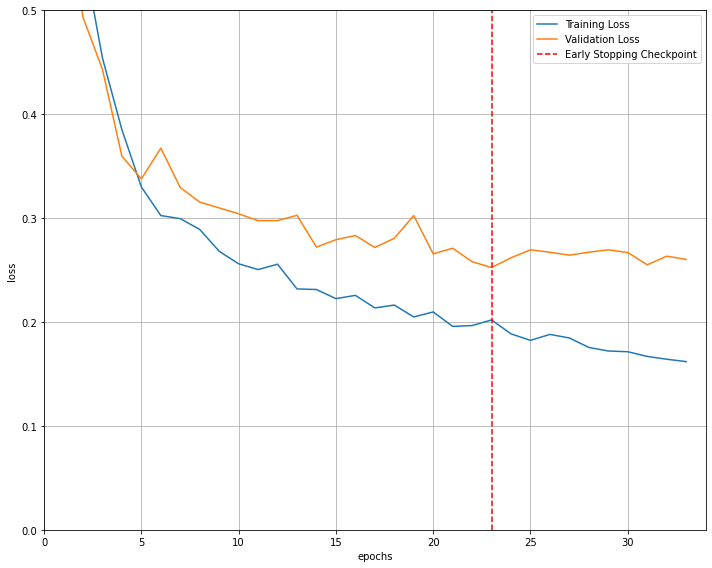

Input Image


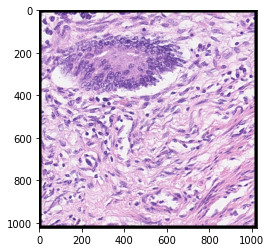

Predicted Mask Sigmoid


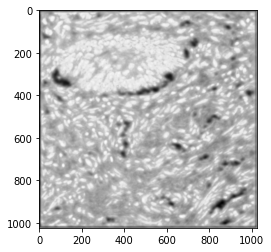

Predicted Mask Binary


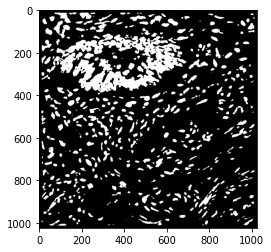

Actual Mask


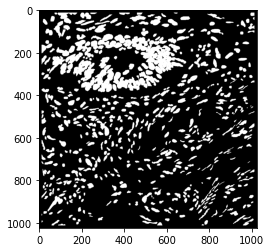

iou score: 0.6572296773667251
AJI score: 0.6572296773667251
AJI+ score: 0.6572296773667251
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.657229020137705
Panoptic Quality (PQ): 0.657229020137705
Dice2 score: 0.7931666761013333 

Batch size: 16, Learning rate: 1e-05 , Epochs: 60












  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.780470).  Saving model ...











  2%|▏         | 1/60 [00:17<16:52, 17.17s/it]

Train Epoch: 1 @ 00:08:13.987505 - Train Loss: 0.7451 - Valid Loss: 0.7805
Validation loss decreased (0.780470 --> 0.752900).  Saving model ...











  3%|▎         | 2/60 [00:34<16:38, 17.21s/it]

Train Epoch: 2 @ 00:08:31.285251 - Train Loss: 0.7312 - Valid Loss: 0.7529
Validation loss decreased (0.752900 --> 0.710696).  Saving model ...











  5%|▌         | 3/60 [00:51<16:22, 17.23s/it]

Train Epoch: 3 @ 00:08:48.575123 - Train Loss: 0.7124 - Valid Loss: 0.7107
Validation loss decreased (0.710696 --> 0.682960).  Saving model ...











  7%|▋         | 4/60 [01:08<16:04, 17.23s/it]

Train Epoch: 4 @ 00:09:05.785574 - Train Loss: 0.6915 - Valid Loss: 0.6830
Validation loss decreased (0.682960 --> 0.643101).  Saving model ...











  8%|▊         | 5/60 [01:26<15:46, 17.20s/it]

Train Epoch: 5 @ 00:09:22.930248 - Train Loss: 0.6681 - Valid Loss: 0.6431
Validation loss decreased (0.643101 --> 0.605714).  Saving model ...











 10%|█         | 6/60 [01:43<15:31, 17.24s/it]

Train Epoch: 6 @ 00:09:40.264492 - Train Loss: 0.6359 - Valid Loss: 0.6057
Validation loss decreased (0.605714 --> 0.550032).  Saving model ...











 12%|█▏        | 7/60 [02:00<15:18, 17.32s/it]

Train Epoch: 7 @ 00:09:57.781746 - Train Loss: 0.5941 - Valid Loss: 0.5500
Validation loss decreased (0.550032 --> 0.487821).  Saving model ...











 13%|█▎        | 8/60 [02:18<14:58, 17.29s/it]

Train Epoch: 8 @ 00:10:14.977594 - Train Loss: 0.5510 - Valid Loss: 0.4878
Validation loss decreased (0.487821 --> 0.452634).  Saving model ...











 15%|█▌        | 9/60 [02:35<14:42, 17.30s/it]

Train Epoch: 9 @ 00:10:32.298618 - Train Loss: 0.5129 - Valid Loss: 0.4526
Validation loss decreased (0.452634 --> 0.406780).  Saving model ...











 17%|█▋        | 10/60 [02:52<14:25, 17.32s/it]

Train Epoch: 10 @ 00:10:49.673248 - Train Loss: 0.4790 - Valid Loss: 0.4068
Validation loss decreased (0.406780 --> 0.370672).  Saving model ...











 18%|█▊        | 11/60 [03:10<14:08, 17.32s/it]

Train Epoch: 11 @ 00:11:06.999746 - Train Loss: 0.4549 - Valid Loss: 0.3707











 20%|██        | 12/60 [03:26<13:43, 17.16s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 12 @ 00:11:23.799461 - Train Loss: 0.4363 - Valid Loss: 0.3786
Validation loss decreased (0.370672 --> 0.356543).  Saving model ...











 22%|██▏       | 13/60 [03:44<13:27, 17.18s/it]

Train Epoch: 13 @ 00:11:41.002797 - Train Loss: 0.4238 - Valid Loss: 0.3565
Validation loss decreased (0.356543 --> 0.341886).  Saving model ...











 23%|██▎       | 14/60 [04:01<13:12, 17.23s/it]

Train Epoch: 14 @ 00:11:58.352713 - Train Loss: 0.4014 - Valid Loss: 0.3419











 25%|██▌       | 15/60 [04:18<12:50, 17.12s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 15 @ 00:12:15.229374 - Train Loss: 0.3911 - Valid Loss: 0.3430
Validation loss decreased (0.341886 --> 0.331237).  Saving model ...











 27%|██▋       | 16/60 [04:35<12:33, 17.13s/it]

Train Epoch: 16 @ 00:12:32.359358 - Train Loss: 0.3755 - Valid Loss: 0.3312











 28%|██▊       | 17/60 [04:52<12:13, 17.05s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 17 @ 00:12:49.241656 - Train Loss: 0.3699 - Valid Loss: 0.3376
Validation loss decreased (0.331237 --> 0.325992).  Saving model ...











 30%|███       | 18/60 [05:09<12:00, 17.15s/it]

Train Epoch: 18 @ 00:13:06.605655 - Train Loss: 0.3575 - Valid Loss: 0.3260











 32%|███▏      | 19/60 [05:26<11:40, 17.08s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 19 @ 00:13:23.522148 - Train Loss: 0.3499 - Valid Loss: 0.3303











 33%|███▎      | 20/60 [05:43<11:20, 17.02s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 20 @ 00:13:40.420340 - Train Loss: 0.3469 - Valid Loss: 0.3520











 35%|███▌      | 21/60 [06:00<11:00, 16.94s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 21 @ 00:13:57.182914 - Train Loss: 0.3431 - Valid Loss: 0.3363











 37%|███▋      | 22/60 [06:17<10:41, 16.89s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 22 @ 00:14:13.949753 - Train Loss: 0.3363 - Valid Loss: 0.3301











 38%|███▊      | 23/60 [06:33<10:24, 16.87s/it]

EarlyStopping counter: 5 out of 10
Train Epoch: 23 @ 00:14:30.770531 - Train Loss: 0.3280 - Valid Loss: 0.3283
Validation loss decreased (0.325992 --> 0.322905).  Saving model ...











 40%|████      | 24/60 [06:51<10:12, 17.01s/it]

Train Epoch: 24 @ 00:14:48.095278 - Train Loss: 0.3252 - Valid Loss: 0.3229











 42%|████▏     | 25/60 [07:08<09:53, 16.95s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 25 @ 00:15:04.906193 - Train Loss: 0.3199 - Valid Loss: 0.3248











 43%|████▎     | 26/60 [07:24<09:33, 16.88s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 26 @ 00:15:21.619183 - Train Loss: 0.3159 - Valid Loss: 0.3264











 45%|████▌     | 27/60 [07:41<09:16, 16.87s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 27 @ 00:15:38.484401 - Train Loss: 0.3137 - Valid Loss: 0.3274
Validation loss decreased (0.322905 --> 0.322100).  Saving model ...











 47%|████▋     | 28/60 [07:58<09:04, 17.00s/it]

Train Epoch: 28 @ 00:15:55.782334 - Train Loss: 0.3103 - Valid Loss: 0.3221











 48%|████▊     | 29/60 [08:15<08:44, 16.93s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 29 @ 00:16:12.557006 - Train Loss: 0.3092 - Valid Loss: 0.3223











 50%|█████     | 30/60 [08:32<08:25, 16.86s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 30 @ 00:16:29.235643 - Train Loss: 0.3050 - Valid Loss: 0.3228











 52%|█████▏    | 31/60 [08:49<08:08, 16.85s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 31 @ 00:16:46.053746 - Train Loss: 0.3044 - Valid Loss: 0.3334
Validation loss decreased (0.322100 --> 0.320273).  Saving model ...











 53%|█████▎    | 32/60 [09:06<07:54, 16.96s/it]

Train Epoch: 32 @ 00:17:03.277050 - Train Loss: 0.3020 - Valid Loss: 0.3203
Validation loss decreased (0.320273 --> 0.317101).  Saving model ...











 55%|█████▌    | 33/60 [09:23<07:39, 17.02s/it]

Train Epoch: 33 @ 00:17:20.434927 - Train Loss: 0.2986 - Valid Loss: 0.3171











 57%|█████▋    | 34/60 [09:40<07:20, 16.93s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 34 @ 00:17:37.166432 - Train Loss: 0.2973 - Valid Loss: 0.3187











 58%|█████▊    | 35/60 [09:57<07:02, 16.90s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 35 @ 00:17:53.990286 - Train Loss: 0.2975 - Valid Loss: 0.3218











 60%|██████    | 36/60 [10:14<06:45, 16.89s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 36 @ 00:18:10.855765 - Train Loss: 0.2957 - Valid Loss: 0.3269
Validation loss decreased (0.317101 --> 0.308790).  Saving model ...











 62%|██████▏   | 37/60 [10:31<06:30, 16.96s/it]

Train Epoch: 37 @ 00:18:27.988417 - Train Loss: 0.2911 - Valid Loss: 0.3088











 63%|██████▎   | 38/60 [10:47<06:11, 16.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 38 @ 00:18:44.711354 - Train Loss: 0.2898 - Valid Loss: 0.3105











 65%|██████▌   | 39/60 [11:04<05:54, 16.87s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 39 @ 00:19:01.516892 - Train Loss: 0.2890 - Valid Loss: 0.3126











 67%|██████▋   | 40/60 [11:21<05:36, 16.84s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 40 @ 00:19:18.286896 - Train Loss: 0.2859 - Valid Loss: 0.3111











 68%|██████▊   | 41/60 [11:38<05:20, 16.86s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 41 @ 00:19:35.191571 - Train Loss: 0.2838 - Valid Loss: 0.3096
Validation loss decreased (0.308790 --> 0.301047).  Saving model ...











 70%|███████   | 42/60 [11:55<05:05, 16.97s/it]

Train Epoch: 42 @ 00:19:52.433111 - Train Loss: 0.2835 - Valid Loss: 0.3010











 72%|███████▏  | 43/60 [12:12<04:47, 16.91s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 43 @ 00:20:09.205405 - Train Loss: 0.2813 - Valid Loss: 0.3040











 73%|███████▎  | 44/60 [12:29<04:29, 16.85s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 44 @ 00:20:25.895861 - Train Loss: 0.2815 - Valid Loss: 0.3033











 75%|███████▌  | 45/60 [12:45<04:12, 16.87s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 45 @ 00:20:42.808156 - Train Loss: 0.2802 - Valid Loss: 0.3070
Validation loss decreased (0.301047 --> 0.300067).  Saving model ...











 77%|███████▋  | 46/60 [13:03<03:57, 16.98s/it]

Train Epoch: 46 @ 00:21:00.064368 - Train Loss: 0.2779 - Valid Loss: 0.3001
Validation loss decreased (0.300067 --> 0.298574).  Saving model ...











 78%|███████▊  | 47/60 [13:20<03:41, 17.04s/it]

Train Epoch: 47 @ 00:21:17.249373 - Train Loss: 0.2771 - Valid Loss: 0.2986











 80%|████████  | 48/60 [13:37<03:23, 16.98s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 48 @ 00:21:34.083779 - Train Loss: 0.2754 - Valid Loss: 0.3021
Validation loss decreased (0.298574 --> 0.297971).  Saving model ...











 82%|████████▏ | 49/60 [13:54<03:07, 17.08s/it]

Train Epoch: 49 @ 00:21:51.397554 - Train Loss: 0.2763 - Valid Loss: 0.2980











 83%|████████▎ | 50/60 [14:11<02:50, 17.01s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 50 @ 00:22:08.233794 - Train Loss: 0.2729 - Valid Loss: 0.2995
Validation loss decreased (0.297971 --> 0.288446).  Saving model ...











 85%|████████▌ | 51/60 [14:28<02:33, 17.05s/it]

Train Epoch: 51 @ 00:22:25.380408 - Train Loss: 0.2712 - Valid Loss: 0.2884











 87%|████████▋ | 52/60 [14:45<02:15, 16.98s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 52 @ 00:22:42.197912 - Train Loss: 0.2696 - Valid Loss: 0.2992











 88%|████████▊ | 53/60 [15:02<01:58, 16.94s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 53 @ 00:22:59.044256 - Train Loss: 0.2707 - Valid Loss: 0.2937











 90%|█████████ | 54/60 [15:18<01:41, 16.88s/it]

EarlyStopping counter: 3 out of 10
Train Epoch: 54 @ 00:23:15.777318 - Train Loss: 0.2676 - Valid Loss: 0.2950











 92%|█████████▏| 55/60 [15:35<01:24, 16.82s/it]

EarlyStopping counter: 4 out of 10
Train Epoch: 55 @ 00:23:32.464318 - Train Loss: 0.2658 - Valid Loss: 0.2908
Validation loss decreased (0.288446 --> 0.277787).  Saving model ...











 93%|█████████▎| 56/60 [15:52<01:07, 16.93s/it]

Train Epoch: 56 @ 00:23:49.647135 - Train Loss: 0.2644 - Valid Loss: 0.2778











 95%|█████████▌| 57/60 [16:09<00:50, 16.93s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 57 @ 00:24:06.591717 - Train Loss: 0.2654 - Valid Loss: 0.2796
Validation loss decreased (0.277787 --> 0.275508).  Saving model ...











 97%|█████████▋| 58/60 [16:27<00:34, 17.02s/it]

Train Epoch: 58 @ 00:24:23.813581 - Train Loss: 0.2630 - Valid Loss: 0.2755
Validation loss decreased (0.275508 --> 0.273542).  Saving model ...











 98%|█████████▊| 59/60 [16:44<00:17, 17.12s/it]

Train Epoch: 59 @ 00:24:41.176790 - Train Loss: 0.2612 - Valid Loss: 0.2735
Validation loss decreased (0.273542 --> 0.267814).  Saving model ...











100%|██████████| 60/60 [17:01<00:00, 17.03s/it]

Train Epoch: 60 @ 00:24:58.451880 - Train Loss: 0.2606 - Valid Loss: 0.2678


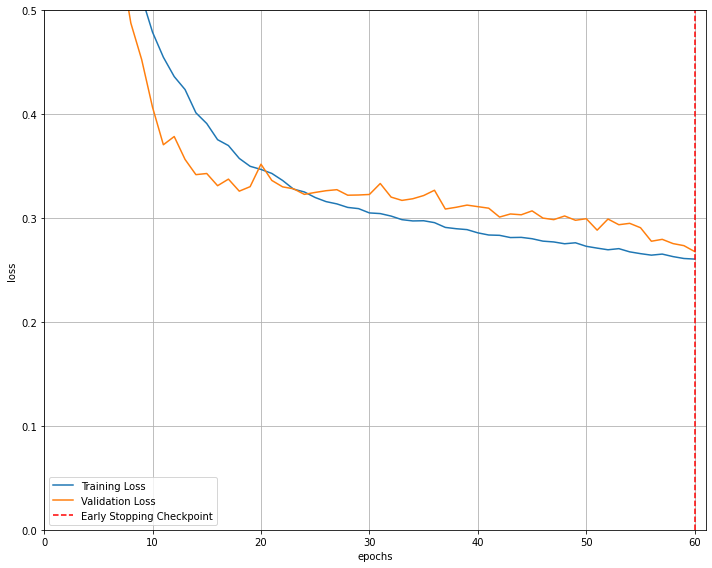

Input Image


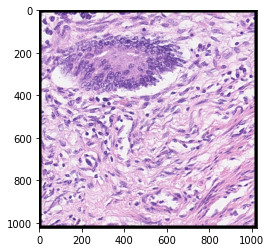

Predicted Mask Sigmoid


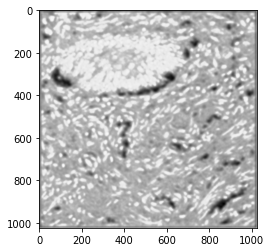

Predicted Mask Binary


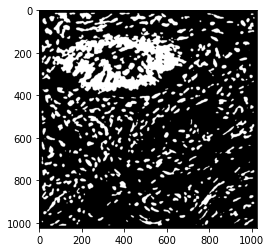

Actual Mask


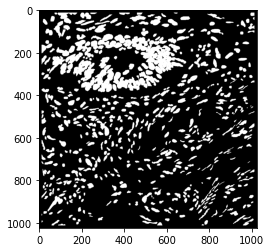

iou score: 0.6471015942385818
AJI score: 0.6471015942385818
AJI+ score: 0.6471015942385818
Detection Quality (DQ): 1.0
Segmentation Quality (SQ): 0.6471009471376348
Panoptic Quality (PQ): 0.6471009471376348
Dice2 score: 0.7857458173825912 



In [11]:
n_bs = [1, 4, 8, 16]
n_lr = [0.001, 0.0001, 0.00001]
epochs = 60
patience = 10

train_dir = "../Train"
test_dir = "../Test"

for bs in n_bs:
    for lr in n_lr:
        hyperparam_tuning(train_dir, test_dir, bs, lr, epochs, patience)

#### Model with 4 layers

250 x 250 images (best: lr 0.001, batch size 1, iou score 0.749083178315174)

In [ ]:
n_bs = [1, 4, 8, 16]
n_lr = [0.001, 0.0001, 0.00001]
epochs = 60
patience = 10

train_dir = "./Train/train_250"
test_dir = "./Test/test_250"

for bs in n_bs:
    for lr in n_lr:
        hyperparam_tuning(train_dir, test_dir, bs, lr, epochs, patience)

Batch size: 1, Learning rate: 0.001 , Epochs: 60

Loaded pretrained weights for efficientnet-b0


  0%|          | 0/60 [00:00<?, ?it/s]

Validation loss decreased (inf --> 0.320113).  Saving model ...


  2%|▏         | 1/60 [01:17<1:16:25, 77.72s/it]

Train Epoch: 1 @ 09:56:15.598999 - Train Loss: 0.4256 - Valid Loss: 0.3201
Validation loss decreased (0.320113 --> 0.295326).  Saving model ...


  3%|▎         | 2/60 [02:33<1:14:32, 77.11s/it]

Train Epoch: 2 @ 09:57:31.278136 - Train Loss: 0.3132 - Valid Loss: 0.2953


  5%|▌         | 3/60 [03:49<1:13:02, 76.89s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 3 @ 09:58:47.657533 - Train Loss: 0.2679 - Valid Loss: 0.3263


  7%|▋         | 4/60 [05:06<1:11:36, 76.73s/it]

EarlyStopping counter: 2 out of 10
Train Epoch: 4 @ 10:00:04.012878 - Train Loss: 0.2715 - Valid Loss: 0.3483
Validation loss decreased (0.295326 --> 0.294572).  Saving model ...


  8%|▊         | 5/60 [06:22<1:10:18, 76.71s/it]

Train Epoch: 5 @ 10:01:20.668957 - Train Loss: 0.2662 - Valid Loss: 0.2946
Validation loss decreased (0.294572 --> 0.277781).  Saving model ...


 10%|█         | 6/60 [07:41<1:09:32, 77.27s/it]

Train Epoch: 6 @ 10:02:39.254804 - Train Loss: 0.2499 - Valid Loss: 0.2778


 12%|█▏        | 7/60 [09:01<1:09:05, 78.23s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 7 @ 10:03:59.708905 - Train Loss: 0.2327 - Valid Loss: 0.3104
Validation loss decreased (0.277781 --> 0.276435).  Saving model ...


 13%|█▎        | 8/60 [10:17<1:07:09, 77.48s/it]

Train Epoch: 8 @ 10:05:15.451402 - Train Loss: 0.2343 - Valid Loss: 0.2764


 15%|█▌        | 9/60 [11:34<1:05:48, 77.42s/it]

EarlyStopping counter: 1 out of 10
Train Epoch: 9 @ 10:06:32.726786 - Train Loss: 0.2259 - Valid Loss: 0.2824
